# Paleomagnetism of the Teel Formation

# Teel Volcanics Data Analysis

This notebook is the data repository for a manuscript entitled:

**Paleomagnetism of the Late Ordovician Teel basalts of the Zavkhan Terrane – Paleozoic paleogeography of Mongolia**

T. M. Kilian, N. L. Swanson-Hysell, U. Bold, J. Crowley, and F. A. Macdonald

This manuscript is in review at the GSA journal Lithosphere.

This notebook contains data analysis related to paleomagnetic data generated from basalt flows of the Late Ordovician Teel Formation from the Zavkhan Terrane. The underlying data are availible both within the MagIC Database and in the GitHub repository association with this work: https://github.com/Swanson-Hysell-Group/2016_Teel_Basalts

## Import Modules

In [1]:
import sys
import pandas as pd
import pmagpy.pmag as pmag
import pmagpy.pmagplotlib as pmagplotlib
import pmagpy.ipmag as ipmag
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, Image
from mpl_toolkits.basemap import Basemap
%config InlineBackend.figure_formats = {'svg',}
%matplotlib inline

In [2]:
pd.set_option('display.notebook_repr_html', True)

def _repr_latex_(self):
    return self.to_latex()

pd.DataFrame._repr_latex_ = _repr_latex_  # monkey patch pandas DataFrame

Write template file (no_code.tplx) so that when the notebook is converted to latex (then pdf) it excludes the large code blocks. This requires an additional arguement when using nbconveter and also requires that adding tables of content term after the document begins; can also add author. Can't include examples here because they affect the file when in latex.

In [3]:
%%writefile no_code_latex.tplx

% Default to the notebook output style
((* if not cell_style is defined *))
    ((* set cell_style = 'style_ipython.tplx' *))
((* endif *))

((*- extends 'article.tplx' -*))
% Disable input cells
((* block input_group *))
((* endblock input_group *))

%===============================================================================
% Latex Article
%===============================================================================

((* block docclass *))
\documentclass[11pt]{article}
((* endblock docclass *))


Overwriting no_code_latex.tplx


## Sampling localities

Table of site locality coordinates given in WGS84 as well as a very simple map. Exact stratigraphic positions are shown in main text; order of stratigraphic position is given in "stat_pos" column of table. The paleomagnetic data from these sites may need to be tilt-corrected (depending on the the age of magnetization) according to nearby measurements of bedding. The bedding tilts used for sites Z30 to Z55 come from interflow sedimentary rocks. The tilt-corrections for Z56 to Z58 are more uncertain and are based on interpretted flow banding.

In [4]:
teel_2015_site_locs = pd.read_csv('../Data/MagIC_format/er_sites.txt',sep='\t',header=1)
teel_strat_index = pd.read_csv('../Data/tables/site_ids.csv',header=0,index_col=0)
teel_site_bedding = pd.read_csv('../Data/tables/site_tilt_corrections.txt',sep='\t',header=0,index_col=0)
teel_2015_site_locs.insert(5,'strat_pos',list(teel_strat_index['strat_pos']))
teel_2015_site_locs.insert(6,'sample_bed_dip_direction',list(teel_site_bedding['sample_bed_dip_direction']))
teel_2015_site_locs.insert(7,'sample_bed_dip',list(teel_site_bedding['sample_bed_dip']))
teel_2015_site_locs.to_csv('./notebook_output/Teel_site_latlong')
teel_2015_site_locs

,er_citation_names,er_location_name,er_site_name,site_lat,site_lon,strat_pos,sample_bed_dip_direction,sample_bed_dip
0,This study,Khukh_Davaa,Z30,47.10038,95.37550,4.0,88,58
1,This study,Khukh_Davaa,Z31,47.10049,95.37604,5.0,88,58
2,This study,Khukh_Davaa,Z32,47.10094,95.37684,6.0,84,55
3,This study,Khukh_Davaa,Z33,47.10107,95.37705,7.0,84,55
4,This study,Khukh_Davaa,Z34,47.10111,95.37712,8.0,84,55
5,This study,Khukh_Davaa,Z35,47.10069,95.37747,9.0,84,55
6,This study,Khukh_Davaa,Z36,47.10221,95.37959,11.0,89,47
7,This study,Khukh_Davaa,Z37,47.10211,95.37971,12.0,89,47
8,This study,Khukh_Davaa,Z38,47.09855,95.38445,13.0,87,46
9,This study,Khukh_Davaa,Z39,47.09860,95.38467,14.0,87,46


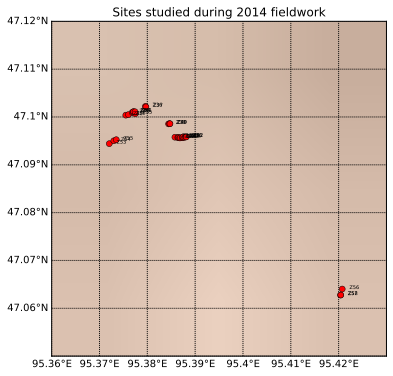

In [5]:
fig = plt.figure(figsize=(6,6))
m = Basemap(projection='cyl',llcrnrlat=47.05,urcrnrlat=47.12,llcrnrlon=95.36,
            urcrnrlon=95.43,resolution='h',area_thresh = 0.1)
m.shadedrelief()
m.drawrivers(color='#99ffff')
parallels = np.arange(45,48,0.01)
m.drawparallels(parallels,labels=[1,0,0,0],fontsize=10)
meridians = np.arange(95,96,0.01)
m.drawmeridians(meridians,labels=[0,0,0,1],fontsize=10)
plt.title('Sites studied during 2014 fieldwork')

s_long=[]
s_lat=[]
for n in range(0,len(teel_2015_site_locs)):
    s_long.append(teel_2015_site_locs['site_lon'][n])          
    s_lat.append(teel_2015_site_locs['site_lat'][n])
x,y = m(s_long,s_lat)
m.plot(x, y, 'ro', markersize=6)

labels = teel_2015_site_locs['er_site_name']    
labels
for label, xpt, ypt in zip(labels, x, y):
    plt.text(xpt+0.0015, ypt, label,fontsize=5)
plt.savefig('./notebook_output/site_map.pdf')
plt.show()

## Site level data

Below we import paleomagnetic results that were analyzed using demag_gui.py from the PmagPy python package. These are the vector component fits to all Teel sample data. Components have been classified according to their relative temperature ranges. 'LOW' components are typically below 200ºC, 'MAG' refers to a temperature range within the unblocking range of magnetite (up to 580ºC), 'HEM' refers to vector components fit to data points in the unblocking range of hematite (up to 680ºC), and 'MID' refers to components with temperature ranges between 'LOW' and 'MAG'.

In [6]:
Teel_data_raw = pd.read_csv('../Data/MagIC_format/pmag_specimens.txt',sep='\t',header=1)

#### Z30

Site Z30 is a rhyolite. The site has 'LOW', 'MAG' and poorly resolved 'HEM' components.

In [7]:
Z30_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z30']
Z30_geo = Z30_all[Z30_all['specimen_tilt_correction'] == 0]
Z30_tc = Z30_all[Z30_all['specimen_tilt_correction'] == 100]
Z30_tc.reset_index(inplace=True)
Z30_geo.reset_index(inplace=True)
Z30_l_geo = Z30_geo[Z30_geo['specimen_comp_name'] == 'LOW']
Z30_l_tc = Z30_tc[Z30_tc['specimen_comp_name'] == 'LOW']
Z30_ma_geo = Z30_geo[Z30_geo['specimen_comp_name'] == 'MAG']
Z30_h_geo = Z30_geo[Z30_geo['specimen_comp_name'] == 'HEM']
Z30_ma_tc = Z30_tc[Z30_tc['specimen_comp_name'] == 'MAG']
Z30_h_tc = Z30_tc[Z30_tc['specimen_comp_name'] == 'HEM']

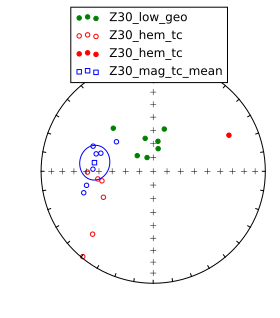

In [8]:
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_ma,inc_ma,dec_h,inc_h = [],[],[],[],[],[]
dec_l_tc,inc_l_tc,dec_ma_geo,inc_ma_geo,dec_h_geo,inc_h_geo = [],[],[],[],[],[]
dec_l,inc_l = list(Z30_l_geo['specimen_dec'].values),list(Z30_l_geo['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z30_l_tc['specimen_dec'].values),list(Z30_l_tc['specimen_inc'].values)
dec_ma,inc_ma = list(Z30_ma_tc['specimen_dec'].values),list(Z30_ma_tc['specimen_inc'].values)
dec_h,inc_h = list(Z30_h_tc['specimen_dec'].values),list(Z30_h_tc['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z30_ma_geo['specimen_dec'].values),list(Z30_ma_geo['specimen_inc'].values)
dec_h_geo,inc_h_geo = list(Z30_h_geo['specimen_dec'].values),list(Z30_h_geo['specimen_inc'].values)
Z30_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z30_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc)
Z30_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z30_hem_tc_dir = ipmag.make_di_block(dec_h,inc_h)
Z30_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z30_hem_geo_dir = ipmag.make_di_block(dec_h_geo,inc_h_geo)
Z30_low_tc_mean=pmag.fisher_mean(Z30_low_tc_dir) # calc means
Z30_mag_tc_mean=pmag.fisher_mean(Z30_mag_tc_dir)
Z30_hem_tc_mean=pmag.fisher_mean(Z30_hem_tc_dir)
Z30_low_geo_mean=pmag.fisher_mean(Z30_low_geo_dir) # calc means
Z30_mag_geo_mean=pmag.fisher_mean(Z30_mag_geo_dir)
Z30_hem_geo_mean=pmag.fisher_mean(Z30_hem_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z30_low_geo')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di(dec_h,inc_h,color='red',label='Z30_hem_tc')
ipmag.plot_di_mean(Z30_mag_tc_mean['dec'],Z30_mag_tc_mean['inc'],
                  Z30_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z30_mag_tc_mean')
plt.legend(loc=(.15,.85))
plt.show()

#### Z31

The site has 'LOW' (less than 200ºC) and 'MAG' components.

In [9]:
Z31_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z31']
Z31_geo = Z31_all[Z31_all['specimen_tilt_correction'] == 0]
Z31_tc = Z31_all[Z31_all['specimen_tilt_correction'] == 100]
Z31_tc.reset_index(inplace=True)
Z31_geo.reset_index(inplace=True)
Z31_l_geo = Z31_geo[Z31_geo['specimen_comp_name'] == 'LOW']
Z31_l_tc = Z31_tc[Z31_tc['specimen_comp_name'] == 'LOW']
Z31_ma_tc = Z31_tc[Z31_tc['specimen_comp_name'] == 'MAG']
Z31_ma_geo = Z31_geo[Z31_geo['specimen_comp_name'] == 'MAG']

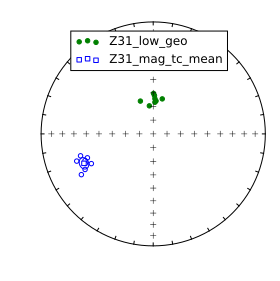

In [10]:
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_ma,inc_ma = [],[],[],[]
dec_l_tc,inc_l_tc,dec_ma_geo,inc_ma_geo = [],[],[],[]
dec_l,inc_l = list(Z31_l_geo['specimen_dec'].values),list(Z31_l_geo['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z31_l_tc['specimen_dec'].values),list(Z31_l_tc['specimen_inc'].values)
dec_ma,inc_ma = list(Z31_ma_tc['specimen_dec'].values),list(Z31_ma_tc['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z31_ma_geo['specimen_dec'].values),list(Z31_ma_geo['specimen_inc'].values)
Z31_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z31_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc) # make unit vectors for pmag.fisher_mean()
Z31_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z31_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z31_low_tc_mean=pmag.fisher_mean(Z31_low_tc_dir) # calc means
Z31_mag_tc_mean=pmag.fisher_mean(Z31_mag_tc_dir)
Z31_low_geo_mean=pmag.fisher_mean(Z31_low_geo_dir) 
Z31_mag_geo_mean=pmag.fisher_mean(Z31_mag_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z31_low_geo')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di_mean(Z31_mag_tc_mean['dec'],Z31_mag_tc_mean['inc'],
                  Z31_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z31_mag_tc_mean')
plt.legend(loc=(.15,.75))
plt.show()

#### Z32

The site has 'LOW' (less than 200ºC) and 'MAG' components.

In [11]:
Z32_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z32']
Z32_geo = Z32_all[Z32_all['specimen_tilt_correction'] == 0]
Z32_tc = Z32_all[Z32_all['specimen_tilt_correction'] == 100]
Z32_tc.reset_index(inplace=True)
Z32_geo.reset_index(inplace=True)
Z32_l_geo = Z32_geo[Z32_geo['specimen_comp_name'] == 'LOW']
Z32_l_tc = Z32_tc[Z32_tc['specimen_comp_name'] == 'LOW']
Z32_ma_tc = Z32_tc[Z32_tc['specimen_comp_name'] == 'MAG']
Z32_ma_geo = Z32_geo[Z32_geo['specimen_comp_name'] == 'MAG']

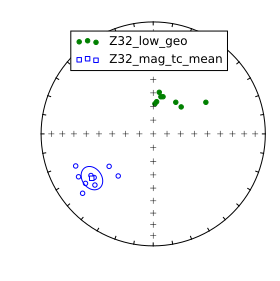

In [12]:
Z32_l_tc_edit,Z32_l_geo_edit = [],[]
Z32_l_tc_edit = Z32_l_tc
Z32_l_tc_edit = Z32_l_tc_edit[Z32_l_tc_edit['er_sample_name'] != 'Z32.3'] 
Z32_l_geo_edit = Z32_l_geo
Z32_l_geo_edit = Z32_l_geo_edit[Z32_l_geo_edit['er_sample_name'] != 'Z32.3'] 
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_ma,inc_ma = [],[],[],[]
dec_l_tc,inc_l_tc,dec_ma_geo,inc_ma_geo = [],[],[],[]
dec_l,inc_l = list(Z32_l_geo_edit['specimen_dec'].values),list(Z32_l_geo_edit['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z32_l_tc_edit['specimen_dec'].values),list(Z32_l_tc_edit['specimen_inc'].values)
dec_ma,inc_ma = list(Z32_ma_tc['specimen_dec'].values),list(Z32_ma_tc['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z32_ma_geo['specimen_dec'].values),list(Z32_ma_geo['specimen_inc'].values)
Z32_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z32_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc) # make unit vectors for pmag.fisher_mean()
Z32_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z32_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z32_low_tc_mean=pmag.fisher_mean(Z32_low_geo_dir) # calc means
Z32_mag_tc_mean=pmag.fisher_mean(Z32_mag_tc_dir)
Z32_low_geo_mean=pmag.fisher_mean(Z32_low_geo_dir) 
Z32_mag_geo_mean=pmag.fisher_mean(Z32_mag_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z32_low_geo')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di_mean(Z32_mag_tc_mean['dec'],Z32_mag_tc_mean['inc'],
                  Z32_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z32_mag_tc_mean')
plt.legend(loc=(.15,.75))
plt.show()

#### Z33

The site has 'LOW' (less than 200ºC) and 'MAG' components.

In [13]:
Z33_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z33']
Z33_geo = Z33_all[Z33_all['specimen_tilt_correction'] == 0]
Z33_tc = Z33_all[Z33_all['specimen_tilt_correction'] == 100]
Z33_tc.reset_index(inplace=True)
Z33_geo.reset_index(inplace=True)
Z33_l_geo = Z33_geo[Z33_geo['specimen_comp_name'] == 'LOW']
Z33_l_tc = Z33_tc[Z33_tc['specimen_comp_name'] == 'LOW']
Z33_ma_tc = Z33_tc[Z33_tc['specimen_comp_name'] == 'MAG']
Z33_ma_geo = Z33_geo[Z33_geo['specimen_comp_name'] == 'MAG']

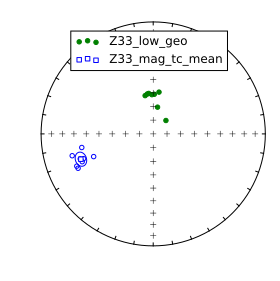

In [14]:
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_ma,inc_ma = [],[],[],[]
dec_l_tc,inc_l_tc,dec_ma_geo,inc_ma_geo = [],[],[],[]
dec_l,inc_l = list(Z33_l_geo['specimen_dec'].values),list(Z33_l_geo['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z33_l_tc['specimen_dec'].values),list(Z33_l_tc['specimen_inc'].values)
dec_ma,inc_ma = list(Z33_ma_tc['specimen_dec'].values),list(Z33_ma_tc['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z33_ma_geo['specimen_dec'].values),list(Z33_ma_geo['specimen_inc'].values)
Z33_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z33_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc) # make unit vectors for pmag.fisher_mean()
Z33_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z33_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z33_low_tc_mean=pmag.fisher_mean(Z33_low_tc_dir) # calc means
Z33_mag_tc_mean=pmag.fisher_mean(Z33_mag_tc_dir)
Z33_low_geo_mean=pmag.fisher_mean(Z33_low_geo_dir) 
Z33_mag_geo_mean=pmag.fisher_mean(Z33_mag_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z33_low_geo')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di_mean(Z33_mag_tc_mean['dec'],Z33_mag_tc_mean['inc'],
                  Z33_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z33_mag_tc_mean')
plt.legend(loc=(.15,.75))
plt.show()

#### Z34

The site has 'LOW' (less than 200ºC) and 'MAG' components.

In [15]:
Z34_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z34']
Z34_geo = Z34_all[Z34_all['specimen_tilt_correction'] == 0]
Z34_tc = Z34_all[Z34_all['specimen_tilt_correction'] == 100]
Z34_tc.reset_index(inplace=True)
Z34_geo.reset_index(inplace=True)
Z34_l_geo = Z34_geo[Z34_geo['specimen_comp_name'] == 'LOW']
Z34_l_tc = Z34_tc[Z34_tc['specimen_comp_name'] == 'LOW']
Z34_ma_tc = Z34_tc[Z34_tc['specimen_comp_name'] == 'MAG']
Z34_ma_geo = Z34_geo[Z34_geo['specimen_comp_name'] == 'MAG']

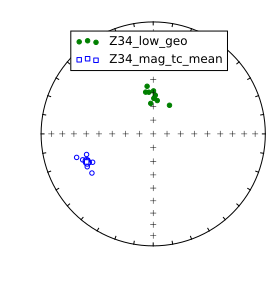

In [16]:
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_ma,inc_ma = [],[],[],[]
dec_l_tc,inc_l_tc,dec_ma_geo,inc_ma_geo = [],[],[],[]
dec_l,inc_l = list(Z34_l_geo['specimen_dec'].values),list(Z34_l_geo['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z34_l_tc['specimen_dec'].values),list(Z34_l_tc['specimen_inc'].values)
dec_ma,inc_ma = list(Z34_ma_tc['specimen_dec'].values),list(Z34_ma_tc['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z34_ma_geo['specimen_dec'].values),list(Z34_ma_geo['specimen_inc'].values)
Z34_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z34_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc) # make unit vectors for pmag.fisher_mean()
Z34_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z34_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z34_low_tc_mean=pmag.fisher_mean(Z34_low_tc_dir) # calc means
Z34_mag_tc_mean=pmag.fisher_mean(Z34_mag_tc_dir)
Z34_low_geo_mean=pmag.fisher_mean(Z34_low_geo_dir) 
Z34_mag_geo_mean=pmag.fisher_mean(Z34_mag_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z34_low_geo')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di_mean(Z34_mag_tc_mean['dec'],Z34_mag_tc_mean['inc'],
                  Z34_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z34_mag_tc_mean')
plt.legend(loc=(.15,.75))
plt.show()

#### Z35

The site has 'LOW', 'MAG' and 'HEM' components.

In [17]:
Z35_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z35']
Z35_geo = Z35_all[Z35_all['specimen_tilt_correction'] == 0]
Z35_tc = Z35_all[Z35_all['specimen_tilt_correction'] == 100]
Z35_tc.reset_index(inplace=True)
Z35_geo.reset_index(inplace=True)
Z35_l_geo = Z35_geo[Z35_geo['specimen_comp_name'] == 'LOW']
Z35_l_tc = Z35_tc[Z35_tc['specimen_comp_name'] == 'LOW']
Z35_ma_geo = Z35_geo[Z35_geo['specimen_comp_name'] == 'MAG']
Z35_h_geo = Z35_geo[Z35_geo['specimen_comp_name'] == 'HEM']
Z35_ma_tc = Z35_tc[Z35_tc['specimen_comp_name'] == 'MAG']
Z35_h_tc = Z35_tc[Z35_tc['specimen_comp_name'] == 'HEM']

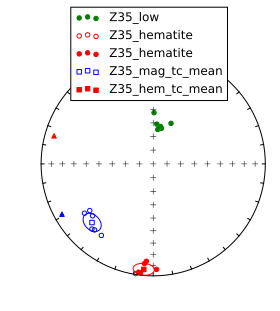

In [18]:
#Below are samples components that were dropped because they were clear outliers
#...irregular demagnetization behavior from sample Z35.3 - dropped from mean calc
Z35_h_tc_edit,Z35_ma_tc_edit,Z35_h_geo_edit,Z35_ma_geo_edit,Z35_l_tc_edit,Z35_l_geo_edit = [],[],[],[],[],[]
Z35_l_tc_edit = Z35_l_tc
Z35_l_tc_edit = Z35_l_tc_edit[Z35_l_tc_edit['er_sample_name'] != 'Z35.3'] 
Z35_l_geo_edit = Z35_l_geo
Z35_l_geo_edit = Z35_l_geo_edit[Z35_l_geo_edit['er_sample_name'] != 'Z35.3'] 
Z35_h_tc_edit = Z35_h_tc
Z35_h_tc_edit = Z35_h_tc_edit[Z35_h_tc_edit['er_sample_name'] != 'Z35.3'] 
Z35_ma_tc_edit = Z35_ma_tc
Z35_ma_tc_edit = Z35_ma_tc_edit[Z35_ma_tc_edit['er_sample_name'] != 'Z35.3']
Z35_h_geo_edit = Z35_h_geo
Z35_h_geo_edit = Z35_h_geo_edit[Z35_h_geo_edit['er_sample_name'] != 'Z35.3'] 
Z35_ma_geo_edit = Z35_ma_geo
Z35_ma_geo_edit = Z35_ma_geo_edit[Z35_ma_geo_edit['er_sample_name'] != 'Z35.3']
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_ma,inc_ma,dec_h,inc_h = [],[],[],[],[],[]
dec_l_tc,inc_l_tc,dec_ma_geo,inc_ma_geo,dec_h_geo,inc_h_geo = [],[],[],[],[],[]
dec_l,inc_l = list(Z35_l_geo_edit['specimen_dec'].values),list(Z35_l_geo_edit['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z35_l_tc_edit['specimen_dec'].values),list(Z35_l_tc_edit['specimen_inc'].values)
dec_ma,inc_ma = list(Z35_ma_tc_edit['specimen_dec'].values),list(Z35_ma_tc_edit['specimen_inc'].values)
dec_h,inc_h = list(Z35_h_tc_edit['specimen_dec'].values),list(Z35_h_tc_edit['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z35_ma_geo_edit['specimen_dec'].values),list(Z35_ma_geo_edit['specimen_inc'].values)
dec_h_geo,inc_h_geo = list(Z35_h_geo_edit['specimen_dec'].values),list(Z35_h_geo_edit['specimen_inc'].values)
Z35_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z35_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc)
Z35_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z35_hem_tc_dir = ipmag.make_di_block(dec_h,inc_h)
Z35_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z35_hem_geo_dir = ipmag.make_di_block(dec_h_geo,inc_h_geo)
Z35_low_tc_mean=pmag.fisher_mean(Z35_low_tc_dir) # calc means
Z35_mag_tc_mean=pmag.fisher_mean(Z35_mag_tc_dir)
Z35_hem_tc_mean=pmag.fisher_mean(Z35_hem_tc_dir)
Z35_low_geo_mean=pmag.fisher_mean(Z35_low_geo_dir) # calc means
Z35_mag_geo_mean=pmag.fisher_mean(Z35_mag_geo_dir)
Z35_hem_geo_mean=pmag.fisher_mean(Z35_hem_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z35_low')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di(Z35_ma_tc[Z35_ma_tc['er_sample_name']=='Z35.3']['specimen_dec'].values,
              Z35_ma_tc[Z35_ma_tc['er_sample_name']=='Z35.3']['specimen_inc'].values,color='b',marker='^')
ipmag.plot_di(dec_h,inc_h,color='red',label='Z35_hematite')
ipmag.plot_di(Z35_h_tc[Z35_h_tc['er_sample_name']=='Z35.3']['specimen_dec'].values,
              Z35_h_tc[Z35_h_tc['er_sample_name']=='Z35.3']['specimen_inc'].values,color='r',marker='^')
ipmag.plot_di_mean(Z35_mag_tc_mean['dec'],Z35_mag_tc_mean['inc'],
                  Z35_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z35_mag_tc_mean')
ipmag.plot_di_mean(Z35_hem_tc_mean['dec'],Z35_hem_tc_mean['inc'],
                  Z35_hem_tc_mean["alpha95"],color='r',marker='s',
                  label='Z35_hem_tc_mean')
plt.legend(loc=(.15,.75))
plt.show()

Data points shown with triangles were vectors from sample Z35.3 that were dropped from the mean calculation.

#### Z36

The site has 'LOW' and 'MAG' components.

In [19]:
Z36_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z36']
Z36_geo = Z36_all[Z36_all['specimen_tilt_correction'] == 0]
Z36_tc = Z36_all[Z36_all['specimen_tilt_correction'] == 100]
Z36_tc.reset_index(inplace=True)
Z36_geo.reset_index(inplace=True)
Z36_l_geo = Z36_geo[Z36_geo['specimen_comp_name'] == 'LOW']
Z36_l_tc = Z36_tc[Z36_tc['specimen_comp_name'] == 'LOW']
Z36_ma_tc = Z36_tc[Z36_tc['specimen_comp_name'] == 'MAG']
Z36_ma_geo = Z36_geo[Z36_geo['specimen_comp_name'] == 'MAG']

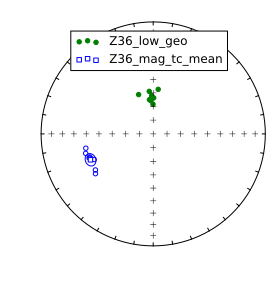

In [20]:
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_ma,inc_ma = [],[],[],[]
dec_l_tc,inc_l_tc,dec_ma_geo,inc_ma_geo = [],[],[],[]
dec_l,inc_l = list(Z36_l_geo['specimen_dec'].values),list(Z36_l_geo['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z36_l_tc['specimen_dec'].values),list(Z36_l_tc['specimen_inc'].values)
dec_ma,inc_ma = list(Z36_ma_tc['specimen_dec'].values),list(Z36_ma_tc['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z36_ma_geo['specimen_dec'].values),list(Z36_ma_geo['specimen_inc'].values)
Z36_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z36_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc) # make unit vectors for pmag.fisher_mean()
Z36_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z36_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z36_low_tc_mean=pmag.fisher_mean(Z36_low_tc_dir) # calc means
Z36_mag_tc_mean=pmag.fisher_mean(Z36_mag_tc_dir)
Z36_low_geo_mean=pmag.fisher_mean(Z36_low_geo_dir) 
Z36_mag_geo_mean=pmag.fisher_mean(Z36_mag_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z36_low_geo')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di_mean(Z36_mag_tc_mean['dec'],Z36_mag_tc_mean['inc'],
                  Z36_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z36_mag_tc_mean')
plt.legend(loc=(.15,.75))
plt.show()

#### Z37

The site has 'LOW' and 'MAG' components.

In [21]:
Z37_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z37']
Z37_geo = Z37_all[Z37_all['specimen_tilt_correction'] == 0]
Z37_tc = Z37_all[Z37_all['specimen_tilt_correction'] == 100]
Z37_tc.reset_index(inplace=True)
Z37_geo.reset_index(inplace=True)
Z37_l_geo = Z37_geo[Z37_geo['specimen_comp_name'] == 'LOW']
Z37_l_tc = Z37_tc[Z37_tc['specimen_comp_name'] == 'LOW']
Z37_ma_tc = Z37_tc[Z37_tc['specimen_comp_name'] == 'MAG']
Z37_ma_geo = Z37_geo[Z37_geo['specimen_comp_name'] == 'MAG']

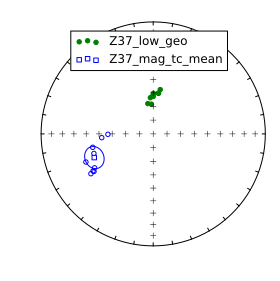

In [22]:
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_ma,inc_ma = [],[],[],[]
dec_l_tc,inc_l_tc,dec_ma_geo,inc_ma_geo = [],[],[],[]
dec_l,inc_l = list(Z37_l_geo['specimen_dec'].values),list(Z37_l_geo['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z37_l_tc['specimen_dec'].values),list(Z37_l_tc['specimen_inc'].values)
dec_ma,inc_ma = list(Z37_ma_tc['specimen_dec'].values),list(Z37_ma_tc['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z37_ma_geo['specimen_dec'].values),list(Z37_ma_geo['specimen_inc'].values)
Z37_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z37_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc) # make unit vectors for pmag.fisher_mean()
Z37_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z37_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z37_low_tc_mean=pmag.fisher_mean(Z37_low_tc_dir) # calc means
Z37_mag_tc_mean=pmag.fisher_mean(Z37_mag_tc_dir)
Z37_low_geo_mean=pmag.fisher_mean(Z37_low_geo_dir) 
Z37_mag_geo_mean=pmag.fisher_mean(Z37_mag_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z37_low_geo')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di_mean(Z37_mag_tc_mean['dec'],Z37_mag_tc_mean['inc'],
                  Z37_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z37_mag_tc_mean')
plt.legend(loc=(.15,.75))
plt.show()

#### Z38

The site has 'LOW', 'MAG' and 'HEM' components.

In [23]:
Z38_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z38']
Z38_geo = Z38_all[Z38_all['specimen_tilt_correction'] == 0]
Z38_tc = Z38_all[Z38_all['specimen_tilt_correction'] == 100]
Z38_tc.reset_index(inplace=True)
Z38_geo.reset_index(inplace=True)
Z38_l_geo = Z38_geo[Z38_geo['specimen_comp_name'] == 'LOW']
Z38_l_tc = Z38_tc[Z38_tc['specimen_comp_name'] == 'LOW']
Z38_ma_geo = Z38_geo[Z38_geo['specimen_comp_name'] == 'MAG']
Z38_h_geo = Z38_geo[Z38_geo['specimen_comp_name'] == 'HEM']
Z38_ma_tc = Z38_tc[Z38_tc['specimen_comp_name'] == 'MAG']
Z38_h_tc = Z38_tc[Z38_tc['specimen_comp_name'] == 'HEM']

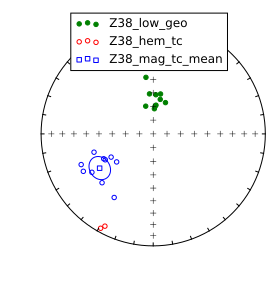

In [24]:
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_ma,inc_ma,dec_h,inc_h = [],[],[],[],[],[]
dec_l_tc,inc_l_tc,dec_ma_geo,inc_ma_geo,dec_h_geo,inc_h_geo = [],[],[],[],[],[]
dec_l,inc_l = list(Z38_l_geo['specimen_dec'].values),list(Z38_l_geo['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z38_l_tc['specimen_dec'].values),list(Z38_l_tc['specimen_inc'].values)
dec_ma,inc_ma = list(Z38_ma_tc['specimen_dec'].values),list(Z38_ma_tc['specimen_inc'].values)
dec_h,inc_h = list(Z38_h_tc['specimen_dec'].values),list(Z38_h_tc['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z38_ma_geo['specimen_dec'].values),list(Z38_ma_geo['specimen_inc'].values)
dec_h_geo,inc_h_geo = list(Z38_h_geo['specimen_dec'].values),list(Z38_h_geo['specimen_inc'].values)
Z38_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z38_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc)
Z38_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z38_hem_tc_dir = ipmag.make_di_block(dec_h,inc_h)
Z38_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z38_hem_geo_dir = ipmag.make_di_block(dec_h_geo,inc_h_geo)
Z38_low_tc_mean=pmag.fisher_mean(Z38_low_tc_dir) # calc means
Z38_mag_tc_mean=pmag.fisher_mean(Z38_mag_tc_dir)
Z38_low_geo_mean=pmag.fisher_mean(Z38_low_geo_dir) # calc means
Z38_mag_geo_mean=pmag.fisher_mean(Z38_mag_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z38_low_geo')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di(dec_h,inc_h,color='red',label='Z38_hem_tc')
ipmag.plot_di_mean(Z38_mag_tc_mean['dec'],Z38_mag_tc_mean['inc'],
                  Z38_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z38_mag_tc_mean')
plt.legend(loc=(.15,.75))
plt.show()

Only two samples yielded hematite components, therefore no mean was calculated for the hematite component.

#### Z39

The site has 'LOW', 'MAG' and 'HEM' components.

In [25]:
Z39_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z39']
Z39_geo = Z39_all[Z39_all['specimen_tilt_correction'] == 0]
Z39_tc = Z39_all[Z39_all['specimen_tilt_correction'] == 100]
Z39_tc.reset_index(inplace=True)
Z39_geo.reset_index(inplace=True)
Z39_l_geo = Z39_geo[Z39_geo['specimen_comp_name'] == 'LOW']
Z39_l_tc = Z39_tc[Z39_tc['specimen_comp_name'] == 'LOW']
Z39_ma_geo = Z39_geo[Z39_geo['specimen_comp_name'] == 'MAG']
Z39_h_geo = Z39_geo[Z39_geo['specimen_comp_name'] == 'HEM']
Z39_ma_tc = Z39_tc[Z39_tc['specimen_comp_name'] == 'MAG']
Z39_h_tc = Z39_tc[Z39_tc['specimen_comp_name'] == 'HEM']

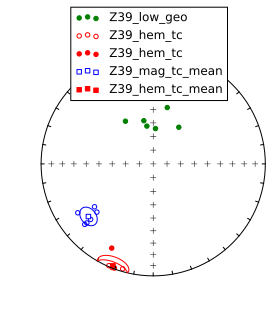

In [26]:
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_ma,inc_ma,dec_h,inc_h = [],[],[],[],[],[]
dec_l_tc,inc_l_tc,dec_ma_geo,inc_ma_geo,dec_h_geo,inc_h_geo = [],[],[],[],[],[]
dec_l,inc_l = list(Z39_l_geo['specimen_dec'].values),list(Z39_l_geo['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z39_l_tc['specimen_dec'].values),list(Z39_l_tc['specimen_inc'].values)
dec_ma,inc_ma = list(Z39_ma_tc['specimen_dec'].values),list(Z39_ma_tc['specimen_inc'].values)
dec_h,inc_h = list(Z39_h_tc['specimen_dec'].values),list(Z39_h_tc['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z39_ma_geo['specimen_dec'].values),list(Z39_ma_geo['specimen_inc'].values)
dec_h_geo,inc_h_geo = list(Z39_h_geo['specimen_dec'].values),list(Z39_h_geo['specimen_inc'].values)
Z39_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z39_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc)
Z39_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z39_hem_tc_dir = ipmag.make_di_block(dec_h,inc_h)
Z39_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z39_hem_geo_dir = ipmag.make_di_block(dec_h_geo,inc_h_geo)
Z39_low_tc_mean=pmag.fisher_mean(Z39_low_tc_dir) # calc means
Z39_mag_tc_mean=pmag.fisher_mean(Z39_mag_tc_dir)
Z39_hem_tc_mean=pmag.fisher_mean(Z39_hem_tc_dir)
Z39_low_geo_mean=pmag.fisher_mean(Z39_low_geo_dir) # calc means
Z39_mag_geo_mean=pmag.fisher_mean(Z39_mag_geo_dir)
Z39_hem_geo_mean=pmag.fisher_mean(Z39_hem_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z39_low_geo')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di(dec_h,inc_h,color='red',label='Z39_hem_tc')
ipmag.plot_di_mean(Z39_mag_tc_mean['dec'],Z39_mag_tc_mean['inc'],
                  Z39_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z39_mag_tc_mean')
ipmag.plot_di_mean(Z39_hem_tc_mean['dec'],Z39_hem_tc_mean['inc'],
                  Z39_hem_tc_mean["alpha95"],color='r',marker='s',
                  label='Z39_hem_tc_mean')
plt.legend(loc=(.15,.75))
plt.show()

#### Z40

The site has 'LOW', 'MAG' and 'HEM' components.

In [27]:
Z40_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z40']
Z40_geo = Z40_all[Z40_all['specimen_tilt_correction'] == 0]
Z40_tc = Z40_all[Z40_all['specimen_tilt_correction'] == 100]
Z40_tc.reset_index(inplace=True)
Z40_geo.reset_index(inplace=True)
Z40_l_geo = Z40_geo[Z40_geo['specimen_comp_name'] == 'LOW']
Z40_l_tc = Z40_tc[Z40_tc['specimen_comp_name'] == 'LOW']
Z40_ma_geo = Z40_geo[Z40_geo['specimen_comp_name'] == 'MAG']
Z40_h_geo = Z40_geo[Z40_geo['specimen_comp_name'] == 'HEM']
Z40_ma_tc = Z40_tc[Z40_tc['specimen_comp_name'] == 'MAG']
Z40_h_tc = Z40_tc[Z40_tc['specimen_comp_name'] == 'HEM']

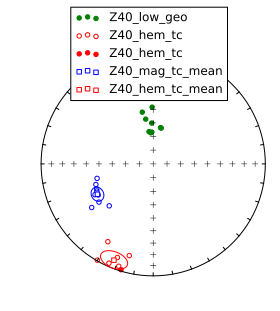

In [28]:
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_ma,inc_ma,dec_h,inc_h = [],[],[],[],[],[]
dec_l_tc,inc_l_tc,dec_ma_geo,inc_ma_geo,dec_h_geo,inc_h_geo = [],[],[],[],[],[]
dec_l,inc_l = list(Z40_l_geo['specimen_dec'].values),list(Z40_l_geo['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z40_l_tc['specimen_dec'].values),list(Z40_l_tc['specimen_inc'].values)
dec_ma,inc_ma = list(Z40_ma_tc['specimen_dec'].values),list(Z40_ma_tc['specimen_inc'].values)
dec_h,inc_h = list(Z40_h_tc['specimen_dec'].values),list(Z40_h_tc['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z40_ma_geo['specimen_dec'].values),list(Z40_ma_geo['specimen_inc'].values)
dec_h_geo,inc_h_geo = list(Z40_h_geo['specimen_dec'].values),list(Z40_h_geo['specimen_inc'].values)
Z40_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z40_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc)
Z40_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z40_hem_tc_dir = ipmag.make_di_block(dec_h,inc_h)
Z40_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z40_hem_geo_dir = ipmag.make_di_block(dec_h_geo,inc_h_geo)
Z40_low_tc_mean=pmag.fisher_mean(Z40_low_tc_dir) # calc means
Z40_mag_tc_mean=pmag.fisher_mean(Z40_mag_tc_dir)
Z40_hem_tc_mean=pmag.fisher_mean(Z40_hem_tc_dir)
Z40_low_geo_mean=pmag.fisher_mean(Z40_low_geo_dir) # calc means
Z40_mag_geo_mean=pmag.fisher_mean(Z40_mag_geo_dir)
Z40_hem_geo_mean=pmag.fisher_mean(Z40_hem_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z40_low_geo')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di(dec_h,inc_h,color='red',label='Z40_hem_tc')
ipmag.plot_di_mean(Z40_mag_tc_mean['dec'],Z40_mag_tc_mean['inc'],
                  Z40_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z40_mag_tc_mean')
ipmag.plot_di_mean(Z40_hem_tc_mean['dec'],Z40_hem_tc_mean['inc'],
                  Z40_hem_tc_mean["alpha95"],color='r',marker='s',
                  label='Z40_hem_tc_mean')
plt.legend(loc=(.15,.75))
plt.show()

#### Z41
The site has 'LOW', 'MAG' and 'HEM' components.

In [29]:
Z41_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z41']
Z41_geo = Z41_all[Z41_all['specimen_tilt_correction'] == 0]
Z41_tc = Z41_all[Z41_all['specimen_tilt_correction'] == 100]
Z41_tc.reset_index(inplace=True)
Z41_geo.reset_index(inplace=True)
Z41_l_geo = Z41_geo[Z41_geo['specimen_comp_name'] == 'LOW']
Z41_l_tc = Z41_tc[Z41_tc['specimen_comp_name'] == 'LOW']
Z41_ma_geo = Z41_geo[Z41_geo['specimen_comp_name'] == 'MAG']
Z41_h_geo = Z41_geo[Z41_geo['specimen_comp_name'] == 'HEM']
Z41_ma_tc = Z41_tc[Z41_tc['specimen_comp_name'] == 'MAG']
Z41_h_tc = Z41_tc[Z41_tc['specimen_comp_name'] == 'HEM']

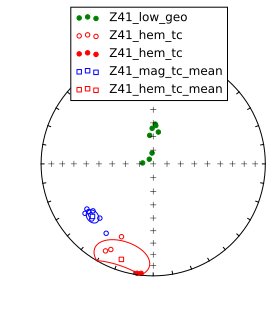

In [30]:
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_ma,inc_ma,dec_h,inc_h = [],[],[],[],[],[]
dec_l_tc,inc_l_tc,dec_ma_geo,inc_ma_geo,dec_h_geo,inc_h_geo = [],[],[],[],[],[]
dec_l,inc_l = list(Z41_l_geo['specimen_dec'].values),list(Z41_l_geo['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z41_l_tc['specimen_dec'].values),list(Z41_l_tc['specimen_inc'].values)
dec_ma,inc_ma = list(Z41_ma_tc['specimen_dec'].values),list(Z41_ma_tc['specimen_inc'].values)
dec_h,inc_h = list(Z41_h_tc['specimen_dec'].values),list(Z41_h_tc['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z41_ma_geo['specimen_dec'].values),list(Z41_ma_geo['specimen_inc'].values)
dec_h_geo,inc_h_geo = list(Z41_h_geo['specimen_dec'].values),list(Z41_h_geo['specimen_inc'].values)
Z41_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z41_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc)
Z41_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z41_hem_tc_dir = ipmag.make_di_block(dec_h,inc_h)
Z41_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z41_hem_geo_dir = ipmag.make_di_block(dec_h_geo,inc_h_geo)
Z41_low_tc_mean=pmag.fisher_mean(Z41_low_tc_dir) # calc means
Z41_mag_tc_mean=pmag.fisher_mean(Z41_mag_tc_dir)
Z41_hem_tc_mean=pmag.fisher_mean(Z41_hem_tc_dir)
Z41_low_geo_mean=pmag.fisher_mean(Z41_low_geo_dir) # calc means
Z41_mag_geo_mean=pmag.fisher_mean(Z41_mag_geo_dir)
Z41_hem_geo_mean=pmag.fisher_mean(Z41_hem_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z41_low_geo')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di(dec_h,inc_h,color='red',label='Z41_hem_tc')
ipmag.plot_di_mean(Z41_mag_tc_mean['dec'],Z41_mag_tc_mean['inc'],
                  Z41_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z41_mag_tc_mean')
ipmag.plot_di_mean(Z41_hem_tc_mean['dec'],Z41_hem_tc_mean['inc'],
                  Z41_hem_tc_mean["alpha95"],color='r',marker='s',
                  label='Z41_hem_tc_mean')
plt.legend(loc=(.15,.75))
plt.show()

#### Z42

The site has 'LOW', 'MAG' and 'HEM' components. A middle temperature component, MID, was also fit to demagnetization steps between 'LOW' and 'MAG'.

In [31]:
Z42_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z42']
Z42_geo = Z42_all[Z42_all['specimen_tilt_correction'] == 0]
Z42_tc = Z42_all[Z42_all['specimen_tilt_correction'] == 100]
Z42_tc.reset_index(inplace=True)
Z42_geo.reset_index(inplace=True)
Z42_l_geo = Z42_geo[Z42_geo['specimen_comp_name'] == 'LOW']
Z42_l_tc = Z42_tc[Z42_tc['specimen_comp_name'] == 'LOW']
Z42_ma_geo = Z42_geo[Z42_geo['specimen_comp_name'] == 'MAG']
Z42_h_geo = Z42_geo[Z42_geo['specimen_comp_name'] == 'HEM']
Z42_ma_tc = Z42_tc[Z42_tc['specimen_comp_name'] == 'MAG']
Z42_h_tc = Z42_tc[Z42_tc['specimen_comp_name'] == 'HEM']
Z42_mi_tc = Z42_tc[Z42_tc['specimen_comp_name'] == 'MID']
Z42_mi_geo = Z42_geo[Z42_geo['specimen_comp_name'] == 'MID']

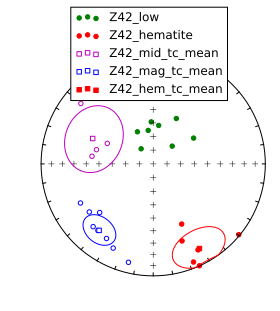

In [32]:
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_mi,inc_mi,dec_ma,inc_ma,dec_h,inc_h = [],[],[],[],[],[],[],[]
dec_l_tc,inc_l_tc,dec_mi_geo,inc_mi_geo,dec_ma_geo,inc_ma_geo,dec_h_geo,inc_h_geo = [],[],[],[],[],[],[],[]
dec_l,inc_l = list(Z42_l_geo['specimen_dec'].values),list(Z42_l_geo['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z42_l_tc['specimen_dec'].values),list(Z42_l_tc['specimen_inc'].values)
dec_mi,inc_mi = list(Z42_mi_tc['specimen_dec'].values),list(Z42_mi_tc['specimen_inc'].values)
dec_ma,inc_ma = list(Z42_ma_tc['specimen_dec'].values),list(Z42_ma_tc['specimen_inc'].values)
dec_h,inc_h = list(Z42_h_tc['specimen_dec'].values),list(Z42_h_tc['specimen_inc'].values)
dec_mi_geo,inc_mi_geo = list(Z42_mi_geo['specimen_dec'].values),list(Z42_mi_geo['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z42_ma_geo['specimen_dec'].values),list(Z42_ma_geo['specimen_inc'].values)
dec_h_geo,inc_h_geo = list(Z42_h_geo['specimen_dec'].values),list(Z42_h_geo['specimen_inc'].values)
Z42_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z42_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc)
Z42_mid_tc_dir = ipmag.make_di_block(dec_mi,inc_mi)
Z42_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z42_hem_tc_dir = ipmag.make_di_block(dec_h,inc_h)
Z42_mid_geo_dir = ipmag.make_di_block(dec_mi_geo,inc_mi_geo)
Z42_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z42_hem_geo_dir = ipmag.make_di_block(dec_h_geo,inc_h_geo)
Z42_low_tc_mean=pmag.fisher_mean(Z42_low_tc_dir) # calc means
Z42_mid_tc_mean=pmag.fisher_mean(Z42_mid_tc_dir)
Z42_mag_tc_mean=pmag.fisher_mean(Z42_mag_tc_dir)
Z42_hem_tc_mean=pmag.fisher_mean(Z42_hem_tc_dir)
Z42_low_geo_mean=pmag.fisher_mean(Z42_low_geo_dir) # calc means
Z42_mid_geo_mean=pmag.fisher_mean(Z42_mid_geo_dir)
Z42_mag_geo_mean=pmag.fisher_mean(Z42_mag_geo_dir)
Z42_hem_geo_mean=pmag.fisher_mean(Z42_hem_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z42_low')
ipmag.plot_di(dec_mi,inc_mi,color='m')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di(dec_h,inc_h,color='red',label='Z42_hematite')
ipmag.plot_di_mean(Z42_mid_tc_mean['dec'],Z42_mid_tc_mean['inc'],
                  Z42_mid_tc_mean["alpha95"],color='m',marker='s',
                  label='Z42_mid_tc_mean')
ipmag.plot_di_mean(Z42_mag_tc_mean['dec'],Z42_mag_tc_mean['inc'],
                  Z42_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z42_mag_tc_mean')
ipmag.plot_di_mean(Z42_hem_tc_mean['dec'],Z42_hem_tc_mean['inc'],
                  Z42_hem_tc_mean["alpha95"],color='r',marker='s',
                  label='Z42_hem_tc_mean')
plt.legend(loc=(.15,.75))
plt.show()

#### Z43

The site has 'LOW', 'MAG' and 'HEM' components. A middle temperature component, MID, was also fit to demagnetization steps between 'LOW' and 'MAG'.

In [33]:
Z43_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z43']
Z43_geo = Z43_all[Z43_all['specimen_tilt_correction'] == 0]
Z43_tc = Z43_all[Z43_all['specimen_tilt_correction'] == 100]
Z43_tc.reset_index(inplace=True)
Z43_geo.reset_index(inplace=True)
Z43_l_geo = Z43_geo[Z43_geo['specimen_comp_name'] == 'LOW']
Z43_l_tc = Z43_tc[Z43_tc['specimen_comp_name'] == 'LOW']
Z43_ma_geo = Z43_geo[Z43_geo['specimen_comp_name'] == 'MAG']
Z43_h_geo = Z43_geo[Z43_geo['specimen_comp_name'] == 'HEM']
Z43_ma_tc = Z43_tc[Z43_tc['specimen_comp_name'] == 'MAG']
Z43_h_tc = Z43_tc[Z43_tc['specimen_comp_name'] == 'HEM']
Z43_mi_tc = Z43_tc[Z43_tc['specimen_comp_name'] == 'MID']
Z43_mi_geo = Z43_geo[Z43_geo['specimen_comp_name'] == 'MID']

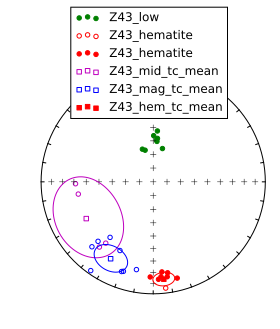

In [34]:
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_mi,inc_mi,dec_ma,inc_ma,dec_h,inc_h = [],[],[],[],[],[],[],[]
dec_l_tc,inc_l_tc,dec_mi_geo,inc_mi_geo,dec_ma_geo,inc_ma_geo,dec_h_geo,inc_h_geo = [],[],[],[],[],[],[],[]
dec_l,inc_l = list(Z43_l_geo['specimen_dec'].values),list(Z43_l_geo['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z43_l_tc['specimen_dec'].values),list(Z43_l_tc['specimen_inc'].values)
dec_mi,inc_mi = list(Z43_mi_tc['specimen_dec'].values),list(Z43_mi_tc['specimen_inc'].values)
dec_ma,inc_ma = list(Z43_ma_tc['specimen_dec'].values),list(Z43_ma_tc['specimen_inc'].values)
dec_h,inc_h = list(Z43_h_tc['specimen_dec'].values),list(Z43_h_tc['specimen_inc'].values)
dec_mi_geo,inc_mi_geo = list(Z43_mi_geo['specimen_dec'].values),list(Z43_mi_geo['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z43_ma_geo['specimen_dec'].values),list(Z43_ma_geo['specimen_inc'].values)
dec_h_geo,inc_h_geo = list(Z43_h_geo['specimen_dec'].values),list(Z43_h_geo['specimen_inc'].values)
Z43_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z43_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc)
Z43_mid_tc_dir = ipmag.make_di_block(dec_mi,inc_mi)
Z43_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z43_hem_tc_dir = ipmag.make_di_block(dec_h,inc_h)
Z43_mid_geo_dir = ipmag.make_di_block(dec_mi_geo,inc_mi_geo)
Z43_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z43_hem_geo_dir = ipmag.make_di_block(dec_h_geo,inc_h_geo)
Z43_low_tc_mean=pmag.fisher_mean(Z43_low_tc_dir) # calc means
Z43_mid_tc_mean=pmag.fisher_mean(Z43_mid_tc_dir)
Z43_mag_tc_mean=pmag.fisher_mean(Z43_mag_tc_dir)
Z43_hem_tc_mean=pmag.fisher_mean(Z43_hem_tc_dir)
Z43_low_geo_mean=pmag.fisher_mean(Z43_low_geo_dir) # calc means
Z43_mid_geo_mean=pmag.fisher_mean(Z43_mid_geo_dir)
Z43_mag_geo_mean=pmag.fisher_mean(Z43_mag_geo_dir)
Z43_hem_geo_mean=pmag.fisher_mean(Z43_hem_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z43_low')
ipmag.plot_di(dec_mi,inc_mi,color='m')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di(dec_h,inc_h,color='red',label='Z43_hematite')
ipmag.plot_di_mean(Z43_mid_tc_mean['dec'],Z43_mid_tc_mean['inc'],
                  Z43_mid_tc_mean["alpha95"],color='m',marker='s',
                  label='Z43_mid_tc_mean')
ipmag.plot_di_mean(Z43_mag_tc_mean['dec'],Z43_mag_tc_mean['inc'],
                  Z43_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z43_mag_tc_mean')
ipmag.plot_di_mean(Z43_hem_tc_mean['dec'],Z43_hem_tc_mean['inc'],
                  Z43_hem_tc_mean["alpha95"],color='r',marker='s',
                  label='Z43_hem_tc_mean')
plt.legend(loc=(.15,.75))
plt.show()

#### Z44

The site has 'LOW', 'MAG' and 'HEM' components.

In [35]:
Z44_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z44']
Z44_geo = Z44_all[Z44_all['specimen_tilt_correction'] == 0]
Z44_tc = Z44_all[Z44_all['specimen_tilt_correction'] == 100]
Z44_tc.reset_index(inplace=True)
Z44_geo.reset_index(inplace=True)
Z44_l_geo = Z44_geo[Z44_geo['specimen_comp_name'] == 'LOW']
Z44_l_tc = Z44_tc[Z44_tc['specimen_comp_name'] == 'LOW']
Z44_ma_geo = Z44_geo[Z44_geo['specimen_comp_name'] == 'MAG']
Z44_h_geo = Z44_geo[Z44_geo['specimen_comp_name'] == 'HEM']
Z44_ma_tc = Z44_tc[Z44_tc['specimen_comp_name'] == 'MAG']
Z44_h_tc = Z44_tc[Z44_tc['specimen_comp_name'] == 'HEM']

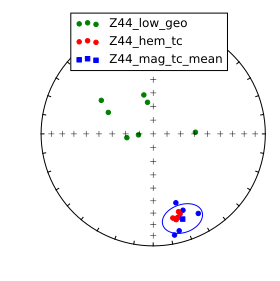

In [36]:
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_ma,inc_ma,dec_h,inc_h = [],[],[],[],[],[]
dec_l_tc,inc_l_tc,dec_ma_geo,inc_ma_geo,dec_h_geo,inc_h_geo = [],[],[],[],[],[]
dec_l,inc_l = list(Z44_l_geo['specimen_dec'].values),list(Z44_l_geo['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z44_l_tc['specimen_dec'].values),list(Z44_l_tc['specimen_inc'].values)
dec_ma,inc_ma = list(Z44_ma_tc['specimen_dec'].values),list(Z44_ma_tc['specimen_inc'].values)
dec_h,inc_h = list(Z44_h_tc['specimen_dec'].values),list(Z44_h_tc['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z44_ma_geo['specimen_dec'].values),list(Z44_ma_geo['specimen_inc'].values)
dec_h_geo,inc_h_geo = list(Z44_h_geo['specimen_dec'].values),list(Z44_h_geo['specimen_inc'].values)
Z44_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z44_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc)
Z44_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z44_hem_tc_dir = ipmag.make_di_block(dec_h,inc_h)
Z44_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z44_hem_geo_dir = ipmag.make_di_block(dec_h_geo,inc_h_geo)
Z44_low_tc_mean=pmag.fisher_mean(Z44_low_tc_dir) # calc means
Z44_mag_tc_mean=pmag.fisher_mean(Z44_mag_tc_dir)
Z44_hem_tc_mean=pmag.fisher_mean(Z44_hem_tc_dir)
Z44_low_geo_mean=pmag.fisher_mean(Z44_low_geo_dir) # calc means
Z44_mag_geo_mean=pmag.fisher_mean(Z44_mag_geo_dir)
Z44_hem_geo_mean=pmag.fisher_mean(Z44_hem_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z44_low_geo')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di(dec_h,inc_h,color='red',label='Z44_hem_tc')
ipmag.plot_di_mean(Z44_mag_tc_mean['dec'],Z44_mag_tc_mean['inc'],
                  Z44_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z44_mag_tc_mean')
plt.legend(loc=(.15,.75))
plt.show()

The remanence of Z44 specimens is dominated by hematite such that the magnetite component is poorly resolved.

#### Z45

Hematite, magnetite, and low temperature, LOW (less than 200ºC), components were calculated for Z45.

In [37]:
Z45_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z45']
Z45_geo = Z45_all[Z45_all['specimen_tilt_correction'] == 0]
Z45_tc = Z45_all[Z45_all['specimen_tilt_correction'] == 100]
Z45_tc.reset_index(inplace=True)
Z45_geo.reset_index(inplace=True)
Z45_l_geo = Z45_geo[Z45_geo['specimen_comp_name'] == 'LOW']
Z45_l_tc = Z45_tc[Z45_tc['specimen_comp_name'] == 'LOW']
Z45_ma_geo = Z45_geo[Z45_geo['specimen_comp_name'] == 'MAG']
Z45_h_geo = Z45_geo[Z45_geo['specimen_comp_name'] == 'HEM']
Z45_ma_tc = Z45_tc[Z45_tc['specimen_comp_name'] == 'MAG']
Z45_h_tc = Z45_tc[Z45_tc['specimen_comp_name'] == 'HEM']

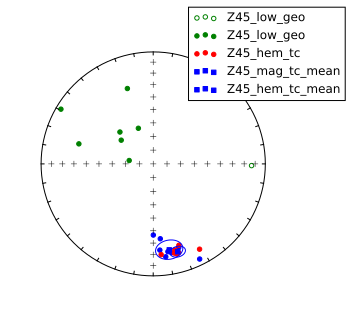

In [38]:
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_ma,inc_ma,dec_h,inc_h = [],[],[],[],[],[]
dec_l_tc,inc_l_tc,dec_ma_geo,inc_ma_geo,dec_h_geo,inc_h_geo = [],[],[],[],[],[]
dec_l,inc_l = list(Z45_l_geo['specimen_dec'].values),list(Z45_l_geo['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z45_l_tc['specimen_dec'].values),list(Z45_l_tc['specimen_inc'].values)
dec_ma,inc_ma = list(Z45_ma_tc['specimen_dec'].values),list(Z45_ma_tc['specimen_inc'].values)
dec_h,inc_h = list(Z45_h_tc['specimen_dec'].values),list(Z45_h_tc['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z45_ma_geo['specimen_dec'].values),list(Z45_ma_geo['specimen_inc'].values)
dec_h_geo,inc_h_geo = list(Z45_h_geo['specimen_dec'].values),list(Z45_h_geo['specimen_inc'].values)
Z45_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z45_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc)
Z45_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z45_hem_tc_dir = ipmag.make_di_block(dec_h,inc_h)
Z45_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z45_hem_geo_dir = ipmag.make_di_block(dec_h_geo,inc_h_geo)
Z45_low_tc_mean=pmag.fisher_mean(Z45_low_tc_dir) # calc means
Z45_mag_tc_mean=pmag.fisher_mean(Z45_mag_tc_dir)
Z45_hem_tc_mean=pmag.fisher_mean(Z45_hem_tc_dir)
Z45_low_geo_mean=pmag.fisher_mean(Z45_low_geo_dir) # calc means
Z45_mag_geo_mean=pmag.fisher_mean(Z45_mag_geo_dir)
Z45_hem_geo_mean=pmag.fisher_mean(Z45_hem_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z45_low_geo')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di(dec_h,inc_h,color='red',label='Z45_hem_tc')
ipmag.plot_di_mean(Z45_mag_tc_mean['dec'],Z45_mag_tc_mean['inc'],
                  Z45_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z45_mag_tc_mean')
ipmag.plot_di_mean(Z45_hem_tc_mean['dec'],Z45_hem_tc_mean['inc'],
                  Z45_hem_tc_mean["alpha95"],color='b',marker='s',
                  label='Z45_hem_tc_mean')
plt.legend(loc=(.65,.75))
plt.show()

The remanence of Z45 specimens is dominated by hematite such that the magnetite component is poorly resolved.

#### Z46

The site has 'LOW', 'MAG' and 'HEM' components.

In [39]:
Z46_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z46']
Z46_geo = Z46_all[Z46_all['specimen_tilt_correction'] == 0]
Z46_tc = Z46_all[Z46_all['specimen_tilt_correction'] == 100]
Z46_tc.reset_index(inplace=True)
Z46_geo.reset_index(inplace=True)
Z46_l_geo = Z46_geo[Z46_geo['specimen_comp_name'] == 'LOW']
Z46_l_tc = Z46_tc[Z46_tc['specimen_comp_name'] == 'LOW']
Z46_ma_geo = Z46_geo[Z46_geo['specimen_comp_name'] == 'MAG']
Z46_h_geo = Z46_geo[Z46_geo['specimen_comp_name'] == 'HEM']
Z46_ma_tc = Z46_tc[Z46_tc['specimen_comp_name'] == 'MAG']
Z46_h_tc = Z46_tc[Z46_tc['specimen_comp_name'] == 'HEM']

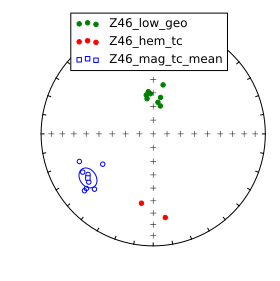

In [40]:
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_ma,inc_ma,dec_h,inc_h = [],[],[],[],[],[]
dec_l_tc,inc_l_tc,dec_ma_geo,inc_ma_geo,dec_h_geo,inc_h_geo = [],[],[],[],[],[]
dec_l,inc_l = list(Z46_l_geo['specimen_dec'].values),list(Z46_l_geo['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z46_l_tc['specimen_dec'].values),list(Z46_l_tc['specimen_inc'].values)
dec_ma,inc_ma = list(Z46_ma_tc['specimen_dec'].values),list(Z46_ma_tc['specimen_inc'].values)
dec_h,inc_h = list(Z46_h_tc['specimen_dec'].values),list(Z46_h_tc['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z46_ma_geo['specimen_dec'].values),list(Z46_ma_geo['specimen_inc'].values)
dec_h_geo,inc_h_geo = list(Z46_h_geo['specimen_dec'].values),list(Z46_h_geo['specimen_inc'].values)
Z46_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z46_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc)
Z46_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z46_hem_tc_dir = ipmag.make_di_block(dec_h,inc_h)
Z46_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z46_hem_geo_dir = ipmag.make_di_block(dec_h_geo,inc_h_geo)
Z46_low_tc_mean=pmag.fisher_mean(Z46_low_tc_dir) # calc means
Z46_mag_tc_mean=pmag.fisher_mean(Z46_mag_tc_dir)
Z46_low_geo_mean=pmag.fisher_mean(Z46_low_geo_dir) # calc means
Z46_mag_geo_mean=pmag.fisher_mean(Z46_mag_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z46_low_geo')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di(dec_h,inc_h,color='red',label='Z46_hem_tc')
ipmag.plot_di_mean(Z46_mag_tc_mean['dec'],Z46_mag_tc_mean['inc'],
                  Z46_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z46_mag_tc_mean')
plt.legend(loc=(.15,.75))
plt.show()

#### Z47

The site has 'LOW', 'MAG' and 'HEM' components.

In [41]:
Z47_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z47']
Z47_geo = Z47_all[Z47_all['specimen_tilt_correction'] == 0]
Z47_tc = Z47_all[Z47_all['specimen_tilt_correction'] == 100]
Z47_tc.reset_index(inplace=True)
Z47_geo.reset_index(inplace=True)
Z47_l_geo = Z47_geo[Z47_geo['specimen_comp_name'] == 'LOW']
Z47_l_tc = Z47_tc[Z47_tc['specimen_comp_name'] == 'LOW']
Z47_ma_geo = Z47_geo[Z47_geo['specimen_comp_name'] == 'MAG']
Z47_h_geo = Z47_geo[Z47_geo['specimen_comp_name'] == 'HEM']
Z47_ma_tc = Z47_tc[Z47_tc['specimen_comp_name'] == 'MAG']
Z47_h_tc = Z47_tc[Z47_tc['specimen_comp_name'] == 'HEM']

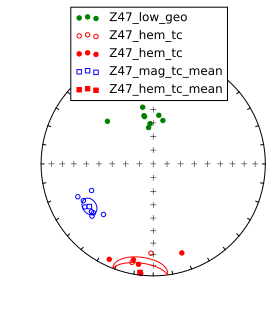

In [42]:
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_ma,inc_ma,dec_h,inc_h = [],[],[],[],[],[]
dec_l_tc,inc_l_tc,dec_ma_geo,inc_ma_geo,dec_h_geo,inc_h_geo = [],[],[],[],[],[]
dec_l,inc_l = list(Z47_l_geo['specimen_dec'].values),list(Z47_l_geo['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z47_l_tc['specimen_dec'].values),list(Z47_l_tc['specimen_inc'].values)
dec_ma,inc_ma = list(Z47_ma_tc['specimen_dec'].values),list(Z47_ma_tc['specimen_inc'].values)
dec_h,inc_h = list(Z47_h_tc['specimen_dec'].values),list(Z47_h_tc['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z47_ma_geo['specimen_dec'].values),list(Z47_ma_geo['specimen_inc'].values)
dec_h_geo,inc_h_geo = list(Z47_h_geo['specimen_dec'].values),list(Z47_h_geo['specimen_inc'].values)
Z47_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z47_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc)
Z47_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z47_hem_tc_dir = ipmag.make_di_block(dec_h,inc_h)
Z47_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z47_hem_geo_dir = ipmag.make_di_block(dec_h_geo,inc_h_geo)
Z47_low_tc_mean=pmag.fisher_mean(Z47_low_tc_dir) # calc means
Z47_mag_tc_mean=pmag.fisher_mean(Z47_mag_tc_dir)
Z47_hem_tc_mean=pmag.fisher_mean(Z47_hem_tc_dir)
Z47_low_geo_mean=pmag.fisher_mean(Z47_low_geo_dir) # calc means
Z47_mag_geo_mean=pmag.fisher_mean(Z47_mag_geo_dir)
Z47_hem_geo_mean=pmag.fisher_mean(Z47_hem_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z47_low_geo')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di(dec_h,inc_h,color='red',label='Z47_hem_tc')
ipmag.plot_di_mean(Z47_mag_tc_mean['dec'],Z47_mag_tc_mean['inc'],
                  Z47_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z47_mag_tc_mean')
ipmag.plot_di_mean(Z47_hem_tc_mean['dec'],Z47_hem_tc_mean['inc'],
                  Z47_hem_tc_mean["alpha95"],color='r',marker='s',
                  label='Z47_hem_tc_mean')
plt.legend(loc=(.15,.75))
plt.show()

#### Z48

The site has 'LOW', 'MAG' and 'HEM' components.

In [43]:
Z48_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z48']
Z48_geo = Z48_all[Z48_all['specimen_tilt_correction'] == 0]
Z48_tc = Z48_all[Z48_all['specimen_tilt_correction'] == 100]
Z48_tc.reset_index(inplace=True)
Z48_geo.reset_index(inplace=True)
Z48_l_geo = Z48_geo[Z48_geo['specimen_comp_name'] == 'LOW']
Z48_l_tc = Z48_tc[Z48_tc['specimen_comp_name'] == 'LOW']
Z48_ma_geo = Z48_geo[Z48_geo['specimen_comp_name'] == 'MAG']
Z48_h_geo = Z48_geo[Z48_geo['specimen_comp_name'] == 'HEM']
Z48_ma_tc = Z48_tc[Z48_tc['specimen_comp_name'] == 'MAG']
Z48_h_tc = Z48_tc[Z48_tc['specimen_comp_name'] == 'HEM']

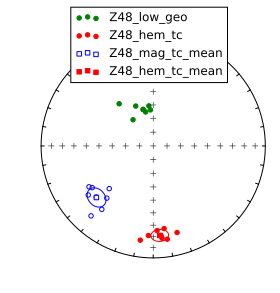

In [44]:
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_ma,inc_ma,dec_h,inc_h = [],[],[],[],[],[]
dec_l_tc,inc_l_tc,dec_ma_geo,inc_ma_geo,dec_h_geo,inc_h_geo = [],[],[],[],[],[]
dec_l,inc_l = list(Z48_l_geo['specimen_dec'].values),list(Z48_l_geo['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z48_l_tc['specimen_dec'].values),list(Z48_l_tc['specimen_inc'].values)
dec_ma,inc_ma = list(Z48_ma_tc['specimen_dec'].values),list(Z48_ma_tc['specimen_inc'].values)
dec_h,inc_h = list(Z48_h_tc['specimen_dec'].values),list(Z48_h_tc['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z48_ma_geo['specimen_dec'].values),list(Z48_ma_geo['specimen_inc'].values)
dec_h_geo,inc_h_geo = list(Z48_h_geo['specimen_dec'].values),list(Z48_h_geo['specimen_inc'].values)
Z48_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z48_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc)
Z48_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z48_hem_tc_dir = ipmag.make_di_block(dec_h,inc_h)
Z48_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z48_hem_geo_dir = ipmag.make_di_block(dec_h_geo,inc_h_geo)
Z48_low_tc_mean=pmag.fisher_mean(Z48_low_tc_dir) # calc means
Z48_mag_tc_mean=pmag.fisher_mean(Z48_mag_tc_dir)
Z48_hem_tc_mean=pmag.fisher_mean(Z48_hem_tc_dir)
Z48_low_geo_mean=pmag.fisher_mean(Z48_low_geo_dir) # calc means
Z48_mag_geo_mean=pmag.fisher_mean(Z48_mag_geo_dir)
Z48_hem_geo_mean=pmag.fisher_mean(Z48_hem_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z48_low_geo')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di(dec_h,inc_h,color='red',label='Z48_hem_tc')
ipmag.plot_di_mean(Z48_mag_tc_mean['dec'],Z48_mag_tc_mean['inc'],
                  Z48_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z48_mag_tc_mean')
ipmag.plot_di_mean(Z48_hem_tc_mean['dec'],Z48_hem_tc_mean['inc'],
                  Z48_hem_tc_mean["alpha95"],color='r',marker='s',
                  label='Z48_hem_tc_mean')
plt.legend(loc=(.15,.75))
plt.show()

#### Z49

The site has 'LOW', 'MAG' and 'HEM' components.

In [45]:
Z49_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z49']
Z49_geo = Z49_all[Z49_all['specimen_tilt_correction'] == 0]
Z49_tc = Z49_all[Z49_all['specimen_tilt_correction'] == 100]
Z49_tc.reset_index(inplace=True)
Z49_geo.reset_index(inplace=True)
Z49_l_geo = Z49_geo[Z49_geo['specimen_comp_name'] == 'LOW']
Z49_l_tc = Z49_tc[Z49_tc['specimen_comp_name'] == 'LOW']
Z49_ma_geo = Z49_geo[Z49_geo['specimen_comp_name'] == 'MAG']
Z49_h_geo = Z49_geo[Z49_geo['specimen_comp_name'] == 'HEM']
Z49_ma_tc = Z49_tc[Z49_tc['specimen_comp_name'] == 'MAG']
Z49_h_tc = Z49_tc[Z49_tc['specimen_comp_name'] == 'HEM']

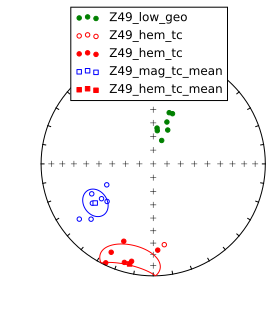

In [46]:
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_ma,inc_ma,dec_h,inc_h = [],[],[],[],[],[]
dec_l_tc,inc_l_tc,dec_ma_geo,inc_ma_geo,dec_h_geo,inc_h_geo = [],[],[],[],[],[]
dec_l,inc_l = list(Z49_l_geo['specimen_dec'].values),list(Z49_l_geo['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z49_l_tc['specimen_dec'].values),list(Z49_l_tc['specimen_inc'].values)
dec_ma,inc_ma = list(Z49_ma_tc['specimen_dec'].values),list(Z49_ma_tc['specimen_inc'].values)
dec_h,inc_h = list(Z49_h_tc['specimen_dec'].values),list(Z49_h_tc['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z49_ma_geo['specimen_dec'].values),list(Z49_ma_geo['specimen_inc'].values)
dec_h_geo,inc_h_geo = list(Z49_h_geo['specimen_dec'].values),list(Z49_h_geo['specimen_inc'].values)
Z49_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z49_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc)
Z49_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z49_hem_tc_dir = ipmag.make_di_block(dec_h,inc_h)
Z49_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z49_hem_geo_dir = ipmag.make_di_block(dec_h_geo,inc_h_geo)
Z49_low_tc_mean=pmag.fisher_mean(Z49_low_tc_dir) # calc means
Z49_mag_tc_mean=pmag.fisher_mean(Z49_mag_tc_dir)
Z49_hem_tc_mean=pmag.fisher_mean(Z49_hem_tc_dir)
Z49_low_geo_mean=pmag.fisher_mean(Z49_low_geo_dir) # calc means
Z49_mag_geo_mean=pmag.fisher_mean(Z49_mag_geo_dir)
Z49_hem_geo_mean=pmag.fisher_mean(Z49_hem_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z49_low_geo')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di(dec_h,inc_h,color='red',label='Z49_hem_tc')
ipmag.plot_di_mean(Z49_mag_tc_mean['dec'],Z49_mag_tc_mean['inc'],
                  Z49_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z49_mag_tc_mean')
ipmag.plot_di_mean(Z49_hem_tc_mean['dec'],Z49_hem_tc_mean['inc'],
                  Z49_hem_tc_mean["alpha95"],color='r',marker='s',
                  label='Z49_hem_tc_mean')
plt.legend(loc=(.15,.75))
plt.show()

#### Z50

The site has 'MAG' and 'HEM' components.

In [47]:
Z50_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z50']
Z50_geo = Z50_all[Z50_all['specimen_tilt_correction'] == 0]
Z50_tc = Z50_all[Z50_all['specimen_tilt_correction'] == 100]
Z50_tc.reset_index(inplace=True)
Z50_geo.reset_index(inplace=True)
Z50_h_geo = Z50_geo[Z50_geo['specimen_comp_name'] == 'HEM']
Z50_h_tc = Z50_tc[Z50_tc['specimen_comp_name'] == 'HEM']
Z50_ma_tc = Z50_tc[Z50_tc['specimen_comp_name'] == 'MAG']
Z50_ma_geo = Z50_geo[Z50_geo['specimen_comp_name'] == 'MAG']

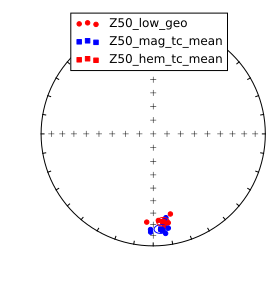

In [48]:
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_h,inc_h,dec_ma,inc_ma = [],[],[],[]
dec_h_geo,inc_h_geo,dec_ma_geo,inc_ma_geo = [],[],[],[]
dec_h,inc_h = list(Z50_h_tc['specimen_dec'].values),list(Z50_h_tc['specimen_inc'].values)
dec_h_geo,inc_h_geo = list(Z50_h_geo['specimen_dec'].values),list(Z50_h_geo['specimen_inc'].values)
dec_ma,inc_ma = list(Z50_ma_tc['specimen_dec'].values),list(Z50_ma_tc['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z50_ma_geo['specimen_dec'].values),list(Z50_ma_geo['specimen_inc'].values)
Z50_hem_geo_dir = ipmag.make_di_block(dec_h_geo,inc_h_geo) # make unit vectors for pmag.fisher_mean()
Z50_hem_tc_dir = ipmag.make_di_block(dec_h,inc_h) # make unit vectors for pmag.fisher_mean()
Z50_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z50_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z50_hem_tc_mean=pmag.fisher_mean(Z50_hem_tc_dir) # calc means
Z50_mag_tc_mean=pmag.fisher_mean(Z50_mag_tc_dir)
Z50_hem_geo_mean=pmag.fisher_mean(Z50_hem_geo_dir) 
Z50_mag_geo_mean=pmag.fisher_mean(Z50_mag_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_h,inc_h,color='r',label='Z50_low_geo')
ipmag.plot_di(dec_ma,inc_ma,color='b')
ipmag.plot_di_mean(Z50_mag_tc_mean['dec'],Z50_mag_tc_mean['inc'],
                  Z50_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z50_mag_tc_mean')
ipmag.plot_di_mean(Z50_hem_tc_mean['dec'],Z50_hem_tc_mean['inc'],
                  Z50_hem_tc_mean["alpha95"],color='r',marker='s',
                  label='Z50_hem_tc_mean')
plt.legend(loc=(.15,.75))
plt.show()

#### Z51

The site has 'LOW', 'MAG' and 'HEM' components.

In [49]:
Z51_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z51']
Z51_geo = Z51_all[Z51_all['specimen_tilt_correction'] == 0]
Z51_tc = Z51_all[Z51_all['specimen_tilt_correction'] == 100]
Z51_tc.reset_index(inplace=True)
Z51_geo.reset_index(inplace=True)
Z51_l_geo = Z51_geo[Z51_geo['specimen_comp_name'] == 'LOW']
Z51_l_tc = Z51_tc[Z51_tc['specimen_comp_name'] == 'LOW']
Z51_ma_geo = Z51_geo[Z51_geo['specimen_comp_name'] == 'MAG']
Z51_h_geo = Z51_geo[Z51_geo['specimen_comp_name'] == 'HEM']
Z51_ma_tc = Z51_tc[Z51_tc['specimen_comp_name'] == 'MAG']
Z51_h_tc = Z51_tc[Z51_tc['specimen_comp_name'] == 'HEM']

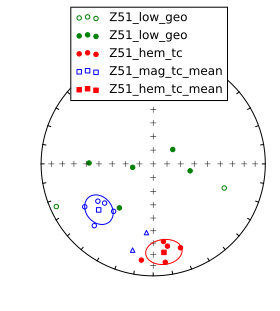

In [50]:
#Below are samples components that were dropped because they were clear outliers
#...magnetite components from samples Z51.1 and Z51.2 group with hematite...
#...components, inconsistent with the rest of the magnetite components
Z51_ma_tc_edit,Z51_ma_geo_edit = [],[]
Z51_ma_tc_edit = Z51_ma_tc
Z51_ma_geo_edit = Z51_ma_geo
Z51_ma_tc_edit = Z51_ma_tc_edit[Z51_ma_tc_edit['er_sample_name'] != 'Z51.1']
Z51_ma_tc_edit = Z51_ma_tc_edit[Z51_ma_tc_edit['er_sample_name'] != 'Z51.2']
Z51_ma_geo_edit = Z51_ma_geo_edit[Z51_ma_geo_edit['er_sample_name'] != 'Z51.1']
Z51_ma_geo_edit = Z51_ma_geo_edit[Z51_ma_geo_edit['er_sample_name'] != 'Z51.2']
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_ma,inc_ma,dec_h,inc_h = [],[],[],[],[],[]
dec_l_tc,inc_l_tc,dec_ma_geo,inc_ma_geo,dec_h_geo,inc_h_geo = [],[],[],[],[],[]
dec_l,inc_l = list(Z51_l_geo['specimen_dec'].values),list(Z51_l_geo['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z51_l_tc['specimen_dec'].values),list(Z51_l_tc['specimen_inc'].values)
dec_ma,inc_ma = list(Z51_ma_tc_edit['specimen_dec'].values),list(Z51_ma_tc_edit['specimen_inc'].values)
dec_h,inc_h = list(Z51_h_tc['specimen_dec'].values),list(Z51_h_tc['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z51_ma_geo_edit['specimen_dec'].values),list(Z51_ma_geo_edit['specimen_inc'].values)
dec_h_geo,inc_h_geo = list(Z51_h_geo['specimen_dec'].values),list(Z51_h_geo['specimen_inc'].values)
Z51_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z51_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc)
Z51_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z51_hem_tc_dir = ipmag.make_di_block(dec_h,inc_h)
Z51_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z51_hem_geo_dir = ipmag.make_di_block(dec_h_geo,inc_h_geo)
Z51_low_tc_mean=pmag.fisher_mean(Z51_low_tc_dir) # calc means
Z51_mag_tc_mean=pmag.fisher_mean(Z51_mag_tc_dir)
Z51_hem_tc_mean=pmag.fisher_mean(Z51_hem_tc_dir)
Z51_low_geo_mean=pmag.fisher_mean(Z51_low_geo_dir) # calc means
Z51_mag_geo_mean=pmag.fisher_mean(Z51_mag_geo_dir)
Z51_hem_geo_mean=pmag.fisher_mean(Z51_hem_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z51_low_geo')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
#plot excluded components as triangles on equal-area plot
ipmag.plot_di(Z51_ma_tc[Z51_ma_tc['er_sample_name']=='Z51.1']['specimen_dec'].values,
              Z51_ma_tc[Z51_ma_tc['er_sample_name']=='Z51.1']['specimen_inc'].values,color='b',marker='^')
ipmag.plot_di(Z51_ma_tc[Z51_ma_tc['er_sample_name']=='Z51.2']['specimen_dec'].values,
              Z51_ma_tc[Z51_ma_tc['er_sample_name']=='Z51.2']['specimen_inc'].values,color='b',marker='^')
ipmag.plot_di(dec_h,inc_h,color='red',label='Z51_hem_tc')
ipmag.plot_di_mean(Z51_mag_tc_mean['dec'],Z51_mag_tc_mean['inc'],
                  Z51_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z51_mag_tc_mean')
ipmag.plot_di_mean(Z51_hem_tc_mean['dec'],Z51_hem_tc_mean['inc'],
                  Z51_hem_tc_mean["alpha95"],color='r',marker='s',
                  label='Z51_hem_tc_mean')
plt.legend(loc=(.15,.75))
plt.show()

Magnetite components from two samples (Z51.1 and Z51.2) were excluded because of their similarity to hematite components (the hematite remanence mixed with that of magnetite) and different demagnetization behavior compared to the other magnetite components.

#### Z52

The site has 'LOW', 'MAG' and 'HEM' components.

In [51]:
Z52_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z52']
Z52_geo = Z52_all[Z52_all['specimen_tilt_correction'] == 0]
Z52_tc = Z52_all[Z52_all['specimen_tilt_correction'] == 100]
Z52_tc.reset_index(inplace=True)
Z52_geo.reset_index(inplace=True)
Z52_l_geo = Z52_geo[Z52_geo['specimen_comp_name'] == 'LOW']
Z52_l_tc = Z52_tc[Z52_tc['specimen_comp_name'] == 'LOW']
Z52_ma_geo = Z52_geo[Z52_geo['specimen_comp_name'] == 'MAG']
Z52_h_geo = Z52_geo[Z52_geo['specimen_comp_name'] == 'HEM']
Z52_ma_tc = Z52_tc[Z52_tc['specimen_comp_name'] == 'MAG']
Z52_h_tc = Z52_tc[Z52_tc['specimen_comp_name'] == 'HEM']

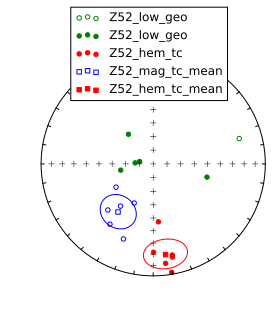

In [52]:
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_ma,inc_ma,dec_h,inc_h = [],[],[],[],[],[]
dec_l_tc,inc_l_tc,dec_ma_geo,inc_ma_geo,dec_h_geo,inc_h_geo = [],[],[],[],[],[]
dec_l,inc_l = list(Z52_l_geo['specimen_dec'].values),list(Z52_l_geo['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z52_l_tc['specimen_dec'].values),list(Z52_l_tc['specimen_inc'].values)
dec_ma,inc_ma = list(Z52_ma_tc['specimen_dec'].values),list(Z52_ma_tc['specimen_inc'].values)
dec_h,inc_h = list(Z52_h_tc['specimen_dec'].values),list(Z52_h_tc['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z52_ma_geo['specimen_dec'].values),list(Z52_ma_geo['specimen_inc'].values)
dec_h_geo,inc_h_geo = list(Z52_h_geo['specimen_dec'].values),list(Z52_h_geo['specimen_inc'].values)
Z52_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z52_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc)
Z52_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z52_hem_tc_dir = ipmag.make_di_block(dec_h,inc_h)
Z52_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z52_hem_geo_dir = ipmag.make_di_block(dec_h_geo,inc_h_geo)
Z52_low_tc_mean=pmag.fisher_mean(Z52_low_tc_dir) # calc means
Z52_mag_tc_mean=pmag.fisher_mean(Z52_mag_tc_dir)
Z52_hem_tc_mean=pmag.fisher_mean(Z52_hem_tc_dir)
Z52_low_geo_mean=pmag.fisher_mean(Z52_low_geo_dir) # calc means
Z52_mag_geo_mean=pmag.fisher_mean(Z52_mag_geo_dir)
Z52_hem_geo_mean=pmag.fisher_mean(Z52_hem_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z52_low_geo')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di(dec_h,inc_h,color='red',label='Z52_hem_tc')
ipmag.plot_di_mean(Z52_mag_tc_mean['dec'],Z52_mag_tc_mean['inc'],
                  Z52_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z52_mag_tc_mean')
ipmag.plot_di_mean(Z52_hem_tc_mean['dec'],Z52_hem_tc_mean['inc'],
                  Z52_hem_tc_mean["alpha95"],color='r',marker='s',
                  label='Z52_hem_tc_mean')
plt.legend(loc=(.15,.75))
plt.show()

#### Z53

The site has 'LOW', 'MAG' and 'HEM' components.

In [53]:
Z53_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z53']
Z53_geo = Z53_all[Z53_all['specimen_tilt_correction'] == 0]
Z53_tc = Z53_all[Z53_all['specimen_tilt_correction'] == 100]
Z53_tc.reset_index(inplace=True)
Z53_geo.reset_index(inplace=True)
Z53_l_geo = Z53_geo[Z53_geo['specimen_comp_name'] == 'LOW']
Z53_l_tc = Z53_tc[Z53_tc['specimen_comp_name'] == 'LOW']
Z53_ma_geo = Z53_geo[Z53_geo['specimen_comp_name'] == 'MAG']
Z53_h_geo = Z53_geo[Z53_geo['specimen_comp_name'] == 'HEM']
Z53_ma_tc = Z53_tc[Z53_tc['specimen_comp_name'] == 'MAG']
Z53_h_tc = Z53_tc[Z53_tc['specimen_comp_name'] == 'HEM']

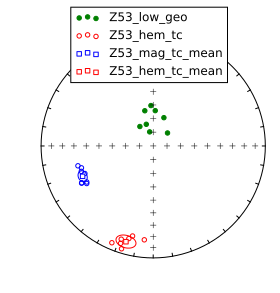

In [54]:
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_ma,inc_ma,dec_h,inc_h = [],[],[],[],[],[]
dec_l_tc,inc_l_tc,dec_ma_geo,inc_ma_geo,dec_h_geo,inc_h_geo = [],[],[],[],[],[]
dec_l,inc_l = list(Z53_l_geo['specimen_dec'].values),list(Z53_l_geo['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z53_l_tc['specimen_dec'].values),list(Z53_l_tc['specimen_inc'].values)
dec_ma,inc_ma = list(Z53_ma_tc['specimen_dec'].values),list(Z53_ma_tc['specimen_inc'].values)
dec_h,inc_h = list(Z53_h_tc['specimen_dec'].values),list(Z53_h_tc['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z53_ma_geo['specimen_dec'].values),list(Z53_ma_geo['specimen_inc'].values)
dec_h_geo,inc_h_geo = list(Z53_h_geo['specimen_dec'].values),list(Z53_h_geo['specimen_inc'].values)
Z53_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z53_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc)
Z53_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z53_hem_tc_dir = ipmag.make_di_block(dec_h,inc_h)
Z53_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z53_hem_geo_dir = ipmag.make_di_block(dec_h_geo,inc_h_geo)
Z53_low_tc_mean=pmag.fisher_mean(Z53_low_tc_dir) # calc means
Z53_mag_tc_mean=pmag.fisher_mean(Z53_mag_tc_dir)
Z53_hem_tc_mean=pmag.fisher_mean(Z53_hem_tc_dir)
Z53_low_geo_mean=pmag.fisher_mean(Z53_low_geo_dir) # calc means
Z53_mag_geo_mean=pmag.fisher_mean(Z53_mag_geo_dir)
Z53_hem_geo_mean=pmag.fisher_mean(Z53_hem_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z53_low_geo')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di(dec_h,inc_h,color='red',label='Z53_hem_tc')
ipmag.plot_di_mean(Z53_mag_tc_mean['dec'],Z53_mag_tc_mean['inc'],
                  Z53_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z53_mag_tc_mean')
ipmag.plot_di_mean(Z53_hem_tc_mean['dec'],Z53_hem_tc_mean['inc'],
                  Z53_hem_tc_mean["alpha95"],color='r',marker='s',
                  label='Z53_hem_tc_mean')
plt.legend(loc=(.15,.75))
plt.show()

#### Z54

The site has 'LOW', 'MAG' and 'HEM' components.

In [55]:
Z54_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z54']
Z54_geo = Z54_all[Z54_all['specimen_tilt_correction'] == 0]
Z54_tc = Z54_all[Z54_all['specimen_tilt_correction'] == 100]
Z54_tc.reset_index(inplace=True)
Z54_geo.reset_index(inplace=True)
Z54_l_geo = Z54_geo[Z54_geo['specimen_comp_name'] == 'LOW']
Z54_l_tc = Z54_tc[Z54_tc['specimen_comp_name'] == 'LOW']
Z54_ma_geo = Z54_geo[Z54_geo['specimen_comp_name'] == 'MAG']
Z54_h_geo = Z54_geo[Z54_geo['specimen_comp_name'] == 'HEM']
Z54_ma_tc = Z54_tc[Z54_tc['specimen_comp_name'] == 'MAG']
Z54_h_tc = Z54_tc[Z54_tc['specimen_comp_name'] == 'HEM']

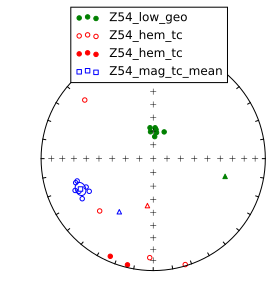

In [56]:
#remove the odd samples from the LOW temperature group
Z54_ma_tc_edit,Z54_ma_geo_edit,Z54_h_tc_edit,Z54_h_geo_edit = [],[],[],[]
Z54_ma_tc_edit = Z54_ma_tc
Z54_ma_geo_edit = Z54_ma_geo
Z54_h_tc_edit = Z54_h_tc
Z54_h_geo_edit = Z54_h_geo
Z54_h_tc_edit = Z54_h_tc_edit[Z54_h_tc_edit['er_sample_name'] != 'Z54.5']
Z54_h_geo_edit = Z54_h_geo_edit[Z54_h_geo_edit['er_sample_name'] != 'Z54.5']
Z54_ma_tc_edit = Z54_ma_tc_edit[Z54_ma_tc_edit['er_sample_name'] != 'Z54.5']
Z54_ma_geo_edit = Z54_ma_geo_edit[Z54_ma_geo_edit['er_sample_name'] != 'Z54.5']
Z54_l_tc_edit,Z54_l_geo_edit = [],[]
Z54_l_tc_edit = Z54_l_tc
Z54_l_geo_edit = Z54_l_geo
Z54_l_tc_edit = Z54_l_tc_edit[Z54_l_tc_edit['er_sample_name'] != 'Z54.5']
Z54_l_geo_edit = Z54_l_geo_edit[Z54_l_geo_edit['er_sample_name'] != 'Z54.5']
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_ma,inc_ma,dec_h,inc_h = [],[],[],[],[],[]
dec_l_tc,inc_l_tc,dec_ma_geo,inc_ma_geo,dec_h_geo,inc_h_geo = [],[],[],[],[],[]
dec_l,inc_l = list(Z54_l_geo_edit['specimen_dec'].values),list(Z54_l_geo_edit['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z54_l_tc_edit['specimen_dec'].values),list(Z54_l_tc_edit['specimen_inc'].values)
dec_ma,inc_ma = list(Z54_ma_tc_edit['specimen_dec'].values),list(Z54_ma_tc_edit['specimen_inc'].values)
dec_h,inc_h = list(Z54_h_tc_edit['specimen_dec'].values),list(Z54_h_tc_edit['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z54_ma_geo_edit['specimen_dec'].values),list(Z54_ma_geo_edit['specimen_inc'].values)
dec_h_geo,inc_h_geo = list(Z54_h_geo_edit['specimen_dec'].values),list(Z54_h_geo_edit['specimen_inc'].values)
Z54_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z54_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc)
Z54_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z54_hem_tc_dir = ipmag.make_di_block(dec_h,inc_h)
Z54_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z54_hem_geo_dir = ipmag.make_di_block(dec_h_geo,inc_h_geo)
Z54_low_tc_mean=pmag.fisher_mean(Z54_low_tc_dir) # calc means
Z54_mag_tc_mean=pmag.fisher_mean(Z54_mag_tc_dir)
Z54_hem_tc_mean=pmag.fisher_mean(Z54_hem_tc_dir)
Z54_low_geo_mean=pmag.fisher_mean(Z54_low_geo_dir) # calc means
Z54_mag_geo_mean=pmag.fisher_mean(Z54_mag_geo_dir)
Z54_hem_geo_mean=pmag.fisher_mean(Z54_hem_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z54_low_geo')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di(dec_h,inc_h,color='red',label='Z54_hem_tc')
#plot excluded components as triangles on equal-area plot
ipmag.plot_di(Z54_ma_tc[Z54_ma_tc['er_sample_name']=='Z54.5']['specimen_dec'].values,
              Z54_ma_tc[Z54_ma_tc['er_sample_name']=='Z54.5']['specimen_inc'].values,color='b',marker='^')
ipmag.plot_di(Z54_h_tc[Z54_h_tc['er_sample_name']=='Z54.5']['specimen_dec'].values,
              Z54_h_tc[Z54_h_tc['er_sample_name']=='Z54.5']['specimen_inc'].values,color='r',marker='^')
ipmag.plot_di(Z54_l_geo[Z54_l_geo['er_sample_name']=='Z54.5']['specimen_dec'].values,
              Z54_l_geo[Z54_l_geo['er_sample_name']=='Z54.5']['specimen_inc'].values,color='g',marker='^')

ipmag.plot_di_mean(Z54_mag_tc_mean['dec'],Z54_mag_tc_mean['inc'],
                  Z54_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z54_mag_tc_mean')
plt.legend(loc=(.15,.8))
plt.show()

#### Z55

The site has 'LOW' and 'MAG'.

In [57]:
Z55_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z55']
Z55_geo = Z55_all[Z55_all['specimen_tilt_correction'] == 0]
Z55_tc = Z55_all[Z55_all['specimen_tilt_correction'] == 100]
Z55_tc.reset_index(inplace=True)
Z55_geo.reset_index(inplace=True)
Z55_l_geo = Z55_geo[Z55_geo['specimen_comp_name'] == 'LOW']
Z55_l_tc = Z55_tc[Z55_tc['specimen_comp_name'] == 'LOW']
Z55_ma_tc = Z55_tc[Z55_tc['specimen_comp_name'] == 'MAG']
Z55_ma_geo = Z55_geo[Z55_geo['specimen_comp_name'] == 'MAG']

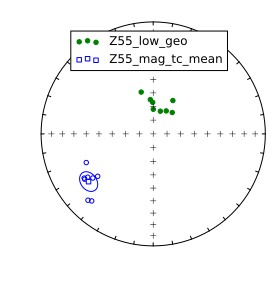

In [58]:
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_ma,inc_ma = [],[],[],[]
dec_l_tc,inc_l_tc,dec_ma_geo,inc_ma_geo = [],[],[],[]
dec_l,inc_l = list(Z55_l_geo['specimen_dec'].values),list(Z55_l_geo['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z55_l_tc['specimen_dec'].values),list(Z55_l_tc['specimen_inc'].values)
dec_ma,inc_ma = list(Z55_ma_tc['specimen_dec'].values),list(Z55_ma_tc['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z55_ma_geo['specimen_dec'].values),list(Z55_ma_geo['specimen_inc'].values)
Z55_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z55_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc) # make unit vectors for pmag.fisher_mean()
Z55_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z55_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z55_low_tc_mean=pmag.fisher_mean(Z55_low_tc_dir) # calc means
Z55_mag_tc_mean=pmag.fisher_mean(Z55_mag_tc_dir)
Z55_low_geo_mean=pmag.fisher_mean(Z55_low_geo_dir) 
Z55_mag_geo_mean=pmag.fisher_mean(Z55_mag_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z55_low_geo')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di_mean(Z55_mag_tc_mean['dec'],Z55_mag_tc_mean['inc'],
                  Z55_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z55_mag_tc_mean')
plt.legend(loc=(.15,.75))
plt.show()

#### Z56

The site has 'LOW', 'MAG' and 'HEM' components.

In [59]:
Z56_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z56']
Z56_geo = Z56_all[Z56_all['specimen_tilt_correction'] == 0]
Z56_tc = Z56_all[Z56_all['specimen_tilt_correction'] == 100]
Z56_tc.reset_index(inplace=True)
Z56_geo.reset_index(inplace=True)
Z56_l_geo = Z56_geo[Z56_geo['specimen_comp_name'] == 'LOW']
Z56_l_tc = Z56_tc[Z56_tc['specimen_comp_name'] == 'LOW']
Z56_ma_geo = Z56_geo[Z56_geo['specimen_comp_name'] == 'MAG']
Z56_h_geo = Z56_geo[Z56_geo['specimen_comp_name'] == 'HEM']
Z56_ma_tc = Z56_tc[Z56_tc['specimen_comp_name'] == 'MAG']
Z56_h_tc = Z56_tc[Z56_tc['specimen_comp_name'] == 'HEM']

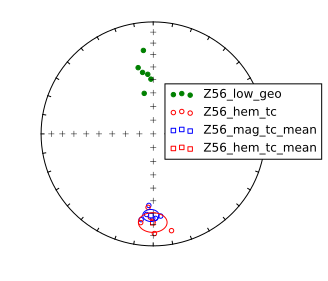

In [60]:
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_ma,inc_ma,dec_h,inc_h = [],[],[],[],[],[]
dec_l_tc,inc_l_tc,dec_ma_geo,inc_ma_geo,dec_h_geo,inc_h_geo = [],[],[],[],[],[]
dec_l,inc_l = list(Z56_l_geo['specimen_dec'].values),list(Z56_l_geo['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z56_l_tc['specimen_dec'].values),list(Z56_l_tc['specimen_inc'].values)
dec_ma,inc_ma = list(Z56_ma_tc['specimen_dec'].values),list(Z56_ma_tc['specimen_inc'].values)
dec_h,inc_h = list(Z56_h_tc['specimen_dec'].values),list(Z56_h_tc['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z56_ma_geo['specimen_dec'].values),list(Z56_ma_geo['specimen_inc'].values)
dec_h_geo,inc_h_geo = list(Z56_h_geo['specimen_dec'].values),list(Z56_h_geo['specimen_inc'].values)
Z56_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z56_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc)
Z56_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z56_hem_tc_dir = ipmag.make_di_block(dec_h,inc_h)
Z56_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z56_hem_geo_dir = ipmag.make_di_block(dec_h_geo,inc_h_geo)
Z56_low_tc_mean=pmag.fisher_mean(Z56_low_tc_dir) # calc means
Z56_mag_tc_mean=pmag.fisher_mean(Z56_mag_tc_dir)
Z56_hem_tc_mean=pmag.fisher_mean(Z56_hem_tc_dir)
Z56_low_geo_mean=pmag.fisher_mean(Z56_low_geo_dir) # calc means
Z56_mag_geo_mean=pmag.fisher_mean(Z56_mag_geo_dir)
Z56_hem_geo_mean=pmag.fisher_mean(Z56_hem_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z56_low_geo')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di(dec_h,inc_h,color='red',label='Z56_hem_tc')
ipmag.plot_di_mean(Z56_mag_tc_mean['dec'],Z56_mag_tc_mean['inc'],
                  Z56_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z56_mag_tc_mean')
ipmag.plot_di_mean(Z56_hem_tc_mean['dec'],Z56_hem_tc_mean['inc'],
                  Z56_hem_tc_mean["alpha95"],color='r',marker='s',
                  label='Z56_hem_tc_mean')
plt.legend(loc=(.55,.4))
plt.show()

This site is in a different dip panel along with Z57 and Z58. A magnetite component distinct from the hematite component was not resolved. Z57 has similar behavior.

#### Z57

The site has 'LOW', 'MAG' and 'HEM' components.

In [61]:
Z57_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z57']
Z57_geo = Z57_all[Z57_all['specimen_tilt_correction'] == 0]
Z57_tc = Z57_all[Z57_all['specimen_tilt_correction'] == 100]
Z57_tc.reset_index(inplace=True)
Z57_geo.reset_index(inplace=True)
Z57_l_geo = Z57_geo[Z57_geo['specimen_comp_name'] == 'LOW']
Z57_l_tc = Z57_tc[Z57_tc['specimen_comp_name'] == 'LOW']
Z57_ma_geo = Z57_geo[Z57_geo['specimen_comp_name'] == 'MAG']
Z57_h_geo = Z57_geo[Z57_geo['specimen_comp_name'] == 'HEM']
Z57_ma_tc = Z57_tc[Z57_tc['specimen_comp_name'] == 'MAG']
Z57_h_tc = Z57_tc[Z57_tc['specimen_comp_name'] == 'HEM']

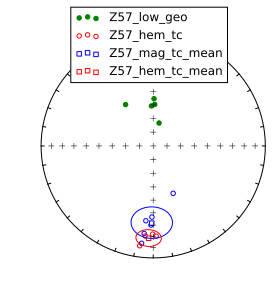

In [62]:
#remove the odd samples from the LOW temperature group
Z57_l_tc_edit,Z57_l_geo_edit = [],[]
Z57_l_tc_edit = Z57_l_tc
Z57_l_geo_edit = Z57_l_geo
Z57_l_tc_edit = Z57_l_tc_edit[Z57_l_tc_edit['er_sample_name'] != 'Z57.5']
Z57_l_geo_edit = Z57_l_geo_edit[Z57_l_geo_edit['er_sample_name'] != 'Z57.5']
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_ma,inc_ma,dec_h,inc_h = [],[],[],[],[],[]
dec_l_tc,inc_l_tc,dec_ma_geo,inc_ma_geo,dec_h_geo,inc_h_geo = [],[],[],[],[],[]
dec_l,inc_l = list(Z57_l_geo_edit['specimen_dec'].values),list(Z57_l_geo_edit['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z57_l_tc_edit['specimen_dec'].values),list(Z57_l_tc_edit['specimen_inc'].values)
dec_ma,inc_ma = list(Z57_ma_tc['specimen_dec'].values),list(Z57_ma_tc['specimen_inc'].values)
dec_h,inc_h = list(Z57_h_tc['specimen_dec'].values),list(Z57_h_tc['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z57_ma_geo['specimen_dec'].values),list(Z57_ma_geo['specimen_inc'].values)
dec_h_geo,inc_h_geo = list(Z57_h_geo['specimen_dec'].values),list(Z57_h_geo['specimen_inc'].values)
Z57_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z57_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc)
Z57_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z57_hem_tc_dir = ipmag.make_di_block(dec_h,inc_h)
Z57_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z57_hem_geo_dir = ipmag.make_di_block(dec_h_geo,inc_h_geo)
Z57_low_tc_mean=pmag.fisher_mean(Z57_low_tc_dir) # calc means
Z57_mag_tc_mean=pmag.fisher_mean(Z57_mag_tc_dir)
Z57_hem_tc_mean=pmag.fisher_mean(Z57_hem_tc_dir)
Z57_low_geo_mean=pmag.fisher_mean(Z57_low_geo_dir) # calc means
Z57_mag_geo_mean=pmag.fisher_mean(Z57_mag_geo_dir)
Z57_hem_geo_mean=pmag.fisher_mean(Z57_hem_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z57_low_geo')
ipmag.plot_di(dec_ma,inc_ma,color='blue')
ipmag.plot_di(dec_h,inc_h,color='red',label='Z57_hem_tc')
ipmag.plot_di_mean(Z57_mag_tc_mean['dec'],Z57_mag_tc_mean['inc'],
                  Z57_mag_tc_mean["alpha95"],color='b',marker='s',
                  label='Z57_mag_tc_mean')
ipmag.plot_di_mean(Z57_hem_tc_mean['dec'],Z57_hem_tc_mean['inc'],
                  Z57_hem_tc_mean["alpha95"],color='r',marker='s',
                  label='Z57_hem_tc_mean')

plt.legend(loc=(.15,.75))
plt.show()

#### Z58

Magnetite, mid-, and low- temperature, LOW (less than 200ºC), components were calculated for Z58. The middle temperature component derives from demagnetization steps between LOW and magnetite.

In [63]:
Z58_all = Teel_data_raw[Teel_data_raw['er_site_name'] == 'Z58']
Z58_geo = Z58_all[Z58_all['specimen_tilt_correction'] == 0]
Z58_tc = Z58_all[Z58_all['specimen_tilt_correction'] == 100]
Z58_tc.reset_index(inplace=True)
Z58_geo.reset_index(inplace=True)
Z58_l_geo = Z58_geo[Z58_geo['specimen_comp_name'] == 'LOW']
Z58_l_tc = Z58_tc[Z58_tc['specimen_comp_name'] == 'LOW']
Z58_ma_geo = Z58_geo[Z58_geo['specimen_comp_name'] == 'MAG']
Z58_ma_tc = Z58_tc[Z58_tc['specimen_comp_name'] == 'MAG']
Z58_mi_tc = Z58_tc[Z58_tc['specimen_comp_name'] == 'MID']
Z58_mi_geo = Z58_geo[Z58_geo['specimen_comp_name'] == 'MID']

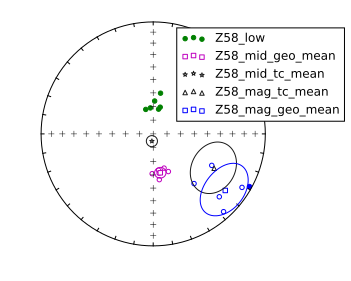

In [64]:
#make lists of dec/inc for each component which are needed for plotting and mean calc
dec_l,inc_l,dec_mi,inc_mi,dec_ma,inc_ma = [],[],[],[],[],[]
dec_l_tc,inc_l_tc,dec_mi_geo,inc_mi_geo,dec_ma_geo,inc_ma_geo = [],[],[],[],[],[]
dec_l,inc_l = list(Z58_l_geo['specimen_dec'].values),list(Z58_l_geo['specimen_inc'].values)
dec_l_tc,inc_l_tc = list(Z58_l_tc['specimen_dec'].values),list(Z58_l_tc['specimen_inc'].values)
dec_mi,inc_mi = list(Z58_mi_tc['specimen_dec'].values),list(Z58_mi_tc['specimen_inc'].values)
dec_ma,inc_ma = list(Z58_ma_tc['specimen_dec'].values),list(Z58_ma_tc['specimen_inc'].values)
dec_mi_geo,inc_mi_geo = list(Z58_mi_geo['specimen_dec'].values),list(Z58_mi_geo['specimen_inc'].values)
dec_ma_geo,inc_ma_geo = list(Z58_ma_geo['specimen_dec'].values),list(Z58_ma_geo['specimen_inc'].values)
Z58_low_geo_dir = ipmag.make_di_block(dec_l,inc_l) # make unit vectors for pmag.fisher_mean()
Z58_low_tc_dir = ipmag.make_di_block(dec_l_tc,inc_l_tc)
Z58_mid_tc_dir = ipmag.make_di_block(dec_mi,inc_mi)
Z58_mag_tc_dir = ipmag.make_di_block(dec_ma,inc_ma)
Z58_mid_geo_dir = ipmag.make_di_block(dec_mi_geo,inc_mi_geo)
Z58_mag_geo_dir = ipmag.make_di_block(dec_ma_geo,inc_ma_geo)
Z58_low_tc_mean=pmag.fisher_mean(Z58_low_tc_dir) # calc means
Z58_mid_tc_mean=pmag.fisher_mean(Z58_mid_tc_dir)
Z58_mag_tc_mean=pmag.fisher_mean(Z58_mag_tc_dir)
Z58_low_geo_mean=pmag.fisher_mean(Z58_low_geo_dir) # calc means
Z58_mid_geo_mean=pmag.fisher_mean(Z58_mid_geo_dir)
Z58_mag_geo_mean=pmag.fisher_mean(Z58_mag_geo_dir)

fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
ipmag.plot_di(dec_l,inc_l,color='green',label='Z58_low')
ipmag.plot_di(dec_mi_geo,inc_mi_geo,color='m')
ipmag.plot_di(dec_ma_geo,inc_ma_geo,color='b')
ipmag.plot_di_mean(Z58_mid_geo_mean['dec'],Z58_mid_geo_mean['inc'],
                  Z58_mid_geo_mean["alpha95"],color='m',marker='s',
                  label='Z58_mid_geo_mean')
ipmag.plot_di_mean(Z58_mid_tc_mean['dec'],Z58_mid_tc_mean['inc'],
                  Z58_mid_tc_mean["alpha95"],color='0.1',marker='*',
                  label='Z58_mid_tc_mean')
ipmag.plot_di_mean(Z58_mag_tc_mean['dec'],Z58_mag_tc_mean['inc'],
                  Z58_mag_tc_mean["alpha95"],color='0.1',marker='^',
                  label='Z58_mag_tc_mean')
ipmag.plot_di_mean(Z58_mag_geo_mean['dec'],Z58_mag_geo_mean['inc'],
                  Z58_mag_geo_mean["alpha95"],color='b',marker='s',
                  label='Z58_mag_geo_mean')
plt.legend(loc=(.6,.55))
plt.show()

Results from flow Z58 are very different from all of the other sites.

## Paleomagnetic site data summary

Create tables, distinguished by component type, of mean directions for all Teel flows.

#### Magnetite directions

##### Geographic coordinates - magnetite

In [65]:
# Convert mean direction dictionaries to dataframes
Z30_mag_geo = pd.DataFrame.from_dict({'Z30_mag_geo':Z30_mag_geo_mean}, orient='index')
Z31_mag_geo = pd.DataFrame.from_dict({'Z31_mag_geo':Z31_mag_geo_mean}, orient='index')
Z32_mag_geo = pd.DataFrame.from_dict({'Z32_mag_geo':Z32_mag_geo_mean}, orient='index')
Z33_mag_geo = pd.DataFrame.from_dict({'Z33_mag_geo':Z33_mag_geo_mean}, orient='index')
Z34_mag_geo = pd.DataFrame.from_dict({'Z34_mag_geo':Z34_mag_geo_mean}, orient='index')
Z35_mag_geo = pd.DataFrame.from_dict({'Z35_mag_geo':Z35_mag_geo_mean}, orient='index')
Z36_mag_geo = pd.DataFrame.from_dict({'Z36_mag_geo':Z36_mag_geo_mean}, orient='index')
Z37_mag_geo = pd.DataFrame.from_dict({'Z37_mag_geo':Z37_mag_geo_mean}, orient='index')
Z38_mag_geo = pd.DataFrame.from_dict({'Z38_mag_geo':Z38_mag_geo_mean}, orient='index')
Z39_mag_geo = pd.DataFrame.from_dict({'Z39_mag_geo':Z39_mag_geo_mean}, orient='index')
Z40_mag_geo = pd.DataFrame.from_dict({'Z40_mag_geo':Z40_mag_geo_mean}, orient='index')
Z41_mag_geo = pd.DataFrame.from_dict({'Z41_mag_geo':Z41_mag_geo_mean}, orient='index')
Z42_mag_geo = pd.DataFrame.from_dict({'Z42_mag_geo':Z42_mag_geo_mean}, orient='index')
Z43_mag_geo = pd.DataFrame.from_dict({'Z43_mag_geo':Z43_mag_geo_mean}, orient='index')
Z44_mag_geo = pd.DataFrame.from_dict({'Z44_mag_geo':Z44_mag_geo_mean}, orient='index')
Z45_mag_geo = pd.DataFrame.from_dict({'Z45_mag_geo':Z45_mag_geo_mean}, orient='index')
Z46_mag_geo = pd.DataFrame.from_dict({'Z46_mag_geo':Z46_mag_geo_mean}, orient='index')
Z47_mag_geo = pd.DataFrame.from_dict({'Z47_mag_geo':Z47_mag_geo_mean}, orient='index')
Z48_mag_geo = pd.DataFrame.from_dict({'Z48_mag_geo':Z48_mag_geo_mean}, orient='index')
Z49_mag_geo = pd.DataFrame.from_dict({'Z49_mag_geo':Z49_mag_geo_mean}, orient='index')
Z50_mag_geo = pd.DataFrame.from_dict({'Z50_mag_geo':Z50_mag_geo_mean}, orient='index')
Z51_mag_geo = pd.DataFrame.from_dict({'Z51_mag_geo':Z51_mag_geo_mean}, orient='index')
Z52_mag_geo = pd.DataFrame.from_dict({'Z52_mag_geo':Z52_mag_geo_mean}, orient='index')
Z53_mag_geo = pd.DataFrame.from_dict({'Z53_mag_geo':Z53_mag_geo_mean}, orient='index')
Z54_mag_geo = pd.DataFrame.from_dict({'Z54_mag_geo':Z54_mag_geo_mean}, orient='index')
Z55_mag_geo = pd.DataFrame.from_dict({'Z55_mag_geo':Z55_mag_geo_mean}, orient='index')
Z56_mag_geo = pd.DataFrame.from_dict({'Z56_mag_geo':Z56_mag_geo_mean}, orient='index')
Z57_mag_geo = pd.DataFrame.from_dict({'Z57_mag_geo':Z57_mag_geo_mean}, orient='index')
Z58_mag_geo = pd.DataFrame.from_dict({'Z58_mag_geo':Z58_mag_geo_mean}, orient='index')
# combine all mean direction dataframes
teel_mag_means_geo = Z30_mag_geo
teel_mag_means_geo = teel_mag_means_geo.append(Z31_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z32_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z33_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z34_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z35_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z36_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z37_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z38_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z39_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z40_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z41_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z42_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z43_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z44_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z45_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z46_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z47_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z48_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z49_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z50_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z51_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z52_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z53_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z54_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z55_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z56_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z57_mag_geo)
teel_mag_means_geo = teel_mag_means_geo.append(Z58_mag_geo)
#rename dec/inc columns to show that they are tilt-corrected directions
teel_mag_means_geo = teel_mag_means_geo.rename(columns={'dec':'dec_tc'})
teel_mag_means_geo = teel_mag_means_geo.rename(columns={'inc':'inc_tc'})
#rearrange columns
teel_mag_means_geo = teel_mag_means_geo[['dec_tc','inc_tc','alpha95','n','k','r','csd']]
#insert site_lat/site_lon
teel_mag_means_geo.insert(0,'site_lat',list(teel_2015_site_locs['site_lat']))
teel_mag_means_geo.insert(1,'site_lon',list(teel_2015_site_locs['site_lon']))
teel_mag_means_geo.insert(0,'strat_pos',list(teel_2015_site_locs['strat_pos']))
#calculate pole coordinates for mean directions
ipmag.vgp_calc(teel_mag_means_geo)
#rename columns
teel_mag_means_geo = teel_mag_means_geo.rename(columns={'dec_tc':'dec_geo'})
teel_mag_means_geo = teel_mag_means_geo.rename(columns={'inc_tc':'inc_geo'})
teel_mag_means_geo.to_csv('./notebook_output/teel_mag_means_geo')
teel_mag_means_geo

,strat_pos,site_lat,site_lon,dec_geo,inc_geo,alpha95,n,k,r,csd,paleolatitude,vgp_lat,vgp_lon,vgp_lat_rev,vgp_lon_rev
Z30_mag_geo,4.0,47.10038,95.37550,61.199035,-73.861110,11.712582,7,27.513985,6.781929,15.442168,-59.940264,-28.018244,245.559596,28.018244,65.559596
Z31_mag_geo,5.0,47.10049,95.37604,168.103623,-72.234668,3.753459,8,218.756351,7.968001,5.476520,-57.348450,-77.463763,244.552326,77.463763,64.552326
Z32_mag_geo,6.0,47.10094,95.37684,170.358827,-65.228366,7.987595,9,42.504477,8.811785,12.424178,-47.295204,-83.450449,190.612182,83.450449,10.612182
Z33_mag_geo,7.0,47.10107,95.37705,184.611118,-78.580341,4.579774,8,147.251468,7.952462,6.675060,-68.002034,-68.966892,280.189909,68.966892,100.189909
Z34_mag_geo,8.0,47.10111,95.37712,165.710954,-76.241270,2.846954,10,288.897760,9.968847,4.765549,-63.908090,-71.445651,255.430852,71.445651,75.430852
Z35_mag_geo,9.0,47.10069,95.37747,180.035625,-56.117492,6.392221,6,110.823428,5.954883,7.694302,-36.670242,-79.569519,95.219636,79.569519,275.219636
Z36_mag_geo,11.0,47.10221,95.37959,184.602274,-73.483650,4.160116,8,178.256399,7.960731,6.066839,-59.330031,-77.472930,286.256471,77.472930,106.256471
Z37_mag_geo,12.0,47.10211,95.37971,172.808147,-74.694707,7.476051,9,48.384817,8.834659,11.644758,-61.306496,-75.207168,261.763513,75.207168,81.763513
Z38_mag_geo,13.0,47.09855,95.38445,170.143849,-68.504682,8.040139,10,37.061501,9.757160,13.305265,-51.774894,-82.077055,225.175390,82.077055,45.175390
Z39_mag_geo,14.0,47.09860,95.38467,196.103583,-56.022026,6.360400,6,111.925588,5.955327,7.656324,-36.571555,-74.094885,41.007252,74.094885,221.007252


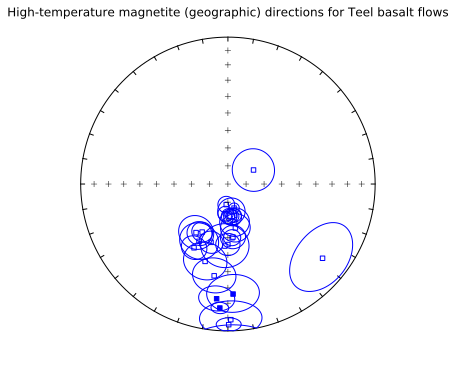

In [66]:
fignum = 1
plt.figure(num=fignum,figsize=(5,5))
ipmag.plot_net(1)
for n in range(len(teel_mag_means_geo)):
    ipmag.plot_di_mean(teel_mag_means_geo['dec_geo'][n],
                      teel_mag_means_geo['inc_geo'][n],
                      teel_mag_means_geo['alpha95'][n],
                      color='b',marker='s',label='')
plt.title('High-temperature magnetite (geographic) directions for Teel basalt flows')
plt.show()

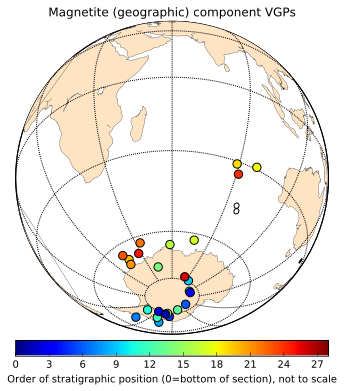

In [67]:
m = Basemap(projection='ortho',lat_0=-40,lon_0=60,resolution='c',area_thresh=50000)
plt.figure(figsize=(6, 6))
m.drawcoastlines(linewidth=0.25)
m.fillcontinents(color='bisque',lake_color='white',zorder=1)
m.drawmapboundary(fill_color='white')
m.drawmeridians(np.arange(0,360,30))
m.drawparallels(np.arange(-90,90,30))
m.readshapefile('./shapefiles/reconstructed_0','Mongolia',linewidth=2,color='m')
#plot poles with colors according to stratigraphic order
for n in xrange (0, len(teel_mag_means_geo)):
     poles = ipmag.plot_pole_colorbar(m, teel_mag_means_geo['vgp_lon'][n],teel_mag_means_geo['vgp_lat'][n], 
                        1, 
                        teel_mag_means_geo['strat_pos'][n], 
                        0,
                        28, 
                        markersize=70, color="k", alpha=1)


plt.title('Magnetite (geographic) component VGPs')
m.colorbar(poles,location='bottom',label='Order of stratigraphic position (0=bottom of section), not to scale')
plt.show()

##### Tilt-corrected coordinates - magnetite

In [68]:
# Convert mean direction dictionaries to dataframes
# TODO: figure out a way to iterate (or simplify) this code block, it's verbose...
#...Although, it processes very quickly!
Z30_mag = pd.DataFrame.from_dict({'Z30_mag':Z30_mag_tc_mean}, orient='index')
Z31_mag = pd.DataFrame.from_dict({'Z31_mag':Z31_mag_tc_mean}, orient='index')
Z32_mag = pd.DataFrame.from_dict({'Z32_mag':Z32_mag_tc_mean}, orient='index')
Z33_mag = pd.DataFrame.from_dict({'Z33_mag':Z33_mag_tc_mean}, orient='index')
Z34_mag = pd.DataFrame.from_dict({'Z34_mag':Z34_mag_tc_mean}, orient='index')
Z35_mag = pd.DataFrame.from_dict({'Z35_mag':Z35_mag_tc_mean}, orient='index')
Z36_mag = pd.DataFrame.from_dict({'Z36_mag':Z36_mag_tc_mean}, orient='index')
Z37_mag = pd.DataFrame.from_dict({'Z37_mag':Z37_mag_tc_mean}, orient='index')
Z38_mag = pd.DataFrame.from_dict({'Z38_mag':Z38_mag_tc_mean}, orient='index')
Z39_mag = pd.DataFrame.from_dict({'Z39_mag':Z39_mag_tc_mean}, orient='index')
Z40_mag = pd.DataFrame.from_dict({'Z40_mag':Z40_mag_tc_mean}, orient='index')
Z41_mag = pd.DataFrame.from_dict({'Z41_mag':Z41_mag_tc_mean}, orient='index')
Z42_mag = pd.DataFrame.from_dict({'Z42_mag':Z42_mag_tc_mean}, orient='index')
Z43_mag = pd.DataFrame.from_dict({'Z43_mag':Z43_mag_tc_mean}, orient='index')
Z44_mag = pd.DataFrame.from_dict({'Z44_mag':Z44_mag_tc_mean}, orient='index')
Z45_mag = pd.DataFrame.from_dict({'Z45_mag':Z45_mag_tc_mean}, orient='index')
Z46_mag = pd.DataFrame.from_dict({'Z46_mag':Z46_mag_tc_mean}, orient='index')
Z47_mag = pd.DataFrame.from_dict({'Z47_mag':Z47_mag_tc_mean}, orient='index')
Z48_mag = pd.DataFrame.from_dict({'Z48_mag':Z48_mag_tc_mean}, orient='index')
Z49_mag = pd.DataFrame.from_dict({'Z49_mag':Z49_mag_tc_mean}, orient='index')
Z50_mag = pd.DataFrame.from_dict({'Z50_mag':Z50_mag_tc_mean}, orient='index')
Z51_mag = pd.DataFrame.from_dict({'Z51_mag':Z51_mag_tc_mean}, orient='index')
Z52_mag = pd.DataFrame.from_dict({'Z52_mag':Z52_mag_tc_mean}, orient='index')
Z53_mag = pd.DataFrame.from_dict({'Z53_mag':Z53_mag_tc_mean}, orient='index')
Z54_mag = pd.DataFrame.from_dict({'Z54_mag':Z54_mag_tc_mean}, orient='index')
Z55_mag = pd.DataFrame.from_dict({'Z55_mag':Z55_mag_tc_mean}, orient='index')
Z56_mag = pd.DataFrame.from_dict({'Z56_mag':Z56_mag_tc_mean}, orient='index')
Z57_mag = pd.DataFrame.from_dict({'Z57_mag':Z57_mag_tc_mean}, orient='index')
Z58_mag = pd.DataFrame.from_dict({'Z58_mag':Z58_mag_tc_mean}, orient='index')
# combine all mean direction dataframes
teel_mag_means = Z30_mag
teel_mag_means = teel_mag_means.append(Z31_mag)
teel_mag_means = teel_mag_means.append(Z32_mag)
teel_mag_means = teel_mag_means.append(Z33_mag)
teel_mag_means = teel_mag_means.append(Z34_mag)
teel_mag_means = teel_mag_means.append(Z35_mag)
teel_mag_means = teel_mag_means.append(Z36_mag)
teel_mag_means = teel_mag_means.append(Z37_mag)
teel_mag_means = teel_mag_means.append(Z38_mag)
teel_mag_means = teel_mag_means.append(Z39_mag)
teel_mag_means = teel_mag_means.append(Z40_mag)
teel_mag_means = teel_mag_means.append(Z41_mag)
teel_mag_means = teel_mag_means.append(Z42_mag)
teel_mag_means = teel_mag_means.append(Z43_mag)
teel_mag_means = teel_mag_means.append(Z44_mag)
teel_mag_means = teel_mag_means.append(Z45_mag)
teel_mag_means = teel_mag_means.append(Z46_mag)
teel_mag_means = teel_mag_means.append(Z47_mag)
teel_mag_means = teel_mag_means.append(Z48_mag)
teel_mag_means = teel_mag_means.append(Z49_mag)
teel_mag_means = teel_mag_means.append(Z50_mag)
teel_mag_means = teel_mag_means.append(Z51_mag)
teel_mag_means = teel_mag_means.append(Z52_mag)
teel_mag_means = teel_mag_means.append(Z53_mag)
teel_mag_means = teel_mag_means.append(Z54_mag)
teel_mag_means = teel_mag_means.append(Z55_mag)
teel_mag_means = teel_mag_means.append(Z56_mag)
teel_mag_means = teel_mag_means.append(Z57_mag)
teel_mag_means = teel_mag_means.append(Z58_mag)
#rename dec/inc columns to show that they are tilt-corrected directions
teel_mag_means = teel_mag_means.rename(columns={'dec':'dec_tc'})
teel_mag_means = teel_mag_means.rename(columns={'inc':'inc_tc'})
#rearrange columns
teel_mag_means = teel_mag_means[['dec_tc','inc_tc','alpha95','n','k','r','csd']]
#insert site_lat/site_lon
teel_mag_means.insert(0,'site_lat',list(teel_2015_site_locs['site_lat']))
teel_mag_means.insert(1,'site_lon',list(teel_2015_site_locs['site_lon']))
teel_mag_means.insert(0,'strat_pos',list(teel_2015_site_locs['strat_pos']))
#calculate pole coordinates for mean directions
ipmag.vgp_calc(teel_mag_means)
teel_mag_means.to_csv('./notebook_output/teel_mag_means')
teel_mag_means

,strat_pos,site_lat,site_lon,dec_tc,inc_tc,alpha95,n,k,r,csd,paleolatitude,vgp_lat,vgp_lon,vgp_lat_rev,vgp_lon_rev
Z30_mag,4.0,47.10038,95.37550,278.379367,-46.010280,11.715664,7,27.500012,6.781818,15.446091,-27.381947,-14.408220,340.470733,14.408220,160.470733
Z31_mag,5.0,47.10049,95.37604,246.928001,-33.319165,3.753646,8,218.734693,7.967998,5.476791,-18.194560,-28.826591,9.314505,28.826591,189.314505
Z32_mag,6.0,47.10094,95.37684,234.132395,-32.854953,7.997970,9,42.396758,8.811306,12.439952,-17.895640,-37.203135,19.865666,37.203135,199.865666
Z33_mag,7.0,47.10107,95.37705,250.685156,-32.176114,4.581718,8,147.127336,7.952422,6.677876,-17.462312,-25.759713,7.086542,25.759713,187.086542
Z34_mag,8.0,47.10111,95.37712,247.131951,-35.840117,2.844796,10,289.334789,9.968894,4.761948,-19.856873,-29.843343,7.791244,29.843343,187.791244
Z35_mag,9.0,47.10069,95.37747,226.181747,-25.332749,6.399180,6,110.584559,5.954786,7.702608,-13.316749,-38.856026,31.001433,38.856026,211.001433
Z36_mag,11.0,47.10221,95.37959,247.531592,-39.317142,4.170654,8,177.361534,7.960533,6.082124,-22.268860,-31.221631,5.455763,31.221631,185.455763
Z37_mag,12.0,47.10211,95.37971,248.052322,-42.739898,7.478423,9,48.354733,8.834556,11.648380,-24.798438,-32.562210,2.867308,32.562210,182.867308
Z38_mag,13.0,47.09855,95.38445,237.351592,-42.681665,8.027422,10,37.175977,9.757908,13.284763,-24.753981,-39.808772,10.899760,39.808772,190.899760
Z39_mag,14.0,47.09860,95.38467,230.880551,-26.400672,6.363220,6,111.827254,5.955288,7.659690,-13.939647,-36.393048,26.087975,36.393048,206.087975


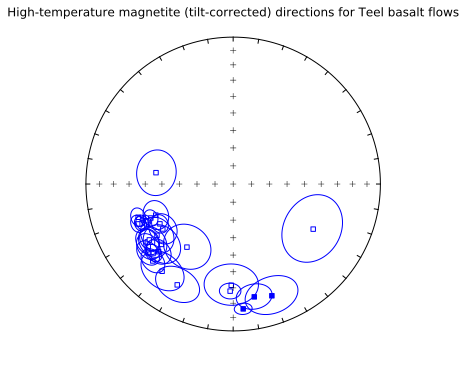

In [69]:
fignum = 1
plt.figure(num=fignum,figsize=(5,5))
ipmag.plot_net(1)
for n in range(len(teel_mag_means)):
    ipmag.plot_di_mean(teel_mag_means['dec_tc'][n],
                      teel_mag_means['inc_tc'][n],
                      teel_mag_means['alpha95'][n],
                      color='b',marker='s',label='')
plt.title('High-temperature magnetite (tilt-corrected) directions for Teel basalt flows')
plt.show()

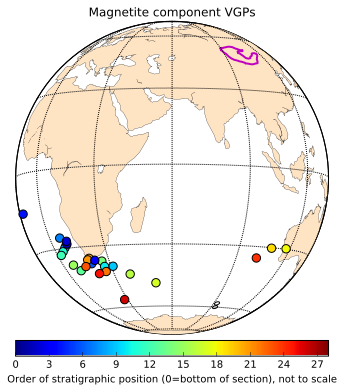

In [70]:
m = Basemap(projection='ortho',lat_0=-5,lon_0=60,resolution='c',area_thresh=50000)
plt.figure(figsize=(6, 6))
m.drawcoastlines(linewidth=0.25)
m.fillcontinents(color='bisque',lake_color='white',zorder=1)
m.drawmapboundary(fill_color='white')
m.drawmeridians(np.arange(0,360,30))
m.drawparallels(np.arange(-90,90,30))
m.readshapefile('./shapefiles/reconstructed_0','Mongolia',linewidth=2,color='m')
#length of range (28 instead of 29) cuts off mag component of Z58 which is on the other hemisphere
for n in xrange (0, len(teel_mag_means)):
     poles = ipmag.plot_pole_colorbar(m, teel_mag_means['vgp_lon'][n],teel_mag_means['vgp_lat'][n], 
                        1, 
                        teel_mag_means['strat_pos'][n], 
                        0,
                        28, 
                        markersize=70, color="k", alpha=1)


plt.title('Magnetite component VGPs')
m.colorbar(poles,location='bottom',label='Order of stratigraphic position (0=bottom of section), not to scale')
plt.show()

#### Hematite directions

##### Geographic coordinates - hematite

In [71]:
# Convert mean direction dictionaries to dataframes
Z30_hem_geo = pd.DataFrame.from_dict({'Z30_hem_geo':Z30_hem_geo_mean}, orient='index')
Z35_hem_geo = pd.DataFrame.from_dict({'Z35_hem_geo':Z35_hem_geo_mean}, orient='index')
Z39_hem_geo = pd.DataFrame.from_dict({'Z39_hem_geo':Z39_hem_geo_mean}, orient='index')
Z40_hem_geo = pd.DataFrame.from_dict({'Z40_hem_geo':Z40_hem_geo_mean}, orient='index')
Z41_hem_geo = pd.DataFrame.from_dict({'Z41_hem_geo':Z41_hem_geo_mean}, orient='index')
Z42_hem_geo = pd.DataFrame.from_dict({'Z42_hem_geo':Z42_hem_geo_mean}, orient='index')
Z43_hem_geo = pd.DataFrame.from_dict({'Z43_hem_geo':Z43_hem_geo_mean}, orient='index')
Z44_hem_geo = pd.DataFrame.from_dict({'Z44_hem_geo':Z44_hem_geo_mean}, orient='index')
Z45_hem_geo = pd.DataFrame.from_dict({'Z45_hem_geo':Z45_hem_geo_mean}, orient='index')
Z47_hem_geo = pd.DataFrame.from_dict({'Z47_hem_geo':Z47_hem_geo_mean}, orient='index')
Z48_hem_geo = pd.DataFrame.from_dict({'Z48_hem_geo':Z48_hem_geo_mean}, orient='index')
Z49_hem_geo = pd.DataFrame.from_dict({'Z49_hem_geo':Z49_hem_geo_mean}, orient='index')
Z50_hem_geo = pd.DataFrame.from_dict({'Z50_hem_geo':Z50_hem_geo_mean}, orient='index')
Z51_hem_geo = pd.DataFrame.from_dict({'Z51_hem_geo':Z51_hem_geo_mean}, orient='index')
Z52_hem_geo = pd.DataFrame.from_dict({'Z52_hem_geo':Z52_hem_geo_mean}, orient='index')
Z53_hem_geo = pd.DataFrame.from_dict({'Z53_hem_geo':Z53_hem_geo_mean}, orient='index')
Z54_hem_geo = pd.DataFrame.from_dict({'Z54_hem_geo':Z54_hem_geo_mean}, orient='index')
Z56_hem_geo = pd.DataFrame.from_dict({'Z56_hem_geo':Z56_hem_geo_mean}, orient='index')
Z57_hem_geo = pd.DataFrame.from_dict({'Z57_hem_geo':Z57_hem_geo_mean}, orient='index')
# combine all mean direction dataframes
teel_hem_means_geo = Z35_hem_geo
teel_hem_means_geo = teel_hem_means_geo.append(Z30_hem_geo) #excluded b/c large a95
teel_hem_means_geo = teel_hem_means_geo.append(Z39_hem_geo)
teel_hem_means_geo = teel_hem_means_geo.append(Z40_hem_geo)
teel_hem_means_geo = teel_hem_means_geo.append(Z41_hem_geo)
teel_hem_means_geo = teel_hem_means_geo.append(Z42_hem_geo)
teel_hem_means_geo = teel_hem_means_geo.append(Z43_hem_geo)
teel_hem_means_geo = teel_hem_means_geo.append(Z44_hem_geo)
teel_hem_means_geo = teel_hem_means_geo.append(Z45_hem_geo)
teel_hem_means_geo = teel_hem_means_geo.append(Z47_hem_geo)
teel_hem_means_geo = teel_hem_means_geo.append(Z48_hem_geo)
teel_hem_means_geo = teel_hem_means_geo.append(Z49_hem_geo)
teel_hem_means_geo = teel_hem_means_geo.append(Z50_hem_geo)
teel_hem_means_geo = teel_hem_means_geo.append(Z51_hem_geo)
teel_hem_means_geo = teel_hem_means_geo.append(Z52_hem_geo)
teel_hem_means_geo = teel_hem_means_geo.append(Z53_hem_geo)
teel_hem_means_geo = teel_hem_means_geo.append(Z54_hem_geo) #excluded b/c large a95
teel_hem_means_geo = teel_hem_means_geo.append(Z56_hem_geo)
teel_hem_means_geo = teel_hem_means_geo.append(Z57_hem_geo)
#rename dec/inc columns, vgp_calc requires *_tc to be appended to dec/inc
#...this will be changed back for the final table (below)
teel_hem_means_geo = teel_hem_means_geo.rename(columns={'dec':'dec_tc'})
teel_hem_means_geo = teel_hem_means_geo.rename(columns={'inc':'inc_tc'})
#rearrange columns
teel_hem_means_geo = teel_hem_means_geo[['dec_tc','inc_tc','alpha95','n','k','r','csd']]
# not all sites have hematite comp - before adding site lat/long, delete rows
teel_locs_hem_edit = teel_2015_site_locs
teel_locs_hem_edit = teel_locs_hem_edit[teel_locs_hem_edit.er_site_name !='Z31']
teel_locs_hem_edit = teel_locs_hem_edit[teel_locs_hem_edit.er_site_name !='Z32']
teel_locs_hem_edit = teel_locs_hem_edit[teel_locs_hem_edit.er_site_name !='Z33']
teel_locs_hem_edit = teel_locs_hem_edit[teel_locs_hem_edit.er_site_name !='Z34']
teel_locs_hem_edit = teel_locs_hem_edit[teel_locs_hem_edit.er_site_name !='Z36']
teel_locs_hem_edit = teel_locs_hem_edit[teel_locs_hem_edit.er_site_name !='Z37']
teel_locs_hem_edit = teel_locs_hem_edit[teel_locs_hem_edit.er_site_name !='Z38']
teel_locs_hem_edit = teel_locs_hem_edit[teel_locs_hem_edit.er_site_name !='Z46']
teel_locs_hem_edit = teel_locs_hem_edit[teel_locs_hem_edit.er_site_name !='Z55']
teel_locs_hem_edit = teel_locs_hem_edit[teel_locs_hem_edit.er_site_name !='Z58']
#insert site_lat/site_lon
teel_hem_means_geo.insert(0,'site_lat',list(teel_locs_hem_edit['site_lat']))
teel_hem_means_geo.insert(1,'site_lon',list(teel_locs_hem_edit['site_lon']))
teel_hem_means_geo.insert(0,'strat_pos',list(teel_locs_hem_edit['strat_pos']))
#calculate pole coordinates for mean directions
ipmag.vgp_calc(teel_hem_means_geo)
teel_hem_means_geo = teel_hem_means_geo.rename(columns={'dec_tc':'dec_geo'})
teel_hem_means_geo = teel_hem_means_geo.rename(columns={'inc_tc':'inc_geo'})
teel_hem_means_geo.to_csv('./notebook_output/teel_hem_means_geo')
teel_hem_means_geo

,strat_pos,site_lat,site_lon,dec_geo,inc_geo,alpha95,n,k,r,csd,paleolatitude,vgp_lat,vgp_lon,vgp_lat_rev,vgp_lon_rev
Z35_hem_geo,4.0,47.10038,95.37550,185.352162,-5.560896,5.747798,6,136.842402,5.963462,6.924281,-2.787011,-45.444034,87.744611,45.444034,267.744611
Z30_hem_geo,9.0,47.10069,95.37747,148.799913,-68.209834,49.957167,7,2.413452,4.513935,52.139357,-51.356099,-69.351223,208.833918,69.351223,28.833918
Z39_hem_geo,14.0,47.09860,95.38467,196.313095,-15.623428,8.663295,5,78.962990,4.949343,9.115347,-7.959659,-48.458523,70.583219,48.458523,250.583219
Z40_hem_geo,15.0,47.09859,95.38474,189.173033,-23.507115,7.794855,7,60.926778,6.901521,10.377217,-12.269627,-54.326542,79.891757,54.326542,259.891757
Z41_hem_geo,10.0,47.10109,95.37744,178.834997,-26.225350,16.086290,5,23.576274,4.830338,16.681974,-13.836835,-56.721476,97.439300,56.721476,277.439300
Z42_hem_geo,16.0,47.09577,95.38577,165.448451,27.278167,16.388007,6,17.664613,5.716948,19.272274,14.457588,-27.077402,111.243174,27.077402,291.243174
Z43_hem_geo,17.0,47.09570,95.38638,182.753379,12.734651,6.220142,8,80.262873,7.912787,9.041233,6.446942,-36.401745,91.986451,36.401745,271.986451
Z44_hem_geo,18.0,47.09571,95.38651,182.138846,26.690156,2.023836,7,890.663468,6.993263,2.714115,14.109891,-28.764330,93.020083,28.764330,273.020083
Z45_hem_geo,19.0,47.09562,95.38676,179.431606,23.111384,4.657126,8,142.431974,7.950854,6.787053,12.045434,-30.856760,96.034300,30.856760,276.034300
Z47_hem_geo,21.0,47.09568,95.38727,186.530284,-3.818259,14.407211,7,18.506577,6.675791,18.828771,-1.911251,-44.460110,86.223719,44.460110,266.223719


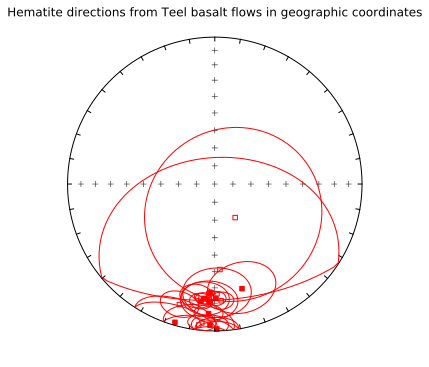

In [72]:
teel_hem_means_dib_geo = ipmag.make_di_block(list(teel_hem_means_geo['dec_geo']),list(teel_hem_means_geo['inc_geo']))
teel_hem_di_mean_geo = pmag.fisher_mean(teel_hem_means_dib_geo)
fignum = 1
plt.figure(num=fignum,figsize=(5,5))
ipmag.plot_net(1)
for n in range(len(teel_hem_means_geo)):
    ipmag.plot_di_mean(teel_hem_means_geo['dec_geo'][n],
                      teel_hem_means_geo['inc_geo'][n],
                      teel_hem_means_geo['alpha95'][n],
                      color='r',marker='s',label='')
plt.title('Hematite directions from Teel basalt flows in geographic coordinates')
plt.show()

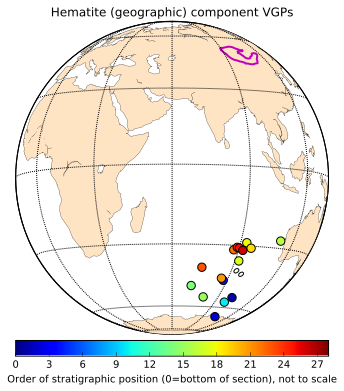

In [73]:
m = Basemap(projection='ortho',lat_0=-5,lon_0=60,resolution='c',area_thresh=50000)
plt.figure(figsize=(6, 6))
m.drawcoastlines(linewidth=0.25)
m.fillcontinents(color='bisque',lake_color='white',zorder=1)
m.drawmapboundary(fill_color='white')
m.drawmeridians(np.arange(0,360,30))
m.drawparallels(np.arange(-90,90,30))
m.readshapefile('./shapefiles/reconstructed_0','Mongolia',linewidth=2,color='m')

for n in xrange (0, len(teel_hem_means_geo)):
     poles = ipmag.plot_pole_colorbar(m, teel_hem_means_geo['vgp_lon'][n],teel_hem_means_geo['vgp_lat'][n], 
                        1, 
                        teel_hem_means_geo['strat_pos'][n], 
                        0,
                        28, 
                        markersize=70, color="k", alpha=1)


plt.title('Hematite (geographic) component VGPs')
m.colorbar(poles,location='bottom',label='Order of stratigraphic position (0=bottom of section), not to scale')
plt.show()

##### Tilt-corrected coordinates - hematite

In [74]:
# Convert mean direction dictionaries to dataframes
Z30_hem = pd.DataFrame.from_dict({'Z30_hem':Z30_hem_tc_mean}, orient='index')
Z35_hem = pd.DataFrame.from_dict({'Z35_hem':Z35_hem_tc_mean}, orient='index')
Z39_hem = pd.DataFrame.from_dict({'Z39_hem':Z39_hem_tc_mean}, orient='index')
Z40_hem = pd.DataFrame.from_dict({'Z40_hem':Z40_hem_tc_mean}, orient='index')
Z41_hem = pd.DataFrame.from_dict({'Z41_hem':Z41_hem_tc_mean}, orient='index')
Z42_hem = pd.DataFrame.from_dict({'Z42_hem':Z42_hem_tc_mean}, orient='index')
Z43_hem = pd.DataFrame.from_dict({'Z43_hem':Z43_hem_tc_mean}, orient='index')
Z44_hem = pd.DataFrame.from_dict({'Z44_hem':Z44_hem_tc_mean}, orient='index')
Z45_hem = pd.DataFrame.from_dict({'Z45_hem':Z45_hem_tc_mean}, orient='index')
Z47_hem = pd.DataFrame.from_dict({'Z47_hem':Z47_hem_tc_mean}, orient='index')
Z48_hem = pd.DataFrame.from_dict({'Z48_hem':Z48_hem_tc_mean}, orient='index')
Z49_hem = pd.DataFrame.from_dict({'Z49_hem':Z49_hem_tc_mean}, orient='index')
Z50_hem = pd.DataFrame.from_dict({'Z50_hem':Z50_hem_tc_mean}, orient='index')
Z51_hem = pd.DataFrame.from_dict({'Z51_hem':Z51_hem_tc_mean}, orient='index')
Z52_hem = pd.DataFrame.from_dict({'Z52_hem':Z52_hem_tc_mean}, orient='index')
Z53_hem = pd.DataFrame.from_dict({'Z53_hem':Z53_hem_tc_mean}, orient='index')
Z54_hem = pd.DataFrame.from_dict({'Z54_hem':Z54_hem_tc_mean}, orient='index')
Z56_hem = pd.DataFrame.from_dict({'Z56_hem':Z56_hem_tc_mean}, orient='index')
Z57_hem = pd.DataFrame.from_dict({'Z57_hem':Z57_hem_tc_mean}, orient='index')
# combine all mean direction dataframes
teel_hem_means = Z35_hem
teel_hem_means = teel_hem_means.append(Z30_hem) #excluded b/c large a95
teel_hem_means = teel_hem_means.append(Z39_hem)
teel_hem_means = teel_hem_means.append(Z40_hem)
teel_hem_means = teel_hem_means.append(Z41_hem)
teel_hem_means = teel_hem_means.append(Z42_hem)
teel_hem_means = teel_hem_means.append(Z43_hem)
teel_hem_means = teel_hem_means.append(Z44_hem)
teel_hem_means = teel_hem_means.append(Z45_hem)
teel_hem_means = teel_hem_means.append(Z47_hem)
teel_hem_means = teel_hem_means.append(Z48_hem)
teel_hem_means = teel_hem_means.append(Z49_hem)
teel_hem_means = teel_hem_means.append(Z50_hem)
teel_hem_means = teel_hem_means.append(Z51_hem)
teel_hem_means = teel_hem_means.append(Z52_hem)
teel_hem_means = teel_hem_means.append(Z53_hem)
teel_hem_means = teel_hem_means.append(Z54_hem) #excluded b/c large a95
teel_hem_means = teel_hem_means.append(Z56_hem)
teel_hem_means = teel_hem_means.append(Z57_hem)
#rename dec/inc columns to show that they are tilt-corrected directions
teel_hem_means = teel_hem_means.rename(columns={'dec':'dec_tc'})
teel_hem_means = teel_hem_means.rename(columns={'inc':'inc_tc'})
#rearrange columns
teel_hem_means = teel_hem_means[['dec_tc','inc_tc','alpha95','n','k','r','csd']]
# not all sites have hematite comp - before adding site lat/long, delete rows
teel_locs_hem_edit = teel_2015_site_locs
teel_locs_hem_edit = teel_locs_hem_edit[teel_locs_hem_edit.er_site_name !='Z31']
teel_locs_hem_edit = teel_locs_hem_edit[teel_locs_hem_edit.er_site_name !='Z32']
teel_locs_hem_edit = teel_locs_hem_edit[teel_locs_hem_edit.er_site_name !='Z33']
teel_locs_hem_edit = teel_locs_hem_edit[teel_locs_hem_edit.er_site_name !='Z34']
teel_locs_hem_edit = teel_locs_hem_edit[teel_locs_hem_edit.er_site_name !='Z36']
teel_locs_hem_edit = teel_locs_hem_edit[teel_locs_hem_edit.er_site_name !='Z37']
teel_locs_hem_edit = teel_locs_hem_edit[teel_locs_hem_edit.er_site_name !='Z38']
teel_locs_hem_edit = teel_locs_hem_edit[teel_locs_hem_edit.er_site_name !='Z46']
teel_locs_hem_edit = teel_locs_hem_edit[teel_locs_hem_edit.er_site_name !='Z55']
teel_locs_hem_edit = teel_locs_hem_edit[teel_locs_hem_edit.er_site_name !='Z58']

#insert site_lat/site_lon
teel_hem_means.insert(0,'site_lat',list(teel_locs_hem_edit['site_lat']))
teel_hem_means.insert(1,'site_lon',list(teel_locs_hem_edit['site_lon']))
teel_hem_means.insert(0,'strat_pos',list(teel_locs_hem_edit['strat_pos']))
#calculate pole coordinates for mean directions
ipmag.vgp_calc(teel_hem_means)
teel_hem_means.to_csv('./notebook_output/teel_hem_means')
teel_hem_means

,strat_pos,site_lat,site_lon,dec_tc,inc_tc,alpha95,n,k,r,csd,paleolatitude,vgp_lat,vgp_lon,vgp_lat_rev,vgp_lon_rev
Z35_hem,4.0,47.10038,95.37550,185.114311,6.025809,5.727598,6,137.802632,5.963716,6.900114,3.021259,-39.676603,88.733786,39.676603,268.733786
Z30_hem,9.0,47.10069,95.37747,242.928054,-40.237690,49.931876,7,2.414928,4.515454,52.123423,-22.933069,-34.802858,8.295178,34.802858,188.295178
Z39_hem,14.0,47.09860,95.38467,201.539571,2.413034,8.658960,5,79.041121,4.949393,9.110841,1.207052,-38.143076,67.563030,38.143076,247.563030
Z40_hem,15.0,47.09859,95.38474,202.157748,-7.928196,7.788149,7,61.030111,6.901688,10.368429,-3.983165,-42.830083,64.518459,42.830083,244.518459
Z41_hem,10.0,47.10109,95.37744,198.411151,-11.058439,16.113432,5,23.500114,4.829788,16.708984,-5.581195,-45.565273,68.698517,45.565273,248.698517
Z42_hem,16.0,47.09577,95.38577,151.386122,14.995751,16.374487,6,17.692229,5.717390,19.257227,7.628503,-29.676516,128.501026,29.676516,308.501026
Z43_hem,17.0,47.09570,95.38638,173.787706,13.587096,6.227989,8,80.063147,7.912569,9.052503,6.890414,-35.733259,102.991555,35.733259,282.991555
Z44_hem,18.0,47.09571,95.38651,163.946455,23.981346,2.033549,7,882.184819,6.993199,2.727126,12.539568,-28.658505,113.302682,28.658505,293.302682
Z45_hem,19.0,47.09562,95.38676,164.416633,19.689336,4.665334,8,141.934618,7.950682,6.798934,10.144077,-31.097230,113.374942,31.097230,293.374942
Z47_hem,21.0,47.09568,95.38727,186.913270,2.679432,14.418197,7,18.479833,6.675322,18.842390,1.340449,-41.186055,86.186406,41.186055,266.186406


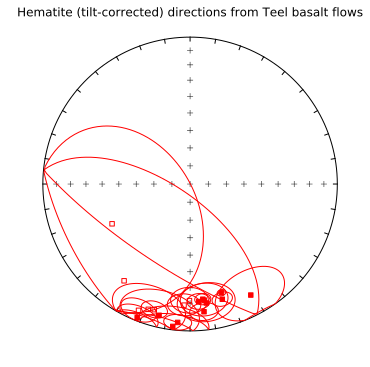

In [75]:
teel_hem_means_dib_tc = ipmag.make_di_block(list(teel_hem_means['dec_tc']),list(teel_hem_means['inc_tc']))
teel_hem_di_mean_tc = pmag.fisher_mean(teel_hem_means_dib_tc)

fignum = 1
plt.figure(num=fignum,figsize=(5,5))
ipmag.plot_net(1)
for n in range(len(teel_hem_means)):
    ipmag.plot_di_mean(teel_hem_means['dec_tc'][n],
                      teel_hem_means['inc_tc'][n],
                      teel_hem_means['alpha95'][n],
                      color='r',marker='s',label='')
plt.title('Hematite (tilt-corrected) directions from Teel basalt flows')
plt.show()

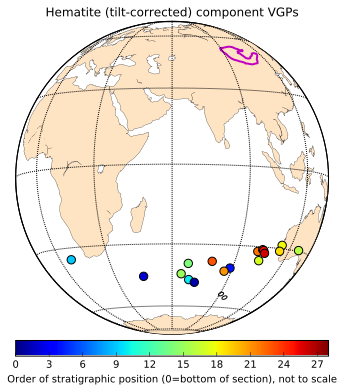

In [76]:
m = Basemap(projection='ortho',lat_0=-5,lon_0=60,resolution='c',area_thresh=50000)
plt.figure(figsize=(6, 6))
m.drawcoastlines(linewidth=0.25)
m.fillcontinents(color='bisque',lake_color='white',zorder=1)
m.drawmapboundary(fill_color='white')
m.drawmeridians(np.arange(0,360,30))
m.drawparallels(np.arange(-90,90,30))
m.readshapefile('./shapefiles/reconstructed_0','Mongolia',linewidth=2,color='m')

for n in xrange (0, len(teel_hem_means)):
     poles = ipmag.plot_pole_colorbar(m, teel_hem_means['vgp_lon'][n],teel_hem_means['vgp_lat'][n], 
                        1, 
                        teel_hem_means['strat_pos'][n], 
                        0,
                        28, 
                        markersize=70, color="k", alpha=1)


plt.title('Hematite (tilt-corrected) component VGPs')
m.colorbar(poles,location='bottom',label='Order of stratigraphic position (0=bottom of section), not to scale')
plt.show()

#### Mid-temperature directions

In [77]:
# Convert mean direction dictionaries to dataframes
# TODO: figure out a way to iterate (or simplify) this code block, it's verbose...
#...Although, it processes very quickly!
Z42_mid = pd.DataFrame.from_dict({'Z42_mid':Z42_mid_geo_mean}, orient='index')
Z43_mid = pd.DataFrame.from_dict({'Z43_mid':Z43_mid_geo_mean}, orient='index')
Z58_mid = pd.DataFrame.from_dict({'Z58_mid':Z58_mid_geo_mean}, orient='index')
# combine all mean direction dataframes
teel_mid_means = Z42_mid
teel_mid_means = teel_mid_means.append(Z43_mid)
teel_mid_means = teel_mid_means.append(Z58_mid)
#rename dec/inc columns to show that they are tilt-corrected directions
teel_mid_means = teel_mid_means.rename(columns={'dec':'dec_tc'})
teel_mid_means = teel_mid_means.rename(columns={'inc':'inc_tc'})
#rearrange columns
teel_mid_means = teel_mid_means[['dec_tc','inc_tc','alpha95','n','k','r','csd']]
# not all sites have mid-temp comp - before adding site lat/long, delete rows
teel_locs_mid_edit = teel_2015_site_locs.ix[[12,13,28]]
#insert site_lat/site_lon
teel_mid_means.insert(0,'site_lat',list(teel_locs_mid_edit['site_lat']))
teel_mid_means.insert(1,'site_lon',list(teel_locs_mid_edit['site_lon']))
teel_mid_means.insert(0,'strat_pos',list(teel_locs_mid_edit['strat_pos']))
#calculate pole coordinates for mean directions
ipmag.vgp_calc(teel_mid_means)
teel_mid_means = teel_mid_means.rename(columns={'dec_tc':'dec_geo'})
teel_mid_means = teel_mid_means.rename(columns={'inc_tc':'inc_geo'})
teel_mid_means

,strat_pos,site_lat,site_lon,dec_geo,inc_geo,alpha95,n,k,r,csd,paleolatitude,vgp_lat,vgp_lon,vgp_lat_rev,vgp_lon_rev
Z42_mid,16.0,47.09577,95.38577,332.936127,-68.973663,22.704625,4,17.342624,3.827016,19.450359,-52.447527,-12.194273,291.867415,12.194273,111.867415
Z43_mid,17.0,47.09570,95.38638,214.749151,-62.316153,27.256978,4,12.329873,3.756688,23.067776,-43.621783,-65.542782,0.679322,65.542782,180.679322
Z58_mid,NaN,47.06277,95.42045,169.686782,-61.093602,4.004771,6,280.878503,5.982199,4.833100,-42.161138,-81.183719,155.401297,81.183719,335.401297


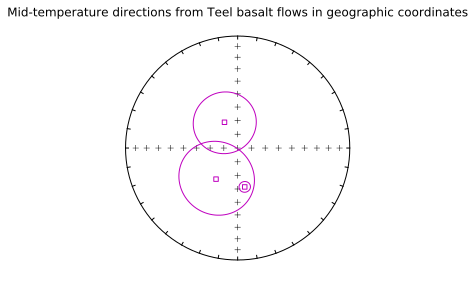

In [78]:
fignum = 1
plt.figure(num=fignum,figsize=(4,4))
ipmag.plot_net(1)
for n in range(len(teel_mid_means)):
    ipmag.plot_di_mean(teel_mid_means['dec_geo'][n],
                      teel_mid_means['inc_geo'][n],
                      teel_mid_means['alpha95'][n],
                      color='m',marker='s',label='')
plt.title('Mid-temperature directions from Teel basalt flows in geographic coordinates')
plt.show()

Flow Z58 yielded a completely different mid-temperature result compared to all other sites. The magnetite direction is completely different than all other results. The mean direction is very imprecise (SE and moderately-shallow down) but is closest in orientation to the Middle to Late Carboniferous 'A' component of Edel et al. (2014).

## Paleomagnetic Poles for the Teel Formation

We interpret the primary paleomagnetic direction for the Teel basalts to be held by (titano)magnetite with a secondary remanence held by hematite holding a distinct direction. However, demagnetization data from some sites within the most oxidized flows show similarities betwee the remanence directions of magnetite and hematite that correspond to the hematite direction seen in other flows that have a distinct magnetite direction. We suspect that these flows were overprinted in the remagnetization event that led to the hematite overprint. As a result we exclude this flows where magnetite corresponds to the distinct hematite direction from the calculation of the mean magnetite pole. 

#### Primary magnetite pole - including fold test

In [79]:
# A number of poles are excluded because of their similarity to the hematite components...
# ...suggesting a broad overlap in the unblockin spectra of hematite into the magnetite range
teel_mag_means_edit,teel_mag_means_geo_edit=[],[]
teel_prim_mag_vgps = teel_mag_means #tilt-corrected exclusions
#teel_prim_mag_vgps = teel_prim_mag_vgps[teel_prim_mag_vgps.index !='Z30_mag']
#teel_prim_mag_vgps = teel_prim_mag_vgps[teel_prim_mag_vgps.index !='Z43_mag']
teel_prim_mag_vgps = teel_prim_mag_vgps[teel_prim_mag_vgps.index !='Z44_mag']
teel_prim_mag_vgps = teel_prim_mag_vgps[teel_prim_mag_vgps.index !='Z45_mag']
teel_prim_mag_vgps = teel_prim_mag_vgps[teel_prim_mag_vgps.index !='Z50_mag']
#teel_prim_mag_vgps = teel_prim_mag_vgps[teel_prim_mag_vgps.index !='Z52_mag']
teel_prim_mag_vgps = teel_prim_mag_vgps[teel_prim_mag_vgps.index !='Z56_mag']
teel_prim_mag_vgps = teel_prim_mag_vgps[teel_prim_mag_vgps.index !='Z57_mag']
teel_prim_mag_vgps = teel_prim_mag_vgps[teel_prim_mag_vgps.index !='Z58_mag']
teel_mag_means_edit = teel_mag_means#also eliminated same sites from dec/incs
#teel_mag_means_edit = teel_mag_means_edit.drop('Z30_mag')
#teel_mag_means_edit = teel_mag_means_edit.drop('Z43_mag')
teel_mag_means_edit = teel_mag_means_edit.drop('Z44_mag')
teel_mag_means_edit = teel_mag_means_edit.drop('Z45_mag')
teel_mag_means_edit = teel_mag_means_edit.drop('Z50_mag')
#teel_mag_means_edit = teel_mag_means_edit.drop('Z52_mag')
teel_mag_means_edit = teel_mag_means_edit.drop('Z56_mag')
teel_mag_means_edit = teel_mag_means_edit.drop('Z57_mag')
teel_mag_means_edit = teel_mag_means_edit.drop('Z58_mag')
teel_prim_mag_geo_vgps = teel_mag_means_geo #geographic exclusions (same as TC dirs)
#teel_prim_mag_geo_vgps = teel_prim_mag_geo_vgps[teel_prim_mag_geo_vgps.index !='Z30_mag_geo']
#teel_prim_mag_geo_vgps = teel_prim_mag_geo_vgps[teel_prim_mag_geo_vgps.index !='Z43_mag_geo']
teel_prim_mag_geo_vgps = teel_prim_mag_geo_vgps[teel_prim_mag_geo_vgps.index !='Z44_mag_geo']
teel_prim_mag_geo_vgps = teel_prim_mag_geo_vgps[teel_prim_mag_geo_vgps.index !='Z45_mag_geo']
teel_prim_mag_geo_vgps = teel_prim_mag_geo_vgps[teel_prim_mag_geo_vgps.index !='Z50_mag_geo']
#teel_prim_mag_geo_vgps = teel_prim_mag_geo_vgps[teel_prim_mag_geo_vgps.index !='Z52_mag_geo']
teel_prim_mag_geo_vgps = teel_prim_mag_geo_vgps[teel_prim_mag_geo_vgps.index !='Z56_mag_geo']
teel_prim_mag_geo_vgps = teel_prim_mag_geo_vgps[teel_prim_mag_geo_vgps.index !='Z57_mag_geo']
teel_prim_mag_geo_vgps = teel_prim_mag_geo_vgps[teel_prim_mag_geo_vgps.index !='Z58_mag_geo']
teel_mag_means_geo_edit = teel_mag_means_geo
#teel_mag_means_geo_edit = teel_mag_means_geo_edit.drop('Z30_mag_geo')
#teel_mag_means_geo_edit = teel_mag_means_geo_edit.drop('Z43_mag_geo')
teel_mag_means_geo_edit = teel_mag_means_geo_edit.drop('Z44_mag_geo')#also eliminated same sites from dec/incs
teel_mag_means_geo_edit = teel_mag_means_geo_edit.drop('Z45_mag_geo')
teel_mag_means_geo_edit = teel_mag_means_geo_edit.drop('Z50_mag_geo')
#teel_mag_means_geo_edit = teel_mag_means_geo_edit.drop('Z52_mag_geo')
teel_mag_means_geo_edit = teel_mag_means_geo_edit.drop('Z56_mag_geo')
teel_mag_means_geo_edit = teel_mag_means_geo_edit.drop('Z57_mag_geo')
teel_mag_means_geo_edit = teel_mag_means_geo_edit.drop('Z58_mag_geo')
teel_site_bedding_edit = teel_site_bedding #also eliminate same sites from bedding orient. table
#teel_site_bedding_edit = teel_site_bedding_edit[teel_site_bedding_edit.index !='Z30']
#teel_site_bedding_edit = teel_site_bedding_edit[teel_site_bedding_edit.index !='Z43']
teel_site_bedding_edit = teel_site_bedding_edit[teel_site_bedding_edit.index !='Z44']
teel_site_bedding_edit = teel_site_bedding_edit[teel_site_bedding_edit.index !='Z45']
teel_site_bedding_edit = teel_site_bedding_edit[teel_site_bedding_edit.index !='Z50']
#teel_site_bedding_edit = teel_site_bedding_edit[teel_site_bedding_edit.index !='Z52']
teel_site_bedding_edit = teel_site_bedding_edit[teel_site_bedding_edit.index !='Z56']
teel_site_bedding_edit = teel_site_bedding_edit[teel_site_bedding_edit.index !='Z57']
teel_site_bedding_edit = teel_site_bedding_edit[teel_site_bedding_edit.index !='Z58']

In [80]:
#calculate means from edited list
teel_mag_means_dib_geo = ipmag.make_di_block(list(teel_mag_means_geo_edit['dec_geo']),list(teel_mag_means_geo_edit['inc_geo']))
teel_mag_di_mean_geo = pmag.fisher_mean(teel_mag_means_dib_geo)
teel_mag_means_dib = ipmag.make_di_block(list(teel_mag_means_edit['dec_tc']),list(teel_mag_means_edit['inc_tc']))
teel_mag_di_mean = pmag.fisher_mean(teel_mag_means_dib)

In [81]:
teel_mag_di_mean

{'alpha95': 5.0086857955568123,
 'csd': 13.227632008881132,
 'dec': 236.57506633194134,
 'inc': -34.718946614912966,
 'k': 37.497803506068692,
 'n': 23,
 'r': 22.413298968393189}

In [82]:
teel_mag_di_mean_geo

{'alpha95': 5.6999490725608677,
 'csd': 14.995518371967318,
 'dec': 187.20165106730997,
 'inc': -64.708352826237814,
 'k': 29.177432381947135,
 'n': 23,
 'r': 22.245992597566193}

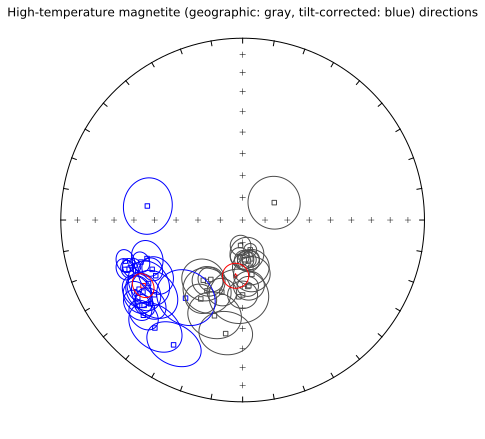

In [83]:
fignum = 1
plt.figure(num=fignum,figsize=(6,6))
ipmag.plot_net(1)
for n in range(len(teel_mag_means_geo_edit)):
    ipmag.plot_di_mean(teel_mag_means_edit['dec_tc'][n],
                      teel_mag_means_edit['inc_tc'][n],
                      teel_mag_means_edit['alpha95'][n],
                      color='b',marker='s',label='')
    ipmag.plot_di_mean(teel_mag_means_geo_edit['dec_geo'][n],
                      teel_mag_means_geo_edit['inc_geo'][n],
                      teel_mag_means_geo_edit['alpha95'][n],
                      color='0.3',marker='s',label='')
ipmag.plot_di_mean(teel_mag_di_mean['dec'],
                      teel_mag_di_mean['inc'],
                      teel_mag_di_mean['alpha95'],
                      color='r',marker='s')
ipmag.plot_di_mean(teel_mag_di_mean_geo['dec'],
                      teel_mag_di_mean_geo['inc'],
                      teel_mag_di_mean_geo['alpha95'],
                      color='r',marker='*')
plt.title('High-temperature magnetite (geographic: gray, tilt-corrected: blue) directions')
plt.savefig('./notebook_output/Mag_fold_test.pdf')
plt.show()

###### Bootstrap fold test (Tauxe and Watson, 1994)

doing  1000  iterations...please be patient.....


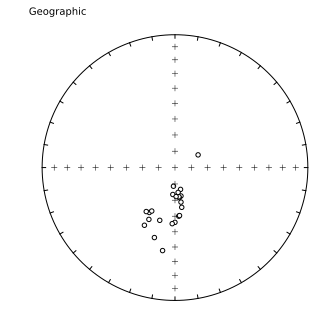

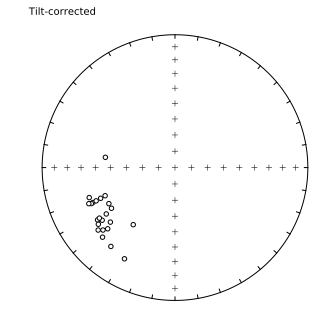


tightest grouping of vectors obtained at (95% confidence bounds):
51 - 94 percent unfolding
range of all bootstrap samples: 
35  -  105 percent unfolding


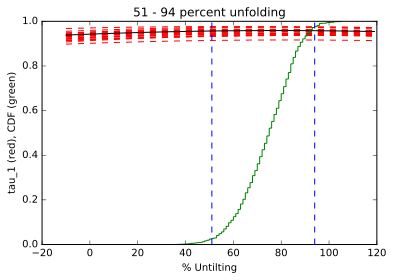

In [84]:
mag_boot_list =[]
for i in range(len(teel_prim_mag_geo_vgps)):
    dec_g,inc_g,dip_dir,dip=teel_prim_mag_geo_vgps['dec_geo'][i],teel_prim_mag_geo_vgps['inc_geo'][i],teel_site_bedding_edit['sample_bed_dip_direction'][i],teel_site_bedding_edit['sample_bed_dip'][i]
    mag_boot_list.append([dec_g,inc_g,dip_dir,dip])
mag_boot_data = np.array(mag_boot_list)
#save bootstrap file for command line fold test figure output
np.savetxt('./notebook_output/mag_boot_data.txt',mag_boot_data,fmt='%.2f',delimiter=' ')
ipmag.bootstrap_fold_test(mag_boot_data,num_sims=1000,min_untilt=-10,max_untilt=120)

Below the tilt-corrected magnetite VGPs are plotted on the globe and shaded according to their relative stratigraphic positions.

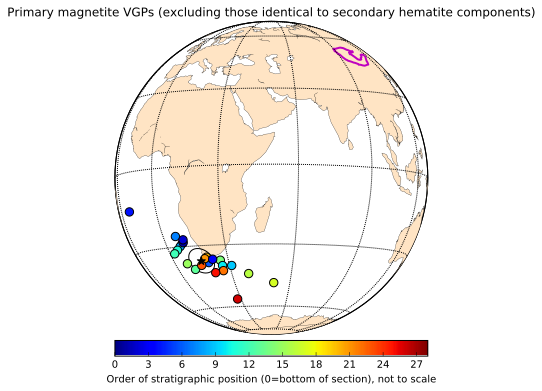

In [85]:
teel_prim_mag_vgps_dir = ipmag.make_di_block(teel_prim_mag_vgps['vgp_lon'],teel_prim_mag_vgps['vgp_lat'])
teel_prim_mag_pole = pmag.fisher_mean(teel_prim_mag_vgps_dir)

m = Basemap(projection='ortho',lat_0=-5,lon_0=50,resolution='c',area_thresh=50000)
plt.figure(figsize=(6, 6))
m.drawcoastlines(linewidth=0.25)
m.fillcontinents(color='bisque',lake_color='white',zorder=1)
m.drawmapboundary(fill_color='white')
m.drawmeridians(np.arange(0,360,30))
m.drawparallels(np.arange(-90,90,30))
m.readshapefile('./shapefiles/reconstructed_0','Mongolia',linewidth=2,color='m')

for n in xrange (0, len(teel_prim_mag_vgps)):
     poles = ipmag.plot_pole_colorbar(m, teel_prim_mag_vgps['vgp_lon'][n],teel_prim_mag_vgps['vgp_lat'][n], 
                        1, 
                        teel_prim_mag_vgps['strat_pos'][n], 
                        0,
                        28, 
                        markersize=70, color="k", alpha=1)

plt.title('Primary magnetite VGPs (excluding those identical to secondary hematite components)')
m.colorbar(poles,location='bottom',label='Order of stratigraphic position (0=bottom of section), not to scale')
ipmag.plot_pole(m,teel_prim_mag_pole['dec'],teel_prim_mag_pole['inc'],teel_prim_mag_pole['alpha95'],marker='*',markersize=70)
#plt.savefig('./notebook_output/...')
plt.show()

#### Secondary hematite pole - including fold test

In [86]:
# A number of poles are excluded because of their similarity to the hematite components...
# ...suggesting a broad overlap in the unblocking spectra of hematite into the magnetite range
teel_hem_means_edit,teel_hem_means_geo_edit=[],[]
teel_sec_hem_vgps = teel_hem_means#tilt-corrected exclusions
teel_sec_hem_vgps = teel_sec_hem_vgps[teel_sec_hem_vgps.index !='Z30_hem']
teel_sec_hem_vgps = teel_sec_hem_vgps[teel_sec_hem_vgps.index !='Z54_hem']
teel_hem_means_edit = teel_hem_means#also eliminated same sites from dec/incs
teel_hem_means_edit = teel_hem_means_edit.drop('Z30_hem')
teel_hem_means_edit = teel_hem_means_edit.drop('Z54_hem')
teel_sec_hem_geo_vgps = teel_hem_means_geo#geographic exclusions (same as TC dirs)
teel_sec_hem_geo_vgps = teel_sec_hem_geo_vgps[teel_sec_hem_geo_vgps.index !='Z30_hem_geo']
teel_sec_hem_geo_vgps = teel_sec_hem_geo_vgps[teel_sec_hem_geo_vgps.index !='Z54_hem_geo']
teel_hem_means_geo_edit = teel_hem_means_geo
teel_hem_means_geo_edit = teel_hem_means_geo_edit.drop('Z30_hem_geo')#also eliminated same sites from dec/incs
teel_hem_means_geo_edit = teel_hem_means_geo_edit.drop('Z54_hem_geo')
teel_site_bedding_hedit = teel_site_bedding #also eliminate same sites from bedding orient. table
teel_site_bedding_hedit = teel_site_bedding_hedit[teel_site_bedding_hedit.index !='Z30']
teel_site_bedding_hedit = teel_site_bedding_hedit[teel_site_bedding_hedit.index !='Z31']
teel_site_bedding_hedit = teel_site_bedding_hedit[teel_site_bedding_hedit.index !='Z32']
teel_site_bedding_hedit = teel_site_bedding_hedit[teel_site_bedding_hedit.index !='Z33']
teel_site_bedding_hedit = teel_site_bedding_hedit[teel_site_bedding_hedit.index !='Z34']
teel_site_bedding_hedit = teel_site_bedding_hedit[teel_site_bedding_hedit.index !='Z36']
teel_site_bedding_hedit = teel_site_bedding_hedit[teel_site_bedding_hedit.index !='Z37']
teel_site_bedding_hedit = teel_site_bedding_hedit[teel_site_bedding_hedit.index !='Z38']
teel_site_bedding_hedit = teel_site_bedding_hedit[teel_site_bedding_hedit.index !='Z46']
teel_site_bedding_hedit = teel_site_bedding_hedit[teel_site_bedding_hedit.index !='Z54']
teel_site_bedding_hedit = teel_site_bedding_hedit[teel_site_bedding_hedit.index !='Z55']
teel_site_bedding_hedit = teel_site_bedding_hedit[teel_site_bedding_hedit.index !='Z58']

In [87]:
#calculate means from edited list
teel_hem_means_dib_geo = ipmag.make_di_block(list(teel_hem_means_geo_edit['dec_geo']),list(teel_hem_means_geo_edit['inc_geo']))
teel_hem_di_mean_geo = pmag.fisher_mean(teel_hem_means_dib_geo)
teel_hem_means_dib = ipmag.make_di_block(list(teel_hem_means_edit['dec_tc']),list(teel_hem_means_edit['inc_tc']))
teel_hem_di_mean = pmag.fisher_mean(teel_hem_means_dib)

In [88]:
teel_hem_di_mean_geo

{'alpha95': 8.9877257442158918,
 'csd': 19.806244991238223,
 'dec': 183.64700144578103,
 'inc': 5.4005776522632472,
 'k': 16.724985285223418,
 'n': 17,
 'r': 16.043347439346565}

In [89]:
teel_hem_di_mean

{'alpha95': 9.4366310429368436,
 'csd': 20.733802634569454,
 'dec': 181.16680682161584,
 'inc': 6.4513316241785841,
 'k': 15.262023482436897,
 'n': 17,
 'r': 15.95164622054131}

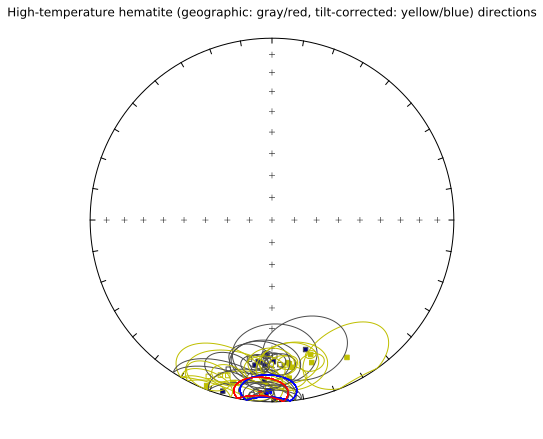

In [90]:
fignum = 1
plt.figure(num=fignum,figsize=(6,6))
ipmag.plot_net(1)
for n in range(len(teel_hem_means_geo_edit)):
    ipmag.plot_di_mean(teel_hem_means_edit['dec_tc'][n],
                      teel_hem_means_edit['inc_tc'][n],
                      teel_hem_means_edit['alpha95'][n],
                      color='y',marker='s',label='')
    ipmag.plot_di_mean(teel_hem_means_geo_edit['dec_geo'][n],
                      teel_hem_means_geo_edit['inc_geo'][n],
                      teel_hem_means_geo_edit['alpha95'][n],
                      color='0.3',marker='s',label='')
    ipmag.plot_di_mean(teel_hem_di_mean['dec'],
                      teel_hem_di_mean['inc'],
                      teel_hem_di_mean['alpha95'],
                      color='b',marker='s')
    ipmag.plot_di_mean(teel_hem_di_mean_geo['dec'],
                      teel_hem_di_mean_geo['inc'],
                      teel_hem_di_mean_geo['alpha95'],
                      color='r',marker='*')
plt.title('High-temperature hematite (geographic: gray/red, tilt-corrected: yellow/blue) directions')
plt.savefig('./notebook_output/hematite_fold_test.pdf')
plt.show()

###### Bootstrap fold test (Tauxe and Watson, 1994)

doing  1000  iterations...please be patient.....


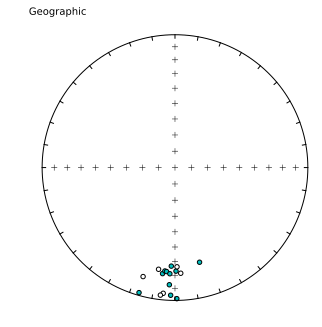

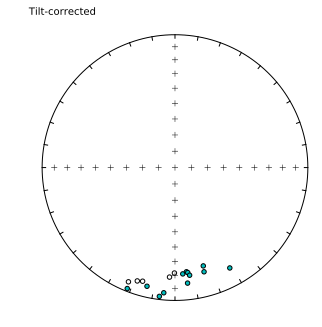


tightest grouping of vectors obtained at (95% confidence bounds):
-20 - 119 percent unfolding
range of all bootstrap samples: 
-20  -  119 percent unfolding


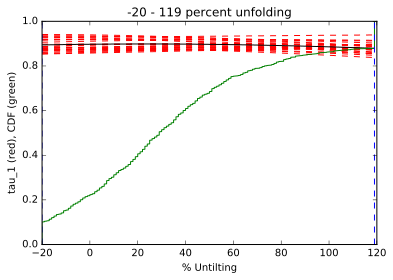

In [91]:
hem_boot_list =[]
for i in range(len(teel_sec_hem_geo_vgps)):
    dec_g,inc_g,dip_dir,dip=teel_sec_hem_geo_vgps['dec_geo'][i],teel_sec_hem_geo_vgps['inc_geo'][i],teel_site_bedding_hedit['sample_bed_dip_direction'][i],teel_site_bedding_hedit['sample_bed_dip'][i]
    hem_boot_list.append([dec_g,inc_g,dip_dir,dip])
hem_boot_data = np.array(hem_boot_list)
#save bootstrap file for command line fold test figure output
np.savetxt('./notebook_output/hem_boot_data.txt',hem_boot_data,fmt='%.2f',delimiter=' ')
ipmag.bootstrap_fold_test(hem_boot_data,num_sims=1000,min_untilt=-20,max_untilt=120)

Below the geographic and tilt-corrected hematite VGPs are plotted on the globe and shaded according to their relative stratigraphic positions. Note the similar positions between the two coordinate system means.

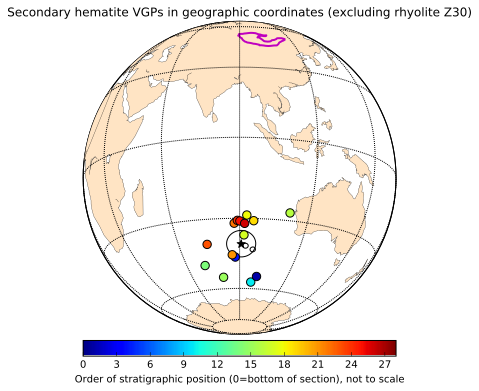

In [92]:
teel_sec_hem_vgps_geo_dir = ipmag.make_di_block(teel_hem_means_geo_edit['vgp_lon'],teel_hem_means_geo_edit['vgp_lat'])
teel_sec_hem_pole_geo = pmag.fisher_mean(teel_sec_hem_vgps_geo_dir)

m = Basemap(projection='ortho',lat_0=-15,lon_0=90,resolution='c',area_thresh=50000)
plt.figure(figsize=(6, 6))
m.drawcoastlines(linewidth=0.25)
m.fillcontinents(color='bisque',lake_color='white',zorder=1)
m.drawmapboundary(fill_color='white')
m.drawmeridians(np.arange(0,360,30))
m.drawparallels(np.arange(-90,90,30))
m.readshapefile('./shapefiles/reconstructed_0','Mongolia',linewidth=2,color='m')

for n in xrange (0, len(teel_hem_means_geo_edit)):
     poles = ipmag.plot_pole_colorbar(m, teel_hem_means_geo_edit['vgp_lon'][n],teel_hem_means_geo_edit['vgp_lat'][n], 
                        1, 
                        teel_hem_means_geo_edit['strat_pos'][n], 
                        0,
                        28, 
                        markersize=70, color="k", alpha=1)

plt.title('Secondary hematite VGPs in geographic coordinates (excluding rhyolite Z30)')
m.colorbar(poles,location='bottom',label='Order of stratigraphic position (0=bottom of section), not to scale')
ipmag.plot_pole(m,teel_sec_hem_pole_geo['dec'],teel_sec_hem_pole_geo['inc'],teel_sec_hem_pole_geo['alpha95'],marker='*',markersize=70)
#plt.savefig('./notebook_output/')
plt.show()

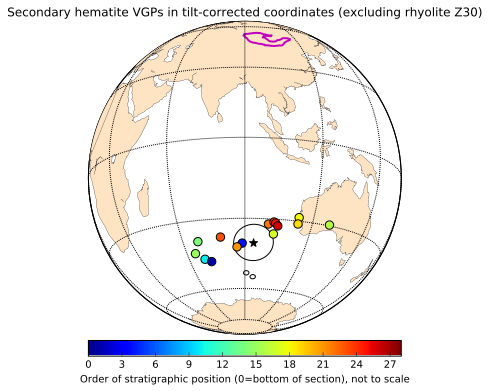

In [93]:
teel_sec_hem_vgps_dir = ipmag.make_di_block(teel_sec_hem_vgps['vgp_lon'],teel_sec_hem_vgps['vgp_lat'])
teel_sec_hem_pole = pmag.fisher_mean(teel_sec_hem_vgps_dir)

m = Basemap(projection='ortho',lat_0=-15,lon_0=90,resolution='c',area_thresh=50000)
plt.figure(figsize=(6, 6))
m.drawcoastlines(linewidth=0.25)
m.fillcontinents(color='bisque',lake_color='white',zorder=1)
m.drawmapboundary(fill_color='white')
m.drawmeridians(np.arange(0,360,30))
m.drawparallels(np.arange(-90,90,30))
m.readshapefile('./shapefiles/reconstructed_0','Mongolia',linewidth=2,color='m')

for n in xrange (0, len(teel_sec_hem_vgps)):
     poles = ipmag.plot_pole_colorbar(m, teel_sec_hem_vgps['vgp_lon'][n],teel_sec_hem_vgps['vgp_lat'][n], 
                        1, 
                        teel_sec_hem_vgps['strat_pos'][n], 
                        0,
                        28, 
                        markersize=70, color="k", alpha=1)

plt.title('Secondary hematite VGPs in tilt-corrected coordinates (excluding rhyolite Z30)')
m.colorbar(poles,location='bottom',label='Order of stratigraphic position (0=bottom of section), not to scale')
ipmag.plot_pole(m,teel_sec_hem_pole['dec'],teel_sec_hem_pole['inc'],teel_sec_hem_pole['alpha95'],marker='*',markersize=70)
#plt.savefig('./notebook_output/...')
plt.show()

#### Present local field overprint - negative fold test

In [94]:
# Convert mean direction dictionaries to dataframes
Z30_low_geo = pd.DataFrame.from_dict({'Z30_low_geo':Z30_low_geo_mean}, orient='index')
Z31_low_geo = pd.DataFrame.from_dict({'Z31_low_geo':Z31_low_geo_mean}, orient='index')
Z32_low_geo = pd.DataFrame.from_dict({'Z32_low_geo':Z32_low_geo_mean}, orient='index')
Z33_low_geo = pd.DataFrame.from_dict({'Z33_low_geo':Z33_low_geo_mean}, orient='index')
Z34_low_geo = pd.DataFrame.from_dict({'Z34_low_geo':Z34_low_geo_mean}, orient='index')
Z35_low_geo = pd.DataFrame.from_dict({'Z35_low_geo':Z35_low_geo_mean}, orient='index')
Z36_low_geo = pd.DataFrame.from_dict({'Z36_low_geo':Z36_low_geo_mean}, orient='index')
Z37_low_geo = pd.DataFrame.from_dict({'Z37_low_geo':Z37_low_geo_mean}, orient='index')
Z38_low_geo = pd.DataFrame.from_dict({'Z38_low_geo':Z38_low_geo_mean}, orient='index')
Z39_low_geo = pd.DataFrame.from_dict({'Z39_low_geo':Z39_low_geo_mean}, orient='index')
Z40_low_geo = pd.DataFrame.from_dict({'Z40_low_geo':Z40_low_geo_mean}, orient='index')
Z41_low_geo = pd.DataFrame.from_dict({'Z41_low_geo':Z41_low_geo_mean}, orient='index')
Z42_low_geo = pd.DataFrame.from_dict({'Z42_low_geo':Z42_low_geo_mean}, orient='index')
Z43_low_geo = pd.DataFrame.from_dict({'Z43_low_geo':Z43_low_geo_mean}, orient='index')
Z44_low_geo = pd.DataFrame.from_dict({'Z44_low_geo':Z44_low_geo_mean}, orient='index')
Z45_low_geo = pd.DataFrame.from_dict({'Z45_low_geo':Z45_low_geo_mean}, orient='index')
Z46_low_geo = pd.DataFrame.from_dict({'Z46_low_geo':Z46_low_geo_mean}, orient='index')
Z47_low_geo = pd.DataFrame.from_dict({'Z47_low_geo':Z47_low_geo_mean}, orient='index')
Z48_low_geo = pd.DataFrame.from_dict({'Z48_low_geo':Z48_low_geo_mean}, orient='index')
Z49_low_geo = pd.DataFrame.from_dict({'Z49_low_geo':Z49_low_geo_mean}, orient='index')
#Z50_low_geo = pd.DataFrame.from_dict({'Z50_low_geo':Z50_low_geo_mean}, orient='index')
Z51_low_geo = pd.DataFrame.from_dict({'Z51_low_geo':Z51_low_geo_mean}, orient='index')
Z52_low_geo = pd.DataFrame.from_dict({'Z52_low_geo':Z52_low_geo_mean}, orient='index')
Z53_low_geo = pd.DataFrame.from_dict({'Z53_low_geo':Z53_low_geo_mean}, orient='index')
Z54_low_geo = pd.DataFrame.from_dict({'Z54_low_geo':Z54_low_geo_mean}, orient='index')
Z55_low_geo = pd.DataFrame.from_dict({'Z55_low_geo':Z55_low_geo_mean}, orient='index')
Z56_low_geo = pd.DataFrame.from_dict({'Z56_low_geo':Z56_low_geo_mean}, orient='index')
Z57_low_geo = pd.DataFrame.from_dict({'Z57_low_geo':Z57_low_geo_mean}, orient='index')
Z58_low_geo = pd.DataFrame.from_dict({'Z58_low_geo':Z58_low_geo_mean}, orient='index')
# combine all mean direction dataframes
teel_low_means_geo = Z30_low_geo
teel_low_means_geo = teel_low_means_geo.append(Z31_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z32_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z33_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z34_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z35_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z36_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z37_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z38_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z39_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z40_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z41_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z42_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z43_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z44_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z45_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z46_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z47_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z48_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z49_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z51_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z52_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z53_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z54_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z55_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z56_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z57_low_geo)
teel_low_means_geo = teel_low_means_geo.append(Z58_low_geo)
#rename dec/inc columns to show that they are tilt-corrected directions
teel_low_means_geo = teel_low_means_geo.rename(columns={'dec':'dec_tc'})
teel_low_means_geo = teel_low_means_geo.rename(columns={'inc':'inc_tc'})
#rearrange columns
teel_low_means_geo = teel_low_means_geo[['dec_tc','inc_tc','alpha95','n','k','r','csd']]
# not all sites have hematite comp - before adding site lat/long, delete rows
teel_locs_low_edit = teel_2015_site_locs
teel_locs_low_edit = teel_locs_low_edit[teel_locs_low_edit.er_site_name !='Z50']
#insert site_lat/site_lon
teel_low_means_geo.insert(0,'site_lat',list(teel_locs_low_edit['site_lat']))
teel_low_means_geo.insert(1,'site_lon',list(teel_locs_low_edit['site_lon']))
teel_low_means_geo.insert(0,'strat_pos',list(teel_locs_low_edit['strat_pos']))
#calculate pole coordinates for mean directions
ipmag.vgp_calc(teel_low_means_geo)
#rename columns
teel_low_means_geo = teel_low_means_geo.rename(columns={'dec_tc':'dec_geo'})
teel_low_means_geo = teel_low_means_geo.rename(columns={'inc_tc':'inc_geo'})
teel_low_means_geo.head()

,strat_pos,site_lat,site_lon,dec_geo,inc_geo,alpha95,n,k,r,csd,paleolatitude,vgp_lat,vgp_lon,vgp_lat_rev,vgp_lon_rev
Z30_low_geo,4.0,47.10038,95.37550,346.473053,68.261419,11.458361,7,28.705783,6.790983,15.118208,51.429142,80.188638,36.526238,-80.188638,216.526238
Z31_low_geo,5.0,47.10049,95.37604,0.054372,64.923839,3.618073,8,235.361535,7.970259,5.279798,46.897847,89.793993,264.986185,-89.793993,84.986185
Z32_low_geo,6.0,47.10094,95.37684,25.802949,62.301378,8.844441,8,40.180191,7.825785,12.778475,43.603851,71.621088,186.850544,-71.621088,6.850544
Z33_low_geo,7.0,47.10107,95.37705,0.930272,64.380739,6.003504,8,86.089978,7.918690,8.729889,46.196993,88.893147,239.802233,-88.893147,59.802233
Z34_low_geo,8.0,47.10111,95.37712,0.648074,62.405014,3.865736,10,157.128808,9.942722,6.461854,43.729780,86.598151,267.460060,-86.598151,87.460060


In [95]:
# Convert mean direction dictionaries to dataframes
Z30_low = pd.DataFrame.from_dict({'Z30_low':Z30_low_tc_mean}, orient='index')
Z31_low = pd.DataFrame.from_dict({'Z31_low':Z31_low_tc_mean}, orient='index')
Z32_low = pd.DataFrame.from_dict({'Z32_low':Z32_low_tc_mean}, orient='index')
Z33_low = pd.DataFrame.from_dict({'Z33_low':Z33_low_tc_mean}, orient='index')
Z34_low = pd.DataFrame.from_dict({'Z34_low':Z34_low_tc_mean}, orient='index')
Z35_low = pd.DataFrame.from_dict({'Z35_low':Z35_low_tc_mean}, orient='index')
Z36_low = pd.DataFrame.from_dict({'Z36_low':Z36_low_tc_mean}, orient='index')
Z37_low = pd.DataFrame.from_dict({'Z37_low':Z37_low_tc_mean}, orient='index')
Z38_low = pd.DataFrame.from_dict({'Z38_low':Z38_low_tc_mean}, orient='index')
Z39_low = pd.DataFrame.from_dict({'Z39_low':Z39_low_tc_mean}, orient='index')
Z40_low = pd.DataFrame.from_dict({'Z40_low':Z40_low_tc_mean}, orient='index')
Z41_low = pd.DataFrame.from_dict({'Z41_low':Z41_low_tc_mean}, orient='index')
Z42_low = pd.DataFrame.from_dict({'Z42_low':Z42_low_tc_mean}, orient='index')
Z43_low = pd.DataFrame.from_dict({'Z43_low':Z43_low_tc_mean}, orient='index')
Z44_low = pd.DataFrame.from_dict({'Z44_low':Z44_low_tc_mean}, orient='index')
Z45_low = pd.DataFrame.from_dict({'Z45_low':Z45_low_tc_mean}, orient='index')
Z46_low = pd.DataFrame.from_dict({'Z46_low':Z46_low_tc_mean}, orient='index')
Z47_low = pd.DataFrame.from_dict({'Z47_low':Z47_low_tc_mean}, orient='index')
Z48_low = pd.DataFrame.from_dict({'Z48_low':Z48_low_tc_mean}, orient='index')
Z49_low = pd.DataFrame.from_dict({'Z49_low':Z49_low_tc_mean}, orient='index')
#Z50_low = pd.DataFrame.from_dict({'Z50_low':Z50_low_tc_mean}, orient='index')
Z51_low = pd.DataFrame.from_dict({'Z51_low':Z51_low_tc_mean}, orient='index')
Z52_low = pd.DataFrame.from_dict({'Z52_low':Z52_low_tc_mean}, orient='index')
Z53_low = pd.DataFrame.from_dict({'Z53_low':Z53_low_tc_mean}, orient='index')
Z54_low = pd.DataFrame.from_dict({'Z54_low':Z54_low_tc_mean}, orient='index')
Z55_low = pd.DataFrame.from_dict({'Z55_low':Z55_low_tc_mean}, orient='index')
Z56_low = pd.DataFrame.from_dict({'Z56_low':Z56_low_tc_mean}, orient='index')
Z57_low = pd.DataFrame.from_dict({'Z57_low':Z57_low_tc_mean}, orient='index')
Z58_low = pd.DataFrame.from_dict({'Z58_low':Z58_low_tc_mean}, orient='index')
# combine all mean direction dataframes
teel_low_means = Z30_low
teel_low_means = teel_low_means.append(Z31_low)
teel_low_means = teel_low_means.append(Z32_low)
teel_low_means = teel_low_means.append(Z33_low)
teel_low_means = teel_low_means.append(Z34_low)
teel_low_means = teel_low_means.append(Z35_low)
teel_low_means = teel_low_means.append(Z36_low)
teel_low_means = teel_low_means.append(Z37_low)
teel_low_means = teel_low_means.append(Z38_low)
teel_low_means = teel_low_means.append(Z39_low)
teel_low_means = teel_low_means.append(Z40_low)
teel_low_means = teel_low_means.append(Z41_low)
teel_low_means = teel_low_means.append(Z42_low)
teel_low_means = teel_low_means.append(Z43_low)
teel_low_means = teel_low_means.append(Z44_low)
teel_low_means = teel_low_means.append(Z45_low)
teel_low_means = teel_low_means.append(Z46_low)
teel_low_means = teel_low_means.append(Z47_low)
teel_low_means = teel_low_means.append(Z48_low)
teel_low_means = teel_low_means.append(Z49_low)
teel_low_means = teel_low_means.append(Z51_low)
teel_low_means = teel_low_means.append(Z52_low)
teel_low_means = teel_low_means.append(Z53_low)
teel_low_means = teel_low_means.append(Z54_low)
teel_low_means = teel_low_means.append(Z55_low)
teel_low_means = teel_low_means.append(Z56_low)
teel_low_means = teel_low_means.append(Z57_low)
teel_low_means = teel_low_means.append(Z58_low)
#rename dec/inc columns to show that they are tilt-corrected directions
teel_low_means = teel_low_means.rename(columns={'dec':'dec_tc'})
teel_low_means = teel_low_means.rename(columns={'inc':'inc_tc'})
#rearrange columns
teel_low_means = teel_low_means[['dec_tc','inc_tc','alpha95','n','k','r','csd']]
#insert site_lat/site_lon
teel_low_means.insert(0,'site_lat',list(teel_locs_low_edit['site_lat']))
teel_low_means.insert(1,'site_lon',list(teel_locs_low_edit['site_lon']))
teel_low_means.insert(0,'strat_pos',list(teel_locs_low_edit['strat_pos']))
#calculate pole coordinates for mean directions
ipmag.vgp_calc(teel_low_means)
teel_low_means.head()

,strat_pos,site_lat,site_lon,dec_tc,inc_tc,alpha95,n,k,r,csd,paleolatitude,vgp_lat,vgp_lon,vgp_lat_rev,vgp_lon_rev
Z30_low,4.0,47.10038,95.37550,62.140855,33.713657,11.463681,7,28.680029,6.790795,15.124995,18.450285,32.248029,192.800152,-32.248029,12.800152
Z31_low,5.0,47.10049,95.37604,59.403835,27.876060,3.615270,8,235.725142,7.970304,5.275724,14.813793,31.483537,198.002746,-31.483537,18.002746
Z32_low,6.0,47.10094,95.37684,25.802949,62.301378,8.844441,8,40.180191,7.825785,12.778475,43.603851,71.621088,186.850544,-71.621088,6.850544
Z33_low,7.0,47.10107,95.37705,54.800714,28.344304,6.009620,8,85.916769,7.918526,8.738684,15.094685,34.722681,201.658195,-34.722681,21.658195
Z34_low,8.0,47.10111,95.37712,52.688703,27.653908,3.866823,10,157.041051,9.942690,6.463659,14.681124,35.788473,203.849471,-35.788473,23.849471


A number of poles are excluded because of inconsistencies between samples within site which resulted in large a95 values for these sites: Z45, Z51, and Z52.

In [96]:
teel_low_means_edit,teel_low_means_geo_edit=[],[]
teel_low_means_edit = teel_low_means#eliminate same sites from TC dec/incs
teel_low_means_edit = teel_low_means_edit.drop('Z45_low')
teel_low_means_edit = teel_low_means_edit.drop('Z51_low')
teel_low_means_edit = teel_low_means_edit.drop('Z52_low')
#also eliminated same sites from geo dec/incs
teel_low_means_geo_edit = teel_low_means_geo
teel_low_means_geo_edit = teel_low_means_geo_edit.drop('Z45_low_geo')
teel_low_means_geo_edit = teel_low_means_geo_edit.drop('Z51_low_geo')
teel_low_means_geo_edit = teel_low_means_geo_edit.drop('Z52_low_geo')
#for fold tests...also eliminate same sites from bedding orient. table
teel_site_bedding_ledit = teel_site_bedding 
teel_site_bedding_ledit = teel_site_bedding_ledit[teel_site_bedding_ledit.index !='Z50']
teel_site_bedding_ledit = teel_site_bedding_ledit[teel_site_bedding_ledit.index !='Z45']
teel_site_bedding_ledit = teel_site_bedding_ledit[teel_site_bedding_ledit.index !='Z51']
teel_site_bedding_ledit = teel_site_bedding_ledit[teel_site_bedding_ledit.index !='Z52']
#calculate means from edited list
teel_low_means_dib_geo = ipmag.make_di_block(list(teel_low_means_geo_edit['dec_geo']),list(teel_low_means_geo_edit['inc_geo']))
teel_low_di_mean_geo = pmag.fisher_mean(teel_low_means_dib_geo)
teel_low_means_dib = ipmag.make_di_block(list(teel_low_means_edit['dec_tc']),list(teel_low_means_edit['inc_tc']))
teel_low_di_mean = pmag.fisher_mean(teel_low_means_dib)

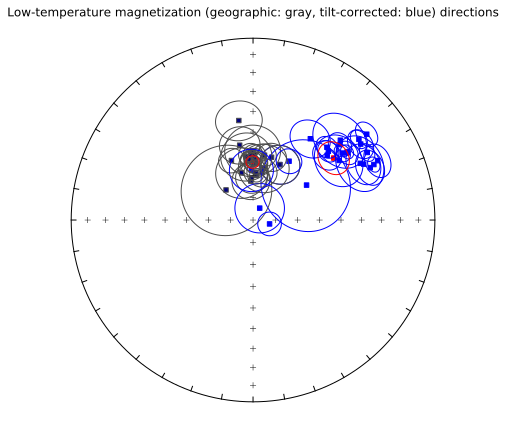

In [97]:
fignum = 1
plt.figure(num=fignum,figsize=(6,6))
ipmag.plot_net(1)
for n in range(len(teel_low_means_geo_edit)):
    ipmag.plot_di_mean(teel_low_means_edit['dec_tc'][n],
                      teel_low_means_edit['inc_tc'][n],
                      teel_low_means_edit['alpha95'][n],
                      color='b',marker='s',label='')
    ipmag.plot_di_mean(teel_low_means_geo_edit['dec_geo'][n],
                      teel_low_means_geo_edit['inc_geo'][n],
                      teel_low_means_geo_edit['alpha95'][n],
                      color='0.3',marker='s',label='')

ipmag.plot_di_mean(teel_low_di_mean['dec'],
                      teel_low_di_mean['inc'],
                      teel_low_di_mean['alpha95'],
                      color='r',marker='s')
ipmag.plot_di_mean(teel_low_di_mean_geo['dec'],
                      teel_low_di_mean_geo['inc'],
                      teel_low_di_mean_geo['alpha95'],
                      color='r',marker='*')
plt.title('Low-temperature magnetization (geographic: gray, tilt-corrected: blue) directions')
plt.savefig('./notebook_output/lowT_plf_fold_test.pdf')
plt.show()

##### Bootstrap fold test (Tauxe and Watson, 1994)

doing  1000  iterations...please be patient.....


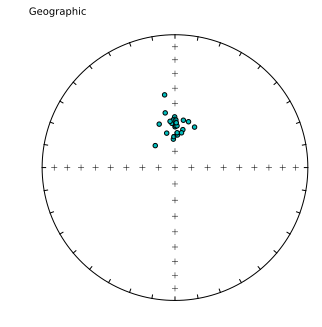

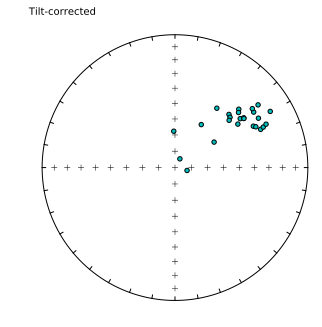


tightest grouping of vectors obtained at (95% confidence bounds):
-16 - 10 percent unfolding
range of all bootstrap samples: 
-20  -  21 percent unfolding


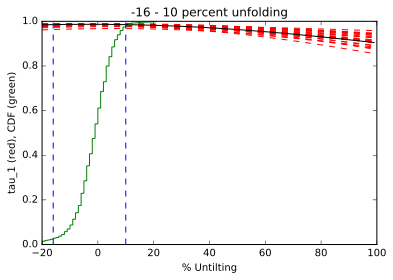

In [98]:
#also eliminate same sites from bedding orient. table
low_boot_list =[]
for i in range(len(teel_low_means_geo_edit)):
    dec_g,inc_g,dip_dir,dip=teel_low_means_geo_edit['dec_geo'][i],teel_low_means_geo_edit['inc_geo'][i],teel_site_bedding_ledit['sample_bed_dip_direction'][i],teel_site_bedding_ledit['sample_bed_dip'][i]
    low_boot_list.append([dec_g,inc_g,dip_dir,dip])
low_boot_data = np.array(low_boot_list)
#save bootstrap file for command line fold test figure output
np.savetxt('./notebook_output/low_boot_data.txt',low_boot_data,fmt='%.2f',delimiter=' ')
ipmag.bootstrap_fold_test(low_boot_data,num_sims=1000,min_untilt=-20,max_untilt=100)

#### Teel poles summary

In [99]:
#calc paleolatitudes for different Teel poles and make pd.df to add later
teel_pole_paleolats = [np.degrees(np.arctan(0.5*np.tan(np.radians(teel_mag_di_mean['inc'])))),
                      np.degrees(np.arctan(0.5*np.tan(np.radians(teel_hem_di_mean['inc'])))),
                      np.degrees(np.arctan(0.5*np.tan(np.radians(teel_hem_di_mean_geo['inc']))))]
teel_paleolats_df = pd.DataFrame(data=teel_pole_paleolats,index=('Teel_magnetite_tc','Teel_hematite_tc','Teel_hematite_geo'))
#creat array of pole info (lists)
Teel_poles=[]
Teel_poles.append(teel_prim_mag_pole)
Teel_poles.append(teel_sec_hem_pole)
Teel_poles.append(teel_sec_hem_pole_geo)
#create pandas df from pole array
TeelPoles = pd.DataFrame(data=Teel_poles, index=('Teel_magnetite_tc','Teel_hematite_tc','Teel_hematite_geo'))
#rename/insert other columns for complete table
#Tidy up table
TeelPoles = TeelPoles.rename(columns = {'csd':'CSD'})
TeelPoles = TeelPoles.rename(columns = {'alpha95':'A_95'})
TeelPoles = TeelPoles.rename(columns = {'dec':'Pole_Long'})
TeelPoles = TeelPoles.rename(columns = {'inc':'Pole_Lat'})
TeelPoles = TeelPoles.rename(columns = {'k':'K'})
TeelPoles = TeelPoles.rename(columns = {'n':'N'})
TeelPoles.insert(7,'Paleolat',teel_paleolats_df)
#reorder columns
TeelPoles = TeelPoles[['Pole_Lat','Pole_Long','A_95','K','CSD','N','r','Paleolat']]
TeelPoles.to_csv('./notebook_output/Teel_Poles')
TeelPoles

,Pole_Lat,Pole_Long,A_95,K,CSD,N,r,Paleolat
Teel_magnetite_tc,-36.400460,16.226928,5.291166,33.702707,13.952519,23,22.347233,-19.109210
Teel_hematite_tc,-39.599546,94.136871,7.315512,24.749088,16.281912,17,16.353512,3.235922
Teel_hematite_geo,-40.034308,90.750359,5.353746,45.365533,12.026022,17,16.647309,2.706300


# Pole compilation for Siberia, North China, and Mongolian terranes

## Import existing paleomagnetic data

### Siberia

Note that a rotation needs to be applied for relative rotation between Aldan and Anabar blocks before the Devonian Period due to Devonian rifting in the Viljuy Basin near the centre of the craton. Here are two rotations used in the literature:
Euler Pole (Lat, Long, rotation)

- (60ºN, 120ºE, 13º) from Smethurst et al. (1998)
- (60ºN, 115ºE, 25º) everything pre-Devonian (Evans, 2009)
- (60ºN, 120ºE, 16º) Cambrian to Early Silurian correction (Cocks and Torsvik, 2007)
- (62ºN, 117ºE, 20º) pre-Devonian (Pavlov et al. (2008) also used in Powerman et al. (2013))

Most Siberia poles are imported from Cocks and Torsvik (2007) in which the data are rotated from the "southern" Siberia (Aldan) into the northern Siberia (Anabar) reference frame according to Smethurst et al. (1998), which the authors argue brings N and S pre-Devonian poles into the best agreement.

Torsvik et al. (2012) updated their Siberia apparent polar wander path by adding data from Shatsillo et al. (2007) that superceded results from the coeval Lena River sediments (Rodianov et al., 1982; Torsvik et al., 1995). However, there are more results from Siberia that must have been discarded by Cocks and Torsvik (2007) and subsequently by other authors. We discuss these poles later on.

In [100]:
#Import Cocks and Torsvik (2007) pole table for Siberia
Cocks2007a_Pole_Table=pd.read_csv('../Data/tables/Cocks2007a_Pole_Table.csv')

In [101]:
#import Siberia spline from Cocks and Torsvik (2007)
Siberian_APWP_spline=pd.read_csv('../Data/tables/Siberian_APWP.csv')
Siberian_APWP_Plong=[]
Siberian_APWP_Plat=[]
for n in range(0,len(Siberian_APWP_spline)): 
    Plong,Plat=Siberian_APWP_spline['PLONG'][n],Siberian_APWP_spline['PLAT'][n]
    Siberian_APWP_Plong.append(Plong)
    Siberian_APWP_Plat.append(Plat)

Below we plot the paleomagnetic data compiled by Cocks and Torsvik (2007) for Siberia, shaded according to age.

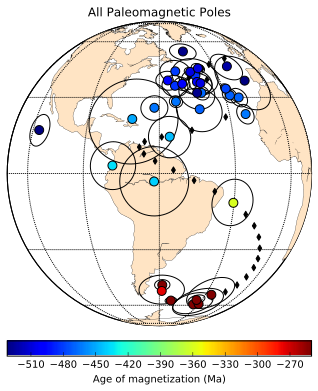

In [102]:
m = Basemap(projection='ortho',lat_0=0,lon_0=300,resolution='c',area_thresh=50000)
plt.figure(figsize=(6, 6))
m.drawcoastlines(linewidth=0.25)
m.fillcontinents(color='bisque',lake_color='white',zorder=1)
m.drawmapboundary(fill_color='white')
m.drawmeridians(np.arange(0,360,30))
m.drawparallels(np.arange(-90,90,30))

ipmag.plot_vgp(m,Siberian_APWP_Plong,Siberian_APWP_Plat,label='Siberian APWP',marker='d',color='k')
for n in xrange (0, 34):
     poles = ipmag.plot_pole_colorbar(m, Cocks2007a_Pole_Table['PLon'][n],Cocks2007a_Pole_Table['PLat'][n], 
                        Cocks2007a_Pole_Table['_95'][n], 
                        -Cocks2007a_Pole_Table['Age'][n], 
                        -532,
                        -250, 
                        markersize=80, color="k", alpha=1)


plt.title('All Paleomagnetic Poles')
m.colorbar(poles,location='bottom',pad="5%",label='Age of magnetization (Ma)')
plt.show()

In the following analyses, we update this pole list to include additional poles from the area in order to construct a paleolatitdue plot of Siberia through the Phanerozoic Eon.

We use the Haversine formula to calculate the distance between the VGPs and a reference point on a given plate. This is then used to calculate the paleolatite of the reference point.

In [103]:
def haver_dis_btw_pts(lat1, lon1, lat2, lon2):
    """
    Calculates the distance in degrees between two points on the earth 
    using the Haversine formula, which is then used to calculate the
    paleolatitude of a reference point. All points are input in degrees.
    """
    earth_rad = 6371000 # metres
    phi_1 = np.deg2rad(lat1)
    phi_2 = np.deg2rad(lat2)
    del_phi = np.deg2rad((lat2-lat1))
    del_lam = np.deg2rad((lon2-lon1))
    var_a = np.sin(del_phi/2)*np.sin(del_phi/2)+np.cos(phi_1)*np.cos(phi_2)*np.sin(del_lam/2)*np.sin(del_lam/2)
    var_c = 2*np.arctan2(np.sqrt(var_a),np.sqrt(1-var_a))
    var_d = earth_rad*var_c
    dist = np.round(var_d/111194.9, decimals=3)
    return dist

We first load poles for stable Europe from 250 Ma to the present day from Torsvik et al. (2012).

In [104]:
Europe_poles=pd.read_csv('../Data/tables/stable_europe_Sib.csv')
Siberian_Ref_Point = [51.7,103.5] #reference point for Paleolatitude
p180=np.pi/180
Europe_poles['Paleolat'] = pd.Series(np.zeros(len(Europe_poles)), index=Europe_poles.index)
Europe_poles['PLat_N'] = pd.Series(np.zeros(len(Europe_poles)), index=Europe_poles.index)
Europe_poles['PLon_N'] = pd.Series(np.zeros(len(Europe_poles)), index=Europe_poles.index)
# calculate paleolat from reference point on tip of southern Siberia
for n in range(len(Europe_poles)):
    Europe_poles.PLon_N[n] = (Europe_poles.PLon[n]-180.)%360
    Europe_poles.PLat_N[n] = -Europe_poles.PLat[n]
    Europe_poles.Paleolat[n] = 90-haver_dis_btw_pts(Siberian_Ref_Point[0],Siberian_Ref_Point[1],Europe_poles.PLat_N[n],Europe_poles.PLon_N[n])
Europe_poles.head()

,high_age,low_age,median_age,A95,PLat,PLon,Paleolat,PLat_N,PLon_N
0,1.0,0.0,0.5,3.6,-80.6,267.5,60.638,80.6,87.5
1,1.0,0.0,0.5,4.4,-86.4,296.1,55.206,86.4,116.1
2,10.0,6.0,8.0,12.9,-84.3,357.7,52.907,84.3,177.7
3,11.0,8.0,9.5,1.8,-78.9,328.3,58.733,78.9,148.3
4,11.0,9.0,10.0,3.5,-77.4,314.2,61.900,77.4,134.2


Poles from Siberia are then loaded (545 to 250 Ma). Most of the poles were taken from Cocks and Torsvik (2007) and Torsvik et al. (2012), but we also added additional data gathered from the Global Paleomagnetic Database.

In [105]:
Siberia_poles=pd.read_csv('../Data/tables/Siberia_240_550.csv')
Siberian_Ref_Point = [51.7,103.5] #reference point for Paleolatitude
p180=np.pi/180
Siberia_poles['Paleolat'] = pd.Series(np.zeros(len(Siberia_poles)), index=Siberia_poles.index)
Siberia_poles['PLat_N'] = pd.Series(np.zeros(len(Siberia_poles)), index=Siberia_poles.index)
Siberia_poles['PLon_N'] = pd.Series(np.zeros(len(Siberia_poles)), index=Siberia_poles.index)
# calculate paleolat from reference point on tip of southern Siberia
for n in range(len(Siberia_poles)):
    Siberia_poles.loc[n,'PLon_N'] = (Siberia_poles.PLon[n]-180.)%360
    Siberia_poles.loc[n,'PLat_N'] = -Siberia_poles.PLat[n]
    Siberia_poles.loc[n,'Paleolat'] = 90-haver_dis_btw_pts(Siberian_Ref_Point[0],Siberian_Ref_Point[1],Siberia_poles.PLat_N[n],Siberia_poles.PLon_N[n])
Siberia_poles

,plate_ID,high_age,low_age,median_age,A95,PLat,PLon,Reference,Paleolat,PLat_N,PLon_N
0,401,245,243,244.0,10.0,-59.0,330.0,"GPDB2832, Gurevitch et al. (1995) from Cocks a...",63.178,59.0,150.0
1,401,258,238,248.0,7.8,-59.3,325.8,Walderhaug et al. (2005) from Cocks and Torsvi...,65.344,59.3,145.8
2,401,253,248,251.0,3.3,-56.2,326.0,Gurevitch et al. (2004) from Cocks and Torsvik...,65.004,56.2,146.0
3,401,253,248,251.0,9.7,-52.8,334.4,"GPDB3486, Kravchinsky et al. (2002) from Cocks...",59.477,52.8,154.4
4,401,253,248,251.0,2.2,-56.6,307.9,Pavlov and Gallet (1996) from Cocks and Torsvi...,74.988,56.6,127.9
5,401,285,265,275.0,8.6,-50.5,301.4,Pisarevsky et al. (2006) from Cocks and Torsvi...,78.724,50.5,121.4
6,401,363,290,326.5,1.3,-21.0,350.0,"GPDB1991, Davydov and Kravchinsky (1973)",30.794,21.0,170.0
7,401,352,332,342.0,17.0,-16.0,295.0,"GPDB1986, Kamysheva (1971)",53.142,16.0,115.0
8,401,348,340,344.0,5.8,-25.2,320.0,"GPDB3041, Zhitkov et al. (1994)",51.715,25.2,140.0
9,401,377,350,360.0,8.9,-11.1,329.7,"GPDB3486, Kravchinsky et al. (2002) from Cocks...",34.892,11.1,149.7


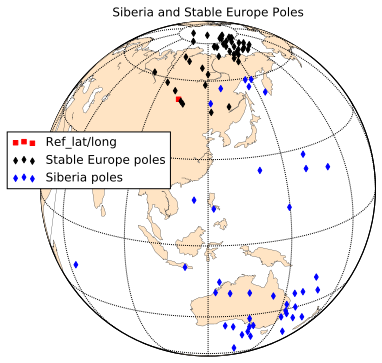

In [106]:
plt.figure(figsize=(6, 6))
m = Basemap(projection='ortho',lat_0=20,lon_0=120,resolution='c',area_thresh=50000)
m.drawcoastlines(linewidth=0.25)
m.fillcontinents(color='bisque',lake_color='white',zorder=1)
m.drawmapboundary(fill_color='white')
m.drawmeridians(np.arange(0,360,30))
m.drawparallels(np.arange(-90,90,30))

ipmag.plot_vgp(m,Siberian_Ref_Point[1],Siberian_Ref_Point[0],label='Ref_lat/long',marker='s',color='r')
ipmag.plot_vgp(m,list(Europe_poles['PLon_N']),list(Europe_poles['PLat_N']),label='Stable Europe poles',marker='d',color='k')
ipmag.plot_vgp(m,list(Siberia_poles['PLon_N']),list(Siberia_poles['PLat_N']),label='Siberia poles',marker='d',color='b')
# ipmag.plot_vgp(m,list(Sib_GPDB300_420_poles['PLon_N']),list(Sib_GPDB300_420_poles['PLat_N']),label='Sib_GPDB300_420_poles',marker='d',color='g')
plt.title('Siberia and Stable Europe Poles')
plt.legend(loc=(-0.1,0.5))
plt.show()

### North China

We first load the paleomagnetic data for North China compiled in Cocks and Torsvik (2013).

In [107]:
NorthChina_APWP_spline=pd.read_csv('../Data/tables/NorthChina_APWP.csv')
NorthChina_APWP_Plong=[]
NorthChina_APWP_Plat=[]
for n in range(0,len(NorthChina_APWP_spline)): 
    Plong,Plat=NorthChina_APWP_spline['PLONG'][n],NorthChina_APWP_spline['PLAT'][n]
    NorthChina_APWP_Plong.append(Plong)
    NorthChina_APWP_Plat.append(Plat)  

We also add some additional poles from North China that were not included in Cocks and Torsvik (2013) including a compilation of data from Huang et al. (1999) and additional poles from Embleton et al. (1996), Huang et al. (2001), and Doh and Piper (1994).

In [108]:
NC_poles=pd.read_csv('../Data/tables/NCB_70_542.csv')
North_China_Ref_Point = [42,109]
NC_poles['Paleolat'] = pd.Series(np.zeros(len(NC_poles)), index=NC_poles.index)
# calculate paleolat from reference point on tip of southern Siberia
for n in range(len(NC_poles)):
    NC_poles.loc[n,'Paleolat'] = 90-haver_dis_btw_pts(North_China_Ref_Point[0],North_China_Ref_Point[1],NC_poles.PLat[n],NC_poles.PLon[n])
NC_poles

,high_age,low_age,median_age,A95,PLat,PLon,References,Paleolat
0,88,68,78.0,5.8,79.7,170.8,see Van der Voo et al. (2015),46.149
1,98,78,88.0,5.3,81.1,294.5,see Van der Voo et al. (2015),33.136
2,110,90,100.0,4.7,70.6,156.7,see Van der Voo et al. (2015),52.870
3,123,103,113.0,5.2,76.8,192.1,see Van der Voo et al. (2015),42.209
4,126,106,116.0,4.6,83.6,172.3,see Van der Voo et al. (2015),44.602
5,128,108,118.0,5.9,75.2,147.7,see Van der Voo et al. (2015),52.663
6,128,108,118.0,12.2,69.0,200.7,see Van der Voo et al. (2015),38.082
7,131,111,121.0,3.0,84.8,30.2,see Van der Voo et al. (2015),42.801
8,131,111,121.0,6.5,82.7,159.6,see Van der Voo et al. (2015),46.356
9,138,118,128.0,6.8,73.9,153.3,see Van der Voo et al. (2015),52.221


/Users/taylorkilian/Library/Enthought/Canopy_64bit/User/lib/python2.7/site-packages/matplotlib/axes/_axes.py:519: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


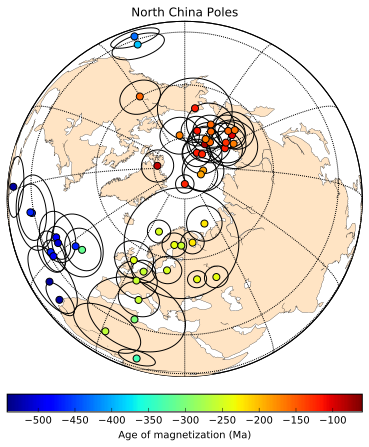

In [109]:
plt.figure(figsize=(7, 7))
m = Basemap(projection='ortho',lat_0=80,lon_0=30,resolution='c',area_thresh=50000)
m.drawcoastlines(linewidth=0.25)
m.fillcontinents(color='bisque',lake_color='white',zorder=1)
m.drawmapboundary(fill_color='white')
m.drawmeridians(np.arange(0,360,30))
m.drawparallels(np.arange(-90,90,30))
for n in xrange (0, 49):
     poles = ipmag.plot_pole_colorbar(m, NC_poles['PLon'][n],NC_poles['PLat'][n], 
                        NC_poles['A95'][n], 
                        -NC_poles['median_age'][n], 
                        -542,
                        -60, 
                        markersize=50, color="k", alpha=1,legend='yes')
plt.title('North China Poles')
m.colorbar(poles,location='bottom',pad="5%",label='Age of magnetization (Ma)')
plt.legend(loc=1)
plt.show()

### Mongolia pole compilation

Edel et al. (2014) published paleomagnetic data from 12 sites in the Trans-Altai and South Gobi zones. This work identified magnetic overprint directions for which a variety of arguments are made as to their temporal relationship. The progression of directions as interpretted by the authors leads to an appreciable change in magnetic declination from overprints intrepretted to be Middle–Late Carboniferous in age to magnetizations that are interpreted to be Permian in age. The authors propose that this declination change is the result of vertical axis rotation associated with oroclinal bending of a Mongolian ribbon continent (an illustraion of this model shown below form that paper). 

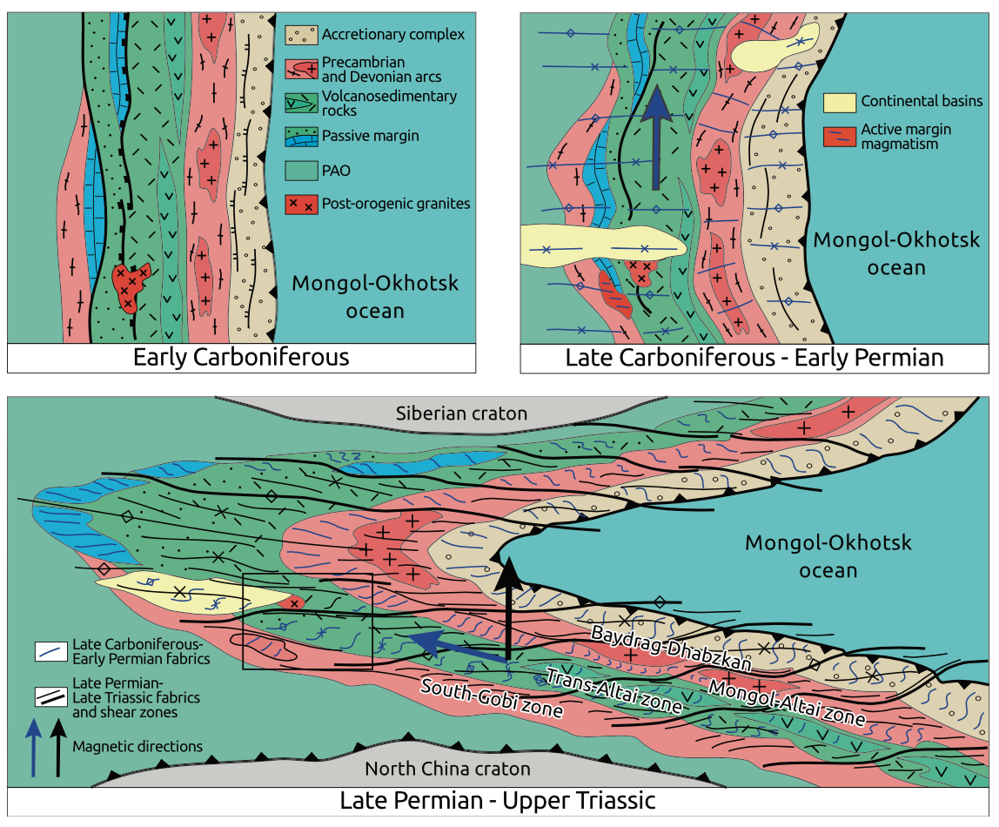

In [110]:
Edel_Orocline_Model=Image(filename='Images/Edel_Orocline_Model.png')
display(Edel_Orocline_Model)

We import paleomagnetic data that have been compiled for Mongolia and some of the surrounding terranes between Siberia and North China and assigned them to established terranes pertinent to this study.

In [111]:
Mongolia_poles=pd.read_csv('../Data/tables/Mongolia_et_al.csv')
Mongolia_Ref_Point = [47.1,95.38]
p180=np.pi/180
Mongolia_poles['Paleolat'] = pd.Series(np.zeros(len(Mongolia_poles)), index=Mongolia_poles.index)
# calculate paleolat from reference point on tip of southern Siberia
for n in range(len(Mongolia_poles)):
    Mongolia_poles.loc[n,'Paleolat'] = 90-haver_dis_btw_pts(Mongolia_Ref_Point[0],Mongolia_Ref_Point[1],Mongolia_poles.PLat[n],Mongolia_poles.PLon[n])
Mongolia_poles

,terrane,high_age,low_age,median_age,A95,PLat,PLon,Reference,Paleolat
0,Zavkhan_Baidrag,105,92,98.5,3.9,81.1,165.7,van Hinsbergen et al. (2008),49.393
1,Zavkhan_Baidrag,146,65,105.5,21.4,86.9,252.8,"GPDB2443, Pruner (1992)",44.225
2,Zavkhan_Baidrag,124,92,108.0,2.5,80.8,158.4,van Hinsbergen et al. (2008),50.579
3,Zavkhan_Baidrag,119,115,117.0,4.9,75.6,132.3,van Hinsbergen et al. (2008),57.658
4,greater_Amuria,130,110,120.0,5.2,70.8,322.4,Cogne et al. (2005),32.628
5,greater_Amuria,145,97,121.0,4.2,58.3,51.0,Halim et al. (1998),61.511
6,Zavkhan_Baidrag,125,118,121.5,4.3,82.0,172.3,van Hinsbergen et al. (2008),48.319
7,greater_Amuria,133,125,129.0,7.4,86.8,61.8,Cogne et al. (2005),49.735
8,greater_Amuria,161,145,153.0,3.1,58.9,327.3,Cogne et al. (2005),24.229
9,greater_Amuria,176,145,160.5,4.2,59.6,279.0,Kravchinsky et al. (2002),16.741


In [112]:
#Add numerical index to Teel pole table from above
Teel_Poles = TeelPoles
Teel_Poles.reset_index(drop=False, inplace=True)
Teel_Poles.insert(3, "Pole_Lat_Rev",Teel_Poles["Pole_Lat"]*-1)
Teel_Poles.insert(4, "Pole_Lon_Rev",Teel_Poles["Pole_Lat"]+180)

Calculate paleolatitudes for the Mongolia poles, considering that many may have experienced horizonatal-axis rotations during the formation of the COAB and possibly earlier.

In [113]:
Mongolia_Ref_Point = [95.38,47.1]
Teel_Poles['PLat_N'] = pd.Series(np.zeros(len(Teel_Poles)), index=Teel_Poles.index)
Teel_Poles['PLon_N'] = pd.Series(np.zeros(len(Teel_Poles)), index=Teel_Poles.index)
Teel_Poles['median_age'] = pd.Series((446,290,290), index=Teel_Poles.index)
Teel_Poles['high_age'] = pd.Series((449,400,400), index=Teel_Poles.index)
Teel_Poles['low_age'] = pd.Series((443,180,180), index=Teel_Poles.index)
# calculate paleolat from reference point on tip of southern Siberia
for n in range(len(Teel_Poles)):
    Teel_Poles.loc[n,'PLon_N'] = (Teel_Poles.Pole_Long[n]-180.)%360
    Teel_Poles.loc[n,'PLat_N'] = -Teel_Poles.Pole_Lat[n]
    Teel_Poles.loc[n,'Paleolat'] = -1.0*np.float(90-np.arccos((np.sin(p180*Teel_Poles.PLat_N[n])*np.sin(p180*Mongolia_Ref_Point[1]))+
                                                     (np.cos(p180*Teel_Poles.PLat_N[n])*np.cos(p180*Mongolia_Ref_Point[1])*
                                                     np.cos(p180*abs(Teel_Poles.PLon_N[n]-Mongolia_Ref_Point[0]))))/p180)
Teel_Poles.loc[0,'Paleolat'] = np.float(90-np.arccos((np.sin(p180*Teel_Poles.PLat_N[0])*np.sin(p180*Mongolia_Ref_Point[1]))+
                                                     (np.cos(p180*Teel_Poles.PLat_N[0])*np.cos(p180*Mongolia_Ref_Point[1])*
                                                     np.cos(p180*abs(Teel_Poles.PLon_N[0]-Mongolia_Ref_Point[0]))))/p180)

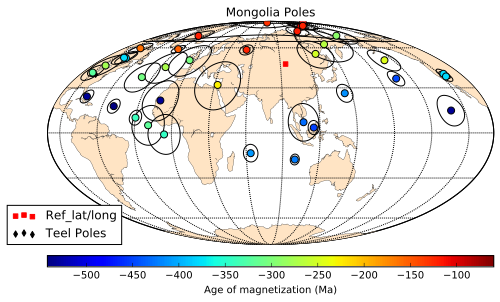

In [114]:
plt.figure(figsize=(8, 6))
m = Basemap(projection='moll',lat_0=0,lon_0=80,resolution='c',area_thresh=50000)
m.drawcoastlines(linewidth=0.25)
m.fillcontinents(color='bisque',lake_color='white',zorder=1)
m.drawmapboundary(fill_color='white')
m.drawmeridians(np.arange(0,360,30))
m.drawparallels(np.arange(-90,90,30))
for n in xrange (0, 37):
     poles = ipmag.plot_pole_colorbar(m, Mongolia_poles['PLon'][n],Mongolia_poles['PLat'][n], 
                        Mongolia_poles['A95'][n], 
                        -Mongolia_poles['median_age'][n], 
                        -542,
                        -60, 
                        markersize=50, color="k", alpha=1,legend='yes')

# ipmag.plot_vgp(m,North_China_Ref_Point[1],North_China_Ref_Point[0],label='Ref_lat/long',marker='s',color='r')
# ipmag.plot_vgp(m,list(NC_poles['PLon']),list(NC_poles['PLat']),label='North China poles',marker='d',color='k')
# ipmag.plot_vgp(m,list(Mongolia_poles['PLon']),list(Mongolia_poles['PLat']),label='Mongolia poles',marker='d',color='b')
plt.title('Mongolia Poles')
m.colorbar(poles,location='bottom',pad="5%",label='Age of magnetization (Ma)')
ipmag.plot_vgp(m,Mongolia_Ref_Point[0],Mongolia_Ref_Point[1],label='Ref_lat/long',marker='s',color='r')
ipmag.plot_vgp(m,list(Teel_Poles['PLon_N']),list(Teel_Poles['PLat_N']),label='Teel Poles',marker='d',color='k')
plt.legend(loc=(-0.09,0))
plt.show()

## Paleolatitude diagram

We plot the data from Siberia, North China, and Mongolia (from Zavkhan, Baidrag, Lake Zone, and other southern terranes) on a paleolatitude versus time plot. The paleolatitudes given for each block are for specific reference points on each terrane. For Mongolia, the site of the Teel Formation is used (95.38 ºN, 47.1 ºE). For Siberia, coordinates at the southern tip of the craton (51.7 ºN, 103.5 ºE) are given seeing as this would be the proposed conjugate margin for Mongolia. For North China, a reference point on the northern margin (42 ºN, 109 ºE) is given to represent the alternative conjugate margin that would have shared similar paleolatitudes with Mongolia if they were attached.

There are a handful of Mongolian poles that we exclude because of wide age uncertainties or lack of statistical robustness. The Bachtadse et al. (2000) component B pole is excluded because of the small number or samples used to calculate the mean direction (25 samples; unblocking temperatures of 270–420 ºC); it is very similar to two Levashova (2010) directions which may be overprints (see below). The Evans et al. (1996) Bayan-Gol pole was superseded by results from Kravchinsky (2001) and may be a pre-folding overprint, given the increase in precision after tilt correction. The Kravchinsky et al. (2010) pole, that they call a remagnetization, has a very uncertain age and is not tilt-corrected, therefore we see it as unreliable for a paleolatitude estimate. The Kovalenko (2010) pole from the granite at Hanbogd is excluded because it is only from one site and is in the Trans-Altai zone, which is severely affected by early Triassic deformation along the Gobi-Tienshan fault (Lehmann et al., 2010). The "Mongolian sediments and volcanics, Gurvan-Sayhan Range, post-folding" pole from Grishin et al. (1991) (also discussed in Pechersky and Didenko (1995)) is not included because it is likely underaveraged (only from one site) and because of its large age uncertainty; it is also a post-folding remanence.

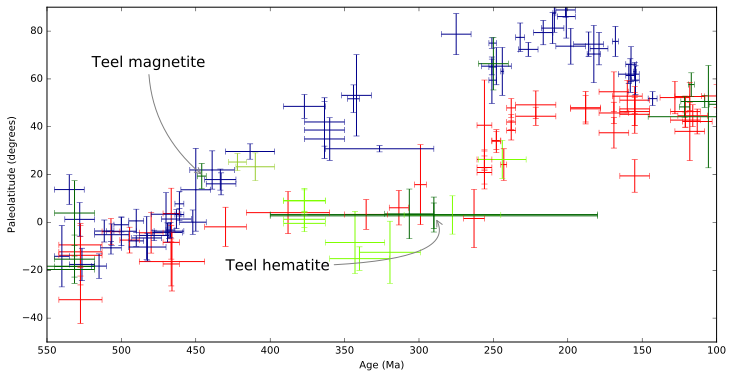

In [115]:
# remove some Mongolian poles with reasons given above
plt.figure()
Mongolia_poles_2 = Mongolia_poles
Mongolia_poles_2 = Mongolia_poles_2.drop(25)# drop Teel poles - plotting straight from NB table
Mongolia_poles_2 = Mongolia_poles_2.drop(31)# ''  ''  ''
Mongolia_poles_2 = Mongolia_poles_2.drop(28)# drop Bachtadse+2000 Comp. B direction
Mongolia_poles_2 = Mongolia_poles_2.drop(30)# drop Evans+1996 Bayan-Gol pole - uncertain remag age
Mongolia_poles_2 = Mongolia_poles_2.drop(32)# drop Kravchinsky+2010 remag pole - age very uncertain
#drop other poles - Hanbogd - crapy Grishin1991 pole
Mongolia_poles_2 = Mongolia_poles_2.drop(16)
Mongolia_poles_2 = Mongolia_poles_2.drop(23)
Mongolia_poles_2.reset_index(drop=True, inplace=True)

plt.figure(figsize=(12,6))
for n in range(len(NC_poles)):
    plt.errorbar(NC_poles.median_age[n], NC_poles.Paleolat[n], yerr=[[NC_poles.A95[n]],[NC_poles.A95[n]]],
         xerr=[[NC_poles.median_age[n]-NC_poles.low_age[n]],[NC_poles.high_age[n]-NC_poles.median_age[n]]],color='red')
for n in range(len(Europe_poles)):
    plt.errorbar(Europe_poles.median_age[n], Europe_poles.Paleolat[n], yerr=[[Europe_poles.A95[n]],[Europe_poles.A95[n]]],
         xerr=[[Europe_poles.median_age[n]-Europe_poles.low_age[n]],[Europe_poles.high_age[n]-Europe_poles.median_age[n]]],color='darkblue')
for n in range(len(Siberia_poles)):
    plt.errorbar(Siberia_poles.median_age[n], Siberia_poles.Paleolat[n], yerr=[[Siberia_poles.A95[n]],[Siberia_poles.A95[n]]],
         xerr=[[Siberia_poles.median_age[n]-Siberia_poles.low_age[n]],[Siberia_poles.high_age[n]-Siberia_poles.median_age[n]]],color='darkblue')
for n in range(len(Mongolia_poles_2)):
    if Mongolia_poles_2.terrane[n]=='Zavkhan_Baidrag':
        plt.errorbar(Mongolia_poles_2.median_age[n], Mongolia_poles_2.Paleolat[n], yerr=[[Mongolia_poles_2.A95[n]],[Mongolia_poles_2.A95[n]]],
             xerr=[[Mongolia_poles_2.median_age[n]-Mongolia_poles_2.low_age[n]],[Mongolia_poles_2.high_age[n]-Mongolia_poles_2.median_age[n]]],color='darkgreen')
    if Mongolia_poles_2.terrane[n]=='southern_terranes':
        plt.errorbar(Mongolia_poles_2.median_age[n], Mongolia_poles_2.Paleolat[n], yerr=[[Mongolia_poles_2.A95[n]],[Mongolia_poles_2.A95[n]]],
             xerr=[[Mongolia_poles_2.median_age[n]-Mongolia_poles_2.low_age[n]],[Mongolia_poles_2.high_age[n]-Mongolia_poles_2.median_age[n]]],color='chartreuse')
    if Mongolia_poles_2.terrane[n]=='Lake_Zone':
        plt.errorbar(Mongolia_poles_2.median_age[n], Mongolia_poles_2.Paleolat[n], yerr=[[Mongolia_poles_2.A95[n]],[Mongolia_poles_2.A95[n]]],
             xerr=[[Mongolia_poles_2.median_age[n]-Mongolia_poles_2.low_age[n]],[Mongolia_poles_2.high_age[n]-Mongolia_poles_2.median_age[n]]],color='yellowgreen')
#     if Mongolia_poles_2.terrane[n]=='greater_Amuria':
#         plt.errorbar(Mongolia_poles_2.median_age[n], Mongolia_poles_2.Paleolat[n], yerr=[[Mongolia_poles_2.A95[n]],[Mongolia_poles_2.A95[n]]],
#              xerr=[[Mongolia_poles_2.median_age[n]-Mongolia_poles_2.low_age[n]],[Mongolia_poles_2.high_age[n]-Mongolia_poles_2.median_age[n]]],color='aqua')
for n in range(len(Teel_Poles)):
    plt.errorbar(Teel_Poles.median_age[n], Teel_Poles.Paleolat[n], yerr=[[Teel_Poles.A_95[n]],[Teel_Poles.A_95[n]]],
         xerr=[[Teel_Poles.median_age[n]-Teel_Poles.low_age[n]],[Teel_Poles.high_age[n]-Teel_Poles.median_age[n]]],color='darkgreen')

plt.xlabel('Age (Ma)')
plt.ylabel('Paleolatitude (degrees)')
plt.gca().invert_xaxis()
plt.xlim([550,100])
plt.ylim([-50,90])
x1, y1 = 445, 19.5
x2, y2 = 520, 65
x3, y3 = 289, 2
x4, y4 = 430, -20
plt.annotate("Teel magnetite",fontsize=15,xy=(x1, y1), xycoords='data', xytext=(x2, y2), textcoords='data',
             arrowprops=dict(arrowstyle="->",color="0.5",connectionstyle="angle3,angleA=90,angleB=-40"))
plt.annotate("Teel hematite",fontsize=15,xy=(x3, y3), xycoords='data', xytext=(x4, y4), textcoords='data',
             arrowprops=dict(arrowstyle="->",color="0.5",connectionstyle="angle3,angleA=0,angleB=120"))
plt.savefig('./notebook_output/Paleolat.pdf')
plt.show()

# Regional overprints in Precambrian rocks

In order to understand the regional paleomagnetic directions, specifically possible overprints, we compare results from the Zavkhan block to see if there are dominant overprints that affected all rocks. These results are from Levashova et al. (2010), Kravchinsky et al. (2001), Evans et al. (1996), this study, and preliminary data from the Zavkhan volcanics.

In [116]:
Zav_overprints=pd.read_csv('../Data/tables/Zavkhan_ovprts.csv')
Zav_overprints
# Notes: B-G = Bayan-Gol; T-O = Tsagan-Olom

,ID,N,k_geo,Dec_geo,Inc_geo,a95_geo,k_tc,Dec_tc,Inc_tc,a95_tc,comments
0,Lev10-INT,18,19.0,272.8,-66.2,8.2,3.0,158.7,-42.8,24.7,NaN
1,Lev10-HT,11,3.0,311.7,-11.0,30.1,19.0,321.9,-65.0,10.7,NaN
2,Lev11-INT,27,14.0,207.9,-30.6,7.8,6.0,210.4,-4.0,12.4,NaN
3,Lev11-HT,18,10.0,194.2,29.2,11.5,41.0,179.6,53.7,5.4,NaN
4,Krav01-LOW,10,59.7,4.1,70.9,6.3,96.8,181.2,85.6,4.9,data from both B-G and T-O
5,Krav01-INT,9,31.3,209.2,-66.0,9.3,117.6,284.3,-79.7,4.8,data from both B-G and T-O
6,Krav01-HT,6,14.9,118.5,5.3,17.9,13.3,118.3,-6.3,19.0,data from B-G
7,Teel_mag,23,29.1,186.6,-64.9,5.7,38.5,236.6,-35.0,4.9,NaN
8,Teel_hem,18,14.9,184.6,3.8,9.3,14.2,182.9,6.1,9.5,NaN
9,Evans_HT,193,NaN,NaN,NaN,NaN,5.8,331.9,-62.6,4.6,NaN


All directions are first plotted in geographic coordinates.

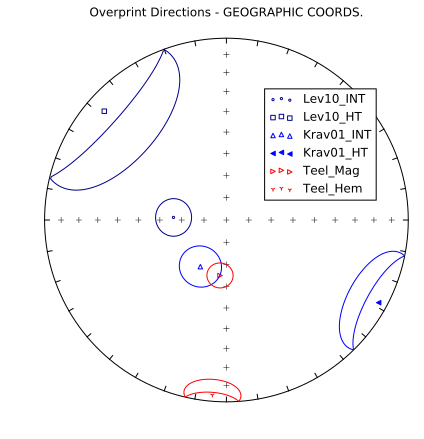

In [117]:
fignum = 1
plt.figure(num=fignum,figsize=(6,6))
ipmag.plot_net(1)
ipmag.plot_di_mean(Zav_overprints['Dec_geo'][0],Zav_overprints['Inc_geo'][0],Zav_overprints['a95_geo'][0],
                       color='darkblue',marker='.',label='Lev10_INT')
ipmag.plot_di_mean(Zav_overprints['Dec_geo'][1],Zav_overprints['Inc_geo'][1],Zav_overprints['a95_geo'][1],
                       color='darkblue',marker='s',label='Lev10_HT')
ipmag.plot_di_mean(Zav_overprints['Dec_geo'][5],Zav_overprints['Inc_geo'][5],Zav_overprints['a95_geo'][5],
                       color='b',marker='^',label='Krav01_INT')
ipmag.plot_di_mean(Zav_overprints['Dec_geo'][6],Zav_overprints['Inc_geo'][6],Zav_overprints['a95_geo'][6],
                       color='b',marker='<',label='Krav01_HT')
ipmag.plot_di_mean(Zav_overprints['Dec_geo'][7],Zav_overprints['Inc_geo'][7],Zav_overprints['a95_geo'][7],
                       color='r',marker='>',label='Teel_Mag')
ipmag.plot_di_mean(Zav_overprints['Dec_geo'][8],Zav_overprints['Inc_geo'][8],Zav_overprints['a95_geo'][8],
                       color='r',marker='1',label='Teel_Hem')

plt.title('Overprint Directions - GEOGRAPHIC COORDS.')
plt.legend(loc=(0.6,0.55))
#plt.savefig('./notebook_output/Overprints_geo.pdf')
plt.show()

Then the overprint data are plotted in tilt-corrected coordinates.

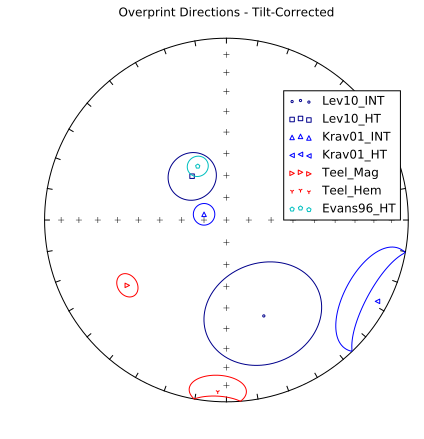

In [118]:
fignum = 1
plt.figure(num=fignum,figsize=(6,6))
ipmag.plot_net(1)
ipmag.plot_di_mean(Zav_overprints['Dec_tc'][0],Zav_overprints['Inc_tc'][0],Zav_overprints['a95_tc'][0],
                       color='darkblue',marker='.',label='Lev10_INT')
ipmag.plot_di_mean(Zav_overprints['Dec_tc'][1],Zav_overprints['Inc_tc'][1],Zav_overprints['a95_tc'][1],
                       color='darkblue',marker='s',label='Lev10_HT')
ipmag.plot_di_mean(Zav_overprints['Dec_tc'][5],Zav_overprints['Inc_tc'][5],Zav_overprints['a95_tc'][5],
                       color='b',marker='^',label='Krav01_INT')
ipmag.plot_di_mean(Zav_overprints['Dec_tc'][6],Zav_overprints['Inc_tc'][6],Zav_overprints['a95_tc'][6],
                       color='b',marker='<',label='Krav01_HT')
ipmag.plot_di_mean(Zav_overprints['Dec_tc'][7],Zav_overprints['Inc_tc'][7],Zav_overprints['a95_tc'][7],
                       color='r',marker='>',label='Teel_Mag')
ipmag.plot_di_mean(Zav_overprints['Dec_tc'][8],Zav_overprints['Inc_tc'][8],Zav_overprints['a95_tc'][8],
                       color='r',marker='1',label='Teel_Hem')
ipmag.plot_di_mean(Zav_overprints['Dec_tc'][9],Zav_overprints['Inc_tc'][9],Zav_overprints['a95_tc'][9],
                       color='c',marker='p',label='Evans96_HT')
plt.title('Overprint Directions - Tilt-Corrected')
plt.legend(loc=(0.65,0.5))
plt.savefig('./notebook_output/Overprints_TC.pdf')
plt.show()

Given geological and statistical paleomagnetic context (improvement during tilt correction) we create a plot of what we consider to be the overprint directions if they were acquired either before or after folding.

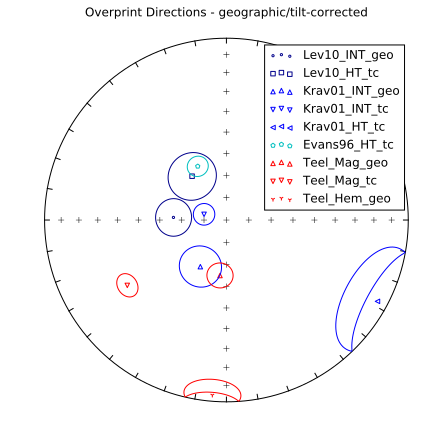

In [119]:
fignum = 1
plt.figure(num=fignum,figsize=(6,6))
ipmag.plot_net(1)
ipmag.plot_di_mean(Zav_overprints['Dec_geo'][0],Zav_overprints['Inc_geo'][0],Zav_overprints['a95_geo'][0],
                       color='darkblue',marker='.',label='Lev10_INT_geo')
ipmag.plot_di_mean(Zav_overprints['Dec_tc'][1],Zav_overprints['Inc_tc'][1],Zav_overprints['a95_tc'][1],
                       color='darkblue',marker='s',label='Lev10_HT_tc')
ipmag.plot_di_mean(Zav_overprints['Dec_geo'][5],Zav_overprints['Inc_geo'][5],Zav_overprints['a95_geo'][5],
                       color='b',marker='^',label='Krav01_INT_geo')
ipmag.plot_di_mean(Zav_overprints['Dec_tc'][5],Zav_overprints['Inc_tc'][5],Zav_overprints['a95_tc'][5],
                       color='b',marker='v',label='Krav01_INT_tc')
ipmag.plot_di_mean(Zav_overprints['Dec_tc'][6],Zav_overprints['Inc_tc'][6],Zav_overprints['a95_tc'][6],
                       color='b',marker='<',label='Krav01_HT_tc')
ipmag.plot_di_mean(Zav_overprints['Dec_tc'][9],Zav_overprints['Inc_tc'][9],Zav_overprints['a95_tc'][9],
                       color='c',marker='p',label='Evans96_HT_tc')
ipmag.plot_di_mean(Zav_overprints['Dec_geo'][7],Zav_overprints['Inc_geo'][7],Zav_overprints['a95_geo'][7],
                       color='r',marker='^',label='Teel_Mag_geo')
ipmag.plot_di_mean(Zav_overprints['Dec_tc'][7],Zav_overprints['Inc_tc'][7],Zav_overprints['a95_tc'][7],
                       color='r',marker='v',label='Teel_Mag_tc')
ipmag.plot_di_mean(Zav_overprints['Dec_geo'][8],Zav_overprints['Inc_geo'][8],Zav_overprints['a95_geo'][8],
                       color='r',marker='1',label='Teel_Hem_geo')
plt.title('Overprint Directions - geographic/tilt-corrected')
plt.legend(loc=(0.6,0.525))
plt.savefig('./notebook_output/Overprints_geo-tc.pdf')
plt.show()

As stated in the main text, the Kravchinsky et al. (2001) intermediate component from late Neoproterozoic to early Cambrian in geographic coordinates is similar to the Teel magnetite component in geographic coordinates. It is possible that the Ordovician magmatism recorded in the Teel Formation basalts caused this overprint in older lithologies.

# Data Repository References

Bachtadse, V., Pavlov, V. E., Kazansky, A. Y., and Tait, J. A., 2000, Siluro-Devonian paleomagnetic results from the Tuva Terrane (southern Siberia, Russia): implications for the paleogeography of Siberia: Journal of Geophysical Research: Solid Earth, vol. 105, pp. 13,509-13,518, doi:10.1029/1999JB900429.

Cogne, J.-P., Kravchinsky, V. A., Halim, N., and Hankard, F., 2005, Late Jurassic-Early Cretaceous closure of the Mongol-Okhotsk Ocean demonstrated by new Mesozoic palaeomagnetic results from the Trans-Baikal area (SE Siberia): Geophysical Journal International, vol. 163, pp. 813-832, doi:10.1111/j.1365-246X.2005.02782.x.

Edel, J. B., Schulmann, K., Hanzl, P., and Lexa, O., 2014, Palaeomagnetic and structural constraints on 90º anticlockwise rotation in SW Mongolia during the Permo-Triassic: Implications for Altaid oroclinal bending. Preliminary palaeomagnetic results: Journal of Asian Earth Sciences, vol. 94, pp. 157-171, doi:10.1016/j.jseaes.2014.07.039.

Evans, D. A., Zhuravlev, A. Y., Budney, C. J., and Kirschvink, J. L., 1996, Palaeomagnetism of the Bayan Gol Formation, western Mongolia: Geological Magazine, vol. 133, pp. 487-496.

Grishin, D., Didenko, A., Pechersky, D., and T.L., T., 1991, [Paleomagnetic study and petromagnetic study of structure and evolution of paleooceanic lithosphere (Phanerozoic ophiolites of Asia)] (in Russian), VNIGRI, Leningrad, Russia, pp. 135-149.

Halim, N., Kravchinsky, V., Gilder, S., Cogne, J.-P., Alexyutin, M., Sorokin, A., Courtillot, V., and Chen, Y., 1998, A palaeomagnetic study from the Mongol-Okhotsk region: rotated Early Cretaceous volcanics and remagnetized Mesozoic sediments: Earth and Planetary Science Letters, vol. 159, pp. 133-145, doi:10.1016/S0012-821X(98)00072-7.

Kovalenko, D., 2010, Paleomagnetism of Late Paleozoic, Mesozoic, and Cenozoic rocks in Mongolia: Russian Geology and Geophysics, vol. 51, pp. 387-403, doi:10.1016/j.rgg.2010.03.006.

Kravchinsky, V., Konstantinov, K., and Conge, J., 2001, Palaeomagnetic study of Vendian and Early Cambrian rocks of South Siberia and Central Mongolia: Was the Siberian platform assembled at this time?: Precambrian Research, vol. 110, pp. 61-92.

Kravchinsky, V. A., Cogne, J.-P., Harbert, W. P., and Kuzmin, M. I., 2002, Evolution of the Mongol-Okhotsk Ocean as constrained by new palaeomagnetic data from the Mongol-Okhotsk suture zone, Siberia: Geophysical Journal International, vol. 148, pp. 34-57.

Kravchinsky, V. A., Sklyarov, E. V., Gladkochub, D. P., and Harbert, W. P., 2010, Paleomagnetism of the Precambrian Eastern Sayan rocks: Implications for the Ediacaran-Early Cambrian paleogeography of the Tuva-Mongolian composite terrane: Tectonophysics, vol. 486, pp. 65-80, doi:10.1016/j.tecto.2010.02.010.

Pechersky, D. and Didenko, A., 1995, Paleo-Asian Ocean (in Russian): United Institute of Earth's Physics Publ., Moscow, 298 pp.

Pruner, P., 1992, Palaeomagnetism and palaeogeography of Mongolia from the Carboniferous to the Cretaceous - final report: Physics of the Earth and Planetary Interiors, vol. 70, pp. 169-177, doi:10.1016/0031-9201(92)90179-Y.

Van Hinsbergen, D. J. J., Straathof, G. B., Kuiper, K. F., Cunningham, W. D., and Wijbrans, J., 2008, No vertical axis rotations during Neogene transpressional orogeny in the NE Gobi Altai: coinciding Mongolian and Eurasian early Cretaceous apparent polar wander paths: Geophysical Journal International, vol. 173, pp. 105-126, doi:10.1111/j.1365-246X.2007.03712.x.